In [1]:
import numpy as np
%matplotlib inline

from devito import configuration

configuration['log-level'] = 'WARNING'

In [2]:
import scipy.io as sio
from scipy import signal
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy.signal import convolve2d
from scipy.signal import correlate2d
from scipy.signal import fftconvolve
from scipy.signal import convolve
from scipy.signal import correlate
from copy import deepcopy

# Contoh membaca file .mat
#data = sio.loadmat("BG450_model.mat")
data = np.loadtxt('Model/marmousi_model.txt')
#print(data.keys())
# Misalkan velocity model ada di key tertentu, misalnya 'velocity_model':
vp = data.T
vp = np.clip(vp, 1.5, None)
vp0 = np.loadtxt('Model/Vp0 model DIX PSTM INV NMO Rev 1.txt').T
vp0 = (vp0)/1000
vp0 = gaussian_filter(vp0, [2, 2]) #velocity model intial


import numpy as np
from scipy.ndimage import zoom

# Misal velocity adalah array (nz, nx) dengan resolusi 10 meter
# Kita ingin menginterpolasi ke resolusi 2.5 meter
#vp0 = zoom(vp0, zoom=1, order=1)  # linear interpolation


waterheight = 38

vp0[:, :waterheight] = 1.5

vp1 = deepcopy(vp0)
vp1[1311, 263] = 4.7

print(np.min(vp))
print(np.max(vp))
print(np.min(vp0))
print(np.max(vp0))
print(np.min(vp1))
print(np.max(vp1))

vp0.shape

1.5
4.7
1.5
3.7342931666996764
1.5
4.7


(1312, 264)

In [3]:
#NBVAL_IGNORE_OUTPUT
from examples.seismic import Model, plot_velocity, plot_perturbation, Receiver

# Define a physical size
shape = (vp0.shape)  # Number of grid point (nx, nz)
spacing = (12.5, 12.5)  # Grid spacing in m. The domain size is now 1km by 1km
origin = (0.,0.)  # What is the location of the top left corner. This is necessary to define
nboundary = 80


model0 = Model(vp=vp0, origin=origin, shape=shape, spacing=spacing,
              space_order=2, nbl=nboundary, bcs="damp")

model1 = Model(vp=vp1, origin=origin, shape=shape, spacing=spacing,
              space_order=2, nbl=nboundary, bcs="damp", grid = model0.grid)

model_true = Model(vp=vp, origin=origin, shape=shape, spacing=spacing,
              space_order=2, nbl=nboundary, bcs="damp", grid = model0.grid)

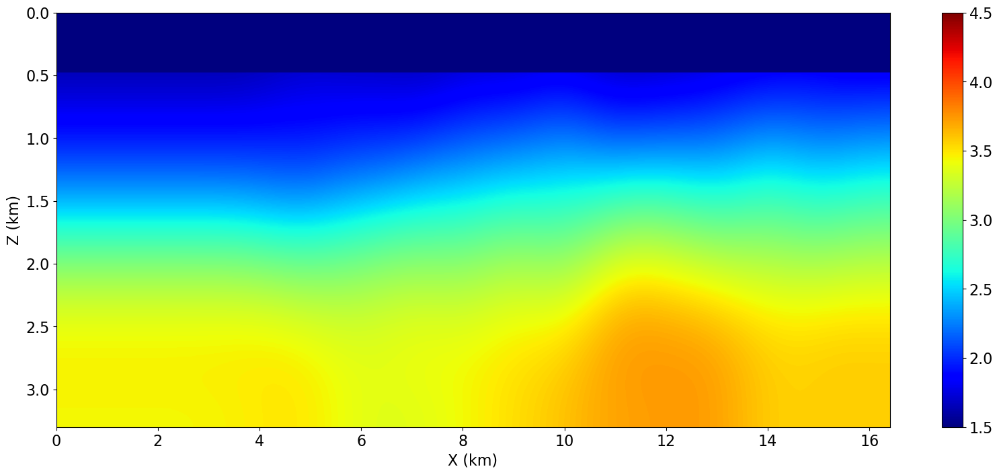

In [4]:
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=[20,8])
plt.imshow(model0.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

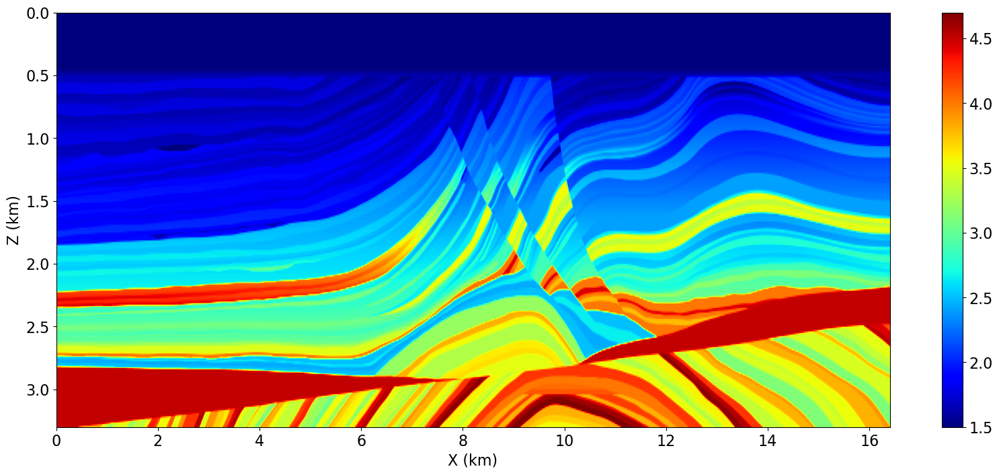

In [5]:
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=[20,8])
plt.imshow(model_true.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.7, aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

In [6]:
model1.vp.data.shape

(1472, 424)

In [7]:
def analisis_spektrum_source(source, dt):
    """
    Analisis spektrum frekuensi dari data source 1D.
    
    Parameters:
        source (np.ndarray): array 1D atau 2D (n_time, 1) dari source time signal
        dt (float): interval waktu (dalam detik)
    """
    # Jika source berdimensi (n_time, 1), ubah ke 1D
    if source.ndim == 2 and source.shape[1] == 1:
        source = source[:, 0]

    n = len(source)
    freq = np.fft.rfftfreq(n, d=dt)
    spectrum = np.abs(np.fft.rfft(source))

    # Frekuensi dominan
    f_dominan = freq[np.argmax(spectrum)]

    # Plot
    plt.figure(figsize=(8, 4))
    plt.plot(freq, spectrum, label='Spektrum')
    plt.axvline(f_dominan, color='r', linestyle='--', label=f'f_dominan = {f_dominan:.2f} Hz')
    plt.xlabel('Frekuensi (Hz)')
    plt.ylabel('Amplitudo')
    plt.title('Spektrum Frekuensi Source')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return f_dominan

    
def dominant_frequency(data, dt, plot=True):
    """
    Menghitung frekuensi dominan dari data seismik (n_time, n_receiver).
    
    Parameters:
    -----------
    data : 2D np.array
        Data seismik gather (n_time, n_receiver).
    dt : float
        Sampling interval dalam detik.
    plot : bool
        Jika True, tampilkan spektrum frekuensi rata-rata.

    Returns:
    --------
    f_dom : float
        Frekuensi dominan dalam Hz.
    f : np.array
        Array frekuensi.
    spectrum : np.array
        Rata-rata spektrum amplitudo.
    """
    n_time, _ = data.shape
    fs = 1.0 / dt  # frekuensi sampling
    f = np.fft.rfftfreq(n_time, d=dt)

    # FFT tiap trace dan ambil magnitudo, lalu rata-ratakan
    spectrum = np.abs(np.fft.rfft(data, axis=0))
    avg_spectrum = np.mean(spectrum, axis=1)

    # Ambil frekuensi dominan (frekuensi dengan amplitudo maksimum)
    f_dom = f[np.argmax(avg_spectrum)]

    if plot:
        plt.figure(figsize=(8, 4))
        plt.plot(f, avg_spectrum, label='Rata-rata Spektrum')
        plt.axvline(f_dom, color='r', linestyle='--', label=f'f_dominan = {f_dom:.2f} Hz')
        plt.xlabel('Frekuensi (Hz)')
        plt.ylabel('Amplitudo')
        plt.title('Spektrum Frekuensi Rata-rata dari Gather')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    return f_dom, f, avg_spectrum

In [8]:
#NBVAL_IGNORE_OUTPUT
# Define acquisition geometry: source
from examples.seismic import AcquisitionGeometry, TimeAxis, RickerSource

#geometry define
#source geometry
nshots = 125  # Number of shots to create gradient from
shot_first_coordinate = 4050
shot_last_coordinate = 16450
shot_depth = 0

#receriver geometry
nreceivers = 160  # Number of receiver locations per shot 
first_channel_firstlreceriverline_coordinate = 0
last_channel_firstreceiverline_coordinate = 4050
receiverline_interval = 100
receiver_depth = 0



#recording define
dt = model1.critical_dt
t0 = 0.
tn = 4500. +2
timeAx = TimeAxis(start=t0, stop=tn, step=dt)


#source define
f0 = 0.013
shift_phase = 0


In [9]:
# First, position source centrally in all dimensions, then set depth
def geometry_and_source(nshots, shot_first_coordinate, shot_last_coordinate, shot_depth, nreceivers, first_channel_firstlreceriverline_coordinate, last_channel_firstreceiverline_coordinate, receiver_depth, receiverline_interval, t0, tn, dt, f0, shift_phase):
    src_coordinates = np.empty((nshots, 2))
    src_coordinates[:, 0] = np.linspace(shot_first_coordinate, shot_last_coordinate, nshots)
    src_coordinates[:, 1] = shot_depth  # Depth is 20m

    geometrys = []

    for i in range(nshots):
        # Define acquisition geometry: receivers

        # Initialize receivers for synthetic and imaging data
        rec_coordinates = np.empty((nreceivers, 2))
        rec_coordinates[:, 0] = np.linspace(first_channel_firstlreceriverline_coordinate+(i*receiverline_interval), last_channel_firstreceiverline_coordinate+(i*receiverline_interval), nreceivers)
        rec_coordinates[:, 1] = receiver_depth  # Depth is 20m

        # Geometry
        geometry = AcquisitionGeometry(model1, rec_coordinates, src_coordinates, t0, tn, f0=f0, src_type='Ricker', dt=dt)
        geometrys.append(geometry)


    t = np.arange(t0, tn+2, (dt))
    t = t/1000
    f0z = f0*1000
    t0 =   (1/f0z)
    st = (1 - (2*(np.pi**2)*(f0z**2)*(t-t0)**2))*(np.exp(-1*(np.pi**2)*(f0z**2)*(t-t0)**2))

    wavelet = st

    angle = shift_phase
    shifted = np.real(np.exp(1j*np.radians(angle)) * signal.hilbert(wavelet))
    shifted = np.array([shifted])
    shiftedT = shifted.T

    srcs = []

    for i in range(nshots):
        src = RickerSource(name='src', grid=model0.grid, f0=f0, time_range=timeAx)
        # First, position source centrally in all dimensions, then set depth
        src.coordinates.data[0, :] = src_coordinates[i, 0]
        src.coordinates.data[0, -1] = shot_depth  # Depth is 20m
        src.data[:] = shiftedT
        srcs.append(src)

    return geometrys, srcs

In [10]:
geometrys, srcs = geometry_and_source(nshots, shot_first_coordinate, shot_last_coordinate, shot_depth, nreceivers, first_channel_firstlreceriverline_coordinate, last_channel_firstreceiverline_coordinate, receiver_depth, receiverline_interval, t0, tn, dt, f0, shift_phase)

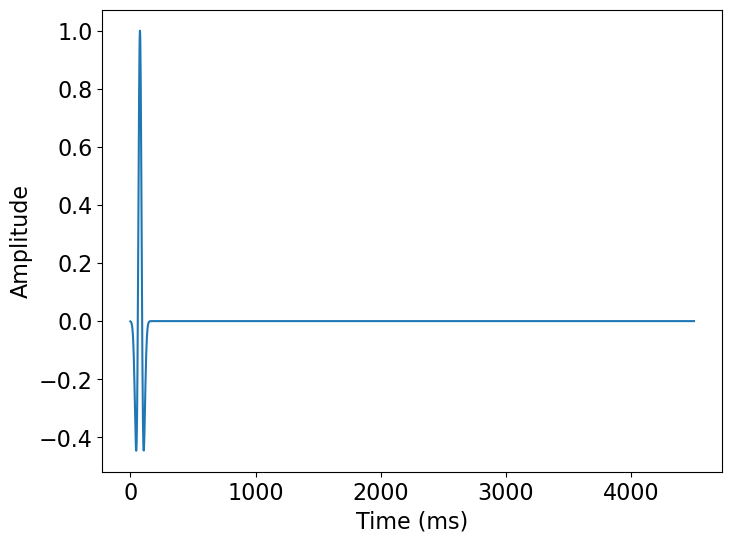

(2765, 1)
TimeAxis: start=0, stop=4502.56, step=1.629, num=2765


In [11]:
srcs[0].show()
print(srcs[0].data.shape)

print(geometrys[0])
print(geometrys[0].time_axis)

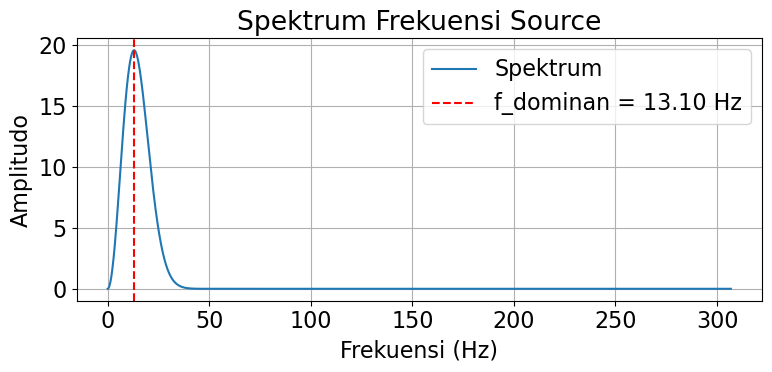

Frekuensi dominan: 13.10 Hz


In [12]:
f_dom = analisis_spektrum_source(srcs[0].data, dt=(dt/1000))
print(f"Frekuensi dominan: {f_dom:.2f} Hz")

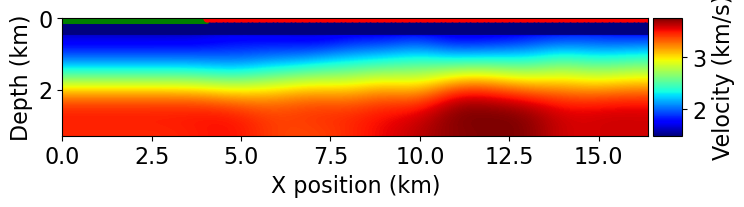

In [13]:
#NBVAL_IGNORE_OUTPUT
# Plot acquisition geometry
#plt.figure(figsize=[20,20])
plot_velocity(model0, source=geometrys[0].src_positions, receiver=geometrys[0].rec_positions)

In [14]:
# Mencari indeks geophone terdekat untuk setiap shot
geometry = geometrys[0]
nearest_indices = []
i=0
for shot in geometry.src_positions:
    distances = np.linalg.norm(geometrys[i].rec_positions - shot, axis=1)  # Hitung jarak Euclidean
    nearest_index = np.argmin(distances)  # Cari indeks dengan jarak minimum
    nearest_indices.append(nearest_index)
    i+=1

nearest_indices = np.array(nearest_indices)

#nearest_indices -= 1

print(nearest_indices)

[159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159]


In [ ]:
data_obs = []

for i in range(nshots):
        # Compute synthetic data with forward operator
        from examples.seismic.acoustic import AcousticWaveSolver

        solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)

        d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[i].time_axis,
                         coordinates=geometrys[i].rec_positions)
        # Update source location
        #geometry.src_positions[0, :] = src_coordinates[i, :]

        # Generate synthetic data from true model
        _, _, _ = solver.forward(model=model_true, src=srcs[i], rec=d_obs)

        data_obs.append(np.array(d_obs.data[:]))
        
        print(f"Shots {i+1} selesai")

data_obs = np.array(data_obs)
#np.save(f'Seismic Data/data_obs.npy', data_obs)

In [16]:
from copy import deepcopy

data_obs = np.load('Seismic Data/data_obs.npy')

data_resampled = deepcopy(data_obs)

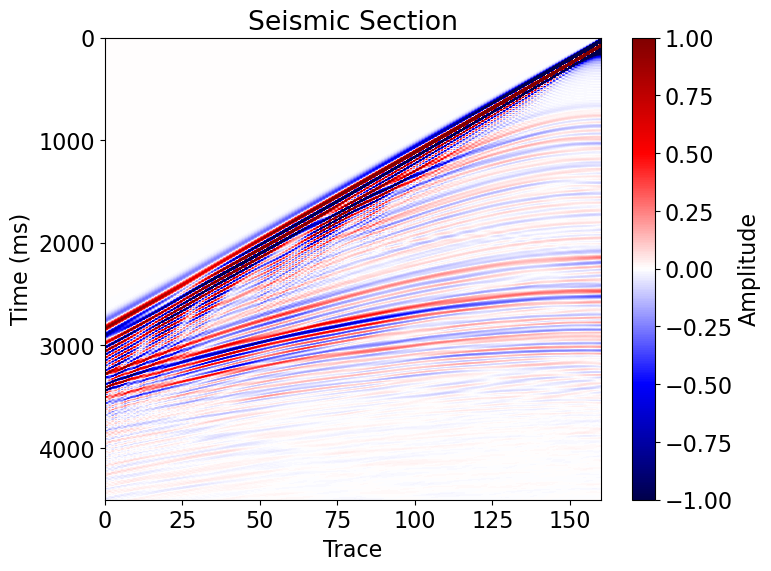

In [17]:
plt.imshow(data_resampled[0], aspect='auto', cmap='seismic', extent=[0, 160, 4504, 0], vmax=1, vmin=-1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()

In [18]:
data_resampled[0].shape
#shot_gathers[0].shape

(2765, 160)

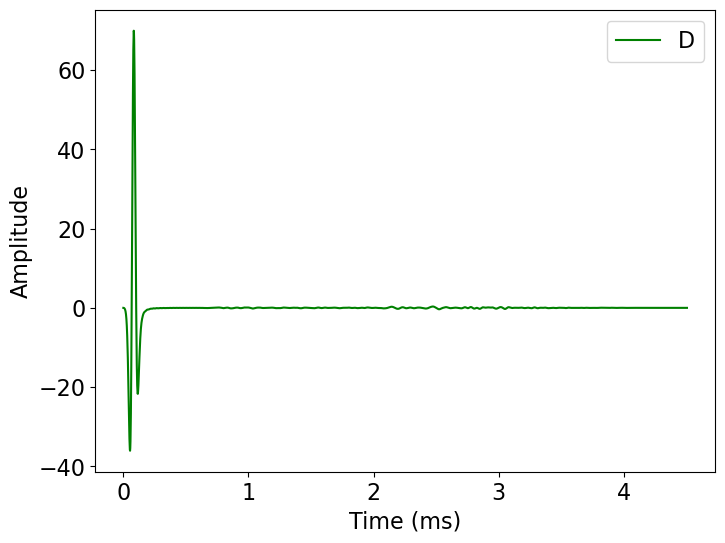

In [19]:
shot_cek = 0
CDP_cek = 159
tt = np.linspace(0, 4504, len(data_resampled[shot_cek]))/1000
plt.plot(tt, data_resampled[shot_cek][:,CDP_cek], 'g')
plt.ylabel("Amplitude")
plt.xlabel("Time (ms)")
plt.legend(f'Data Resample Sampling {dt} ms')
plt.show()

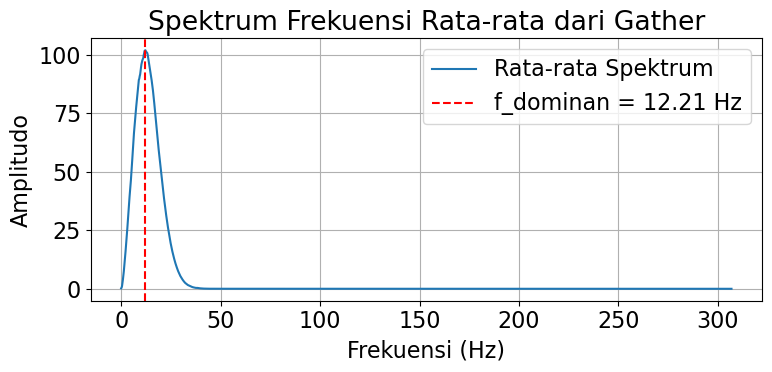

Frekuensi dominan: 12.21 Hz


In [20]:
# Misal kamu punya gather dengan shape (2000, 160), dt = 0.001 (1 ms)
f_dominan, frekuensi, spektrum = dominant_frequency(data_resampled[0], dt=(dt/1000))
print(f"Frekuensi dominan: {f_dominan:.2f} Hz")

In [21]:
from devito import Eq, Operator

# Computes the residual between observed and synthetic data into the residual
def compute_residual(residual, dobs, dsyn, kg):
    if residual.grid.distributor.is_parallel:
        # If we run with MPI, we have to compute the residual via an operator
        # First make sure we can take the difference and that receivers are at the 
        # same position
        assert np.allclose(dobs.coordinates.data[:], dsyn.coordinates.data)
        assert np.allclose(residual.coordinates.data[:], dsyn.coordinates.data)
        # Create a difference operator
        diff_eq = Eq(residual, dsyn.subs({dsyn.dimensions[-1]: residual.dimensions[-1]}) -
                               dobs.subs({dobs.dimensions[-1]: residual.dimensions[-1]}))
        Operator(diff_eq)()
    else:
        # Data ukuran (1920 x 120)
        data_1 = dsyn.data[:]
        data_2 = dobs.data[:]

        # Data ukuran (1920 x 120)
        

        # Pastikan data_2 menjadi array 1D untuk keperluan konvolusi
        filter_data1 = dobs.data[:,kg]
        filter_data2 = dsyn.data[:,kg]


        for i in range(residual.data.shape[1]):
            # Panjang data asli
            len_data1 = len(data_1)

            # Panjang hasil korelasi
            len_full = len(convolve(filter_data1, data_1[:, i], mode='full'))

            # Indeks untuk mengambil nilai tengah
            start = (len_full - len_data1) // 2
            end = start + len_data1
            
            residual.data[:, i] = convolve(data_1[:, i], filter_data1, mode='full')[:len_data1] - convolve(data_2[:, i], filter_data2, mode='full')[:len_data1]
        
        misfit_SI = deepcopy(residual)
         # Data berukuran (1920 x 1)
        
        data_1 = dobs.data[:,kg]

        # Data berukuran (1920 x 120)
        data_2 = residual.data[:]    
        # Menyimpan hasil cross-correlation
        cross_correlations = []
        len_data = len(data_1)
        # Lakukan cross-correlation untuk setiap kolom di data_2
        for i in range(data_2.shape[1]):
            result = correlate(data_2[:, i], data_1, mode='full')[len_data-1:]
            cross_correlations.append(result)
        residual.data[:] = np.array(cross_correlations).T

        #residual.data[:,159] *=0
        
        #residual.data[:] = ((residual.data[:] - residual.data[:].min())/(residual.data[:].max()-residual.data[:].min()))*((dobs.data[:].max()-dobs.data.min())+dobs.data.min())
    return misfit_SI

In [22]:
def misfit(vp_in):
    objective = 0.
    for i in range(nshots):
        # Compute synthetic data with forward operator 
        from examples.seismic.acoustic import AcousticWaveSolver

        solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)
        
        # Create placeholders for the data residual and data
        residual = Receiver(name='residual', grid=model0.grid,
                            time_range=geometrys[i].time_axis, 
                            coordinates=geometrys[i].rec_positions)
        d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[i].time_axis, 
                         coordinates=geometrys[i].rec_positions)
        d_syn = Receiver(name='d_syn', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)
        # Update source location
        #geometry.src_positions[0, :] = src_coordinates[i, :]

        # Generate synthetic data from true model
        #_, _, _ = solver.forward(vp=model.vp, src=srcs[i], rec=d_obs)
        d_obs.data[:] = data_resampled[i]

        # Compute smooth data and full forward wavefield u0
        _, _, _ = solver.forward(vp=vp_in.vp, src=srcs[i], rec=d_syn)

        # Compute gradient from data residual and update objective function 
        misfit_SI = compute_residual(residual, d_obs, d_syn, nearest_indices[i])
        objective += 0.5*norm(misfit_SI)**2
        #residual.data[:] = d_obs.data[:] - d_syn.data[:]
        #objective += 0.5*norm(residual)**2
    return objective
    

In [23]:
def cubic_interpolation(alpha0, alpha1, f0, f1, df0, df1):
    """
    alpha0 = 0 (biasanya)
    alpha1 = nilai alpha awal (misal 1)
    f0, f1 = nilai fungsi misfit di alpha0 dan alpha1
    df0, df1 = arah turun di alpha0 dan alpha1 (dot product grad * direction)
    """

    d1 = df0 + df1 - 3 * ((f0 - f1) / (alpha0 - alpha1))
    d2 = np.sign(alpha1 - alpha0) * np.sqrt(d1**2 - df0 * df1)

    alpha_new = alpha1 - (alpha1 - alpha0) * (df1 + d2 - d1) / (df1 - df0 + 2*d2)
    alpha_new = max(0.1 * alpha1, min(alpha_new, 0.9 * alpha1))
    return alpha_new


def linesearch(vp_in, ff, g, p, a=0.0001, b=0.1, l=1, max_iter=5, max_l=5., min_l= 0.1, scale_l = 2):
    from copy import deepcopy
    from devito import mmax
    import numpy as np
    import time as tm

    ni = 0
    g_inner = g.data[nboundary:-nboundary, nboundary:-nboundary]
    p_inner = p.data[nboundary:-nboundary, nboundary:-nboundary]
    gtp = np.sum(g_inner * p_inner) # gradien awal dot arah
    best_l = 0
    best_ff2 = ff
    gtp_best = np.copy(gtp)
    g2_best = deepcopy(g)

    l_option = 0.
    ff_option = 0.
    g_option = deepcopy(g)
    g_option = deepcopy(g)


    while ni < max_iter:
        vp2 = deepcopy(vp_in)
        vp2.vp.data[:] = vp_in.vp.data[:] + (l) * (p.data[:])
        vp2.vp.data[:] = np.clip(vp2.vp.data[:], 1.5, 4.7)

        start_time = tm.time()

        time_start = datetime.now()
        print("Program dimulai pada:", time_start.strftime("%H:%M:%S"))
        
        ff2, g2 = fwi_gradient(vp2.vp)
        end_time = tm.time()

        print(f"Waktu eksekusi: {end_time - start_time:.2f} detik")
        
        g2.data[:] *= -1
        g2_inner = g2.data[nboundary:-nboundary, nboundary:-nboundary]
        g2tp = np.sum(g2_inner[:] * p_inner)

        if l == 0:
            l = min_l

        if ff2 > ff:
            p.data[:] = deepcopy(g.data[:])
            p.data[:] *= -1

        if ff2 < ff :
           l_option = deepcopy(l)
           ff_option = deepcopy(ff2)
           g_option = deepcopy(g)

        # Cek sufficient decrease (Armijo)
        print(f"ff2 = {ff2}, ff + a * l * gtp = {ff + a * l * gtp}, a*l*gtp = {a*l*gtp}")
        print(f"abs(g2tp) = {abs(g2tp)}, abs(b*gtp) = {abs(b*gtp)}")
        print(f"g2tp = {(g2tp)}, (b*gtp) = {(b*gtp)}")
        print(" ")
        if ff2 <= ff + a * l * gtp:
            # Simpan sebagai kandidat terbaik jika Armijo terpenuhi
            if best_l == 0 or ff2 < best_ff2:
                best_l = l
                best_ff2 = ff2
                gtp_best = deepcopy(g2tp)
                g2_best.data[:] = g2.data[:]

            # Cek curvature condition
            if (g2tp) >= (b * gtp):
                print(f"Strong Wolfe satisfied, l best : {l}")
                best_l = l
                best_ff2 = ff2
                gtp_best = deepcopy(g2tp)
                g2_best.data[:] = g2.data[:]

                return best_l, best_ff2, g2_best  # Strong Wolfe satisfied
            else:
                if l >= max_l:
                    l = cubic_interpolation(0, l, ff, ff2, gtp, g2tp)
                    print(f"Armijo satisfied but curvature not satisfied and l>{max_l}, l update : {l}")
                else:
                  l *= scale_l
                  print(f"Armijo satisfied but curvature not satisfied, l update : {l}")
        else:
          if ff2 < ff :
            if (g2tp) >= (b * gtp):
               l*=scale_l
               print(f"Armijo not satisfied, ff2 < ff, but curvature satisfied l update : {l}")
            else :
               l = cubic_interpolation(0, l, ff, ff2, gtp, g2tp)
               print(f"Armijo not satisfied, ff2<ff, curvature not satisfied l update : {l}")
          else:
                l = cubic_interpolation(0, l, ff, ff2, gtp, g2tp)
                print(f"nether wolve satisfied and l>{max_l}, l update : {l}")
        ni += 1
        nshots
    if best_l != 0 :
        print(f"Strong Wolfe not satisfied. Returning best Armijo-satisfying l : {best_l}")
        return best_l, best_ff2, g2_best
    else:
        if (l_option == 0):
            best_l = cubic_interpolation(0, l, ff, ff2, gtp, g2tp)
            vp2 = deepcopy(vp_in)
            vp2.vp.data[:] = vp_in.vp.data[:] + (l) * (p.data[:])
            vp2.vp.data[:] = np.clip(vp2.vp.data[:], 1.5, 4.7)

            start_time = tm.time()
            time_start = datetime.now()
            
            print("Program dimulai pada:", time_start.strftime("%H:%M:%S"))

            ff2, g2 = fwi_gradient(vp2.vp)
            
            end_time = tm.time()
            print(f"Waktu eksekusi: {end_time - start_time:.2f} detik")


            best_ff2 = deepcopy(ff2)
            g2_best = deepcopy(g2)
            print(f"No condition satisfied. Returning l interpolated : {best_l}")
        else :
           best_l = deepcopy(l_option)
           best_ff2 = deepcopy(ff_option)
           g2_best = deepcopy(g_option)
        return best_l, best_ff2, g2_best


def cg_fr(g0, g1, p):
  g0_inner = g0.data[nboundary:-nboundary, nboundary:-nboundary]
  g1_inner = g1.data[nboundary:-nboundary, nboundary:-nboundary]
  B = np.sum(g0_inner*g1_inner)/np.sum(g0_inner*g0_inner)
  p.data[:] = -1*g1.data[:] + B*p.data[:]
  p.data[:] /= np.max(np.abs(p.data[:]))
  
  print(f"Nilai B : {B}")
  return p


def cg_pr(g0, g1, p):
    g0_inner = g0.data[nboundary:-nboundary, nboundary:-nboundary]
    g1_inner = g1.data[nboundary:-nboundary, nboundary:-nboundary]
    y = g1_inner - g0_inner
    B = np.sum(g1_inner * y) / np.sum(g0_inner * g0_inner)
    if B < 0:
        B = 0  # Reset jika tidak descent
    p.data[:] = -1 * g1.data[:] + B * p.data[:]
    p.data[:] /= np.max(np.abs(p.data[:]))

    print(f"Nilai B : {B}")
    return p

def cg_hs(g0, g1, p):
    g0_inner = g0.data[nboundary:-nboundary, nboundary:-nboundary]
    g1_inner = g1.data[nboundary:-nboundary, nboundary:-nboundary]
    p_inner = p.data[nboundary:-nboundary, nboundary:-nboundary]
    y = g1_inner - g0_inner
    denom = np.sum(p_inner * y)
    if denom == 0:
        B = 0  # Hindari pembagian nol
    else:
        B = np.sum(g1_inner * y) / denom
    if B < 0:
        B = 0  # Reset jika arah tidak descent
    p.data[:] = -1 * g1.data[:] + B * p.data[:]
    p.data[:] /= np.max(np.abs(p.data[:]))

    print(f"Nilai B : {B}")
    return p

In [24]:
from devito import Function

waterheight = 38
watermute = Function(name="watermute", grid=model0.grid)
watermute.data[:,nboundary+waterheight:] += 1

modelpad = 160
modelpadmute = Function(name="modelpadmute", grid=model0.grid)
modelpadmute.data[nboundary+modelpad:,:] += 1
#modelpadmute.data[280-(nboundary+modelpad):280,:] = 0

In [25]:
from devito import Function, mmax
from examples.seismic.acoustic import AcousticWaveSolver
from examples.seismic import Receiver
from devito import norm
import numpy as np

def fwi_gradient_per_shot(i, geometrys, srcs, data_resampled, nearest_indices, vp_in):

    grad = Function(name="grad", grid=model0.grid)
    
    solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)
    
    residual = Receiver(name='residual', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)
    d_obs = Receiver(name='d_obs', grid=model0.grid,
                     time_range=geometrys[i].time_axis, 
                     coordinates=geometrys[i].rec_positions)
    d_syn = Receiver(name='d_syn', grid=model0.grid,
                    time_range=geometrys[i].time_axis, 
                    coordinates=geometrys[i].rec_positions)

    d_obs.data[:] = data_resampled[i]
    
    _, u0, _ = solver.forward(vp=vp_in, save=True, src=srcs[i], rec=d_syn)

    compute_residual(residual, d_obs, d_syn, nearest_indices[i])
    
    phi = .5 * norm(residual)**2
    
    solver.gradient(rec=residual, u=u0, vp=vp_in, grad=grad)
    
    return phi, grad.data




import multiprocessing as mp

num_workers = 3  # atur jumlah core di sini


def fwi_gradient_parallel(vp_in):
    with mp.Pool(processes=num_workers) as pool:
        results = pool.starmap(
            fwi_gradient_per_shot,
            [(i, geometrys, srcs, data_resampled, nearest_indices, vp_in)
             for i in range(nshots)]
        )
    
    grad = Function(name="grad", grid=model0.grid)
    gradNormalized = Function(name="gradNormalized", grid=model0.grid)
    total_phi = 0.0

    for phi_i, grad_i in results:
        grad.data[:] += grad_i
        total_phi += phi_i

    grad.data[:] *= watermute.data[:]
    grad.data[:] *= modelpadmute.data[:]

    gradNormalized.data[:] = grad.data[:]/mmax(grad)

    return total_phi, gradNormalized


In [26]:
# Create FWI gradient kernel 
from devito import Function, TimeFunction, norm, mmax

from examples.seismic import Receiver, plot_shotrecord

import scipy
def fwi_gradient(vp_in):    
    # Create symbols to hold the gradient
    grad = Function(name="grad", grid=model0.grid)
    
    objective = 0.
    for i in range(nshots):
        # Compute synthetic data with forward operator 
        from examples.seismic.acoustic import AcousticWaveSolver

        solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)
        
        # Create placeholders for the data residual and data
        residual = Receiver(name='residual', grid=model0.grid,
                            time_range=geometrys[i].time_axis, 
                            coordinates=geometrys[i].rec_positions)
        d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[i].time_axis, 
                         coordinates=geometrys[i].rec_positions)
        d_syn = Receiver(name='d_syn', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)

        
        # Update source location
        #geometry.src_positions[0, :] = src_coordinates[i, :]

        # Generate synthetic data from true model
        #_, _, _ = solver.forward(vp=model.vp, src=srcs[0i, rec=d_obs)
        d_obs.data[:] = data_resampled[i]

        # Compute smooth data and full forward wavefield u0
        _, u0, _ = solver.forward(vp=vp_in, save=True, src=srcs[i], rec=d_syn)
        
        #plot_shotrecord(d_syn.data[:], mresidual.data[:,159] *=0odel0, t0,tn)
        # Compute gradient from data residual and update objective function 
        misfit_SI = compute_residual(residual, d_obs, d_syn, nearest_indices[i])
        objective += .5*norm(misfit_SI)**2
        
        #residual.data[:] = d_obs.data[:] - d_syn.data[:]
        #objective += .5*norm(residual)**2
        
        #plot_shotrecord(residual.data, model, t0, tn)
        solver.gradient(rec=residual, u=u0, vp=vp_in, grad=grad)
        
        
    gradNormalized = Function(name="gradNormalized", grid=model0.grid)
    #Normalisasi ke rentang [-1, 1]
    gradNormalized.data[:] = grad.data[:]
    gradNormalized.data[:] *= watermute.data[:]
    gradNormalized.data[:] *= modelpadmute.data[:]
    gradNormalized.data[:] = gaussian_filter(gradNormalized.data[:], sigma = [2,2])
    gradNormalized.data[:] = gradNormalized.data[:]/np.max(np.abs(gradNormalized.data[:]))
    
    return objective, gradNormalized

In [27]:
model0.m

vp(x, y)**(-2)

In [59]:
from examples.seismic.acoustic import AcousticWaveSolver, AdjointOperator

i = 124

vp_in = model0.vp


solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)
        

grad = Function(name="grad", grid=model0.grid)
        # Create placeholders for the data residual and data
residual = Receiver(name='residual', grid=model0.grid,
                            time_range=geometrys[i].time_axis, 
                            coordinates=geometrys[i].rec_positions)
d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[i].time_axis, 
                         coordinates=geometrys[i].rec_positions)
d_syn = Receiver(name='d_syn', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)

        
        # Update source location
        #geometry.src_positions[0, :] = src_coordinates[i, :]

        # Generate synthetic data from true model
        #_, _, _ = solver.forward(vp=model.vp, src=srcs[0i, rec=d_obs)
d_obs.data[:] = data_resampled[i]

        # Compute smooth data and full forward wavefield u0
_, u0, _ = solver.forward(vp=vp_in, save=True, src=srcs[i], rec=d_syn)
        
        #plot_shotrecord(d_syn.data[:], model0, t0,tn)
        # Compute gradient from data residual and update objective function 
#compute_residual(residual, d_obs, d_syn, nearest_indices[62])
residual.data[:] = d_obs.data[:] - d_syn.data[:]
        
objective = .5*norm(residual)**2


        #plot_shotrecord(residual.data, model, t0, tn)
_, v0, _ = solver.adjoint(rec=residual, vp=vp_in, save=True)



'''solver.gradient(rec=residual, u=u0, vp=vp_in, grad=grad)

gradNormalized = Function(name="gradNormalized", grid=model0.grid)
    #Normalisasi ke rentang [-1, 1]
gradNormalized.data[:] = grad.data[:]
gradNormalized.data[:] *= watermute.data[:]
gradNormalized.data[:] *= modelpadmute.data[:]
gradNormalized.data[:] = gaussian_filter(gradNormalized.data[:], sigma = [2,2])
gradNormalized.data[:] = gradNormalized.data[:]/np.max(np.abs(gradNormalized.data[:]))'''

No source type defined, returning uninitiallized (zero) source
No source type defined, returning uninitiallized (zero) source


'solver.gradient(rec=residual, u=u0, vp=vp_in, grad=grad)\n\ngradNormalized = Function(name="gradNormalized", grid=model0.grid)\n    #Normalisasi ke rentang [-1, 1]\ngradNormalized.data[:] = grad.data[:]\ngradNormalized.data[:] *= watermute.data[:]\ngradNormalized.data[:] *= modelpadmute.data[:]\ngradNormalized.data[:] = gaussian_filter(gradNormalized.data[:], sigma = [2,2])\ngradNormalized.data[:] = gradNormalized.data[:]/np.max(np.abs(gradNormalized.data[:]))'

In [60]:
v0.data.shape

(3126, 1472, 424)

In [62]:
print(dt*3125)

4503.124952316284


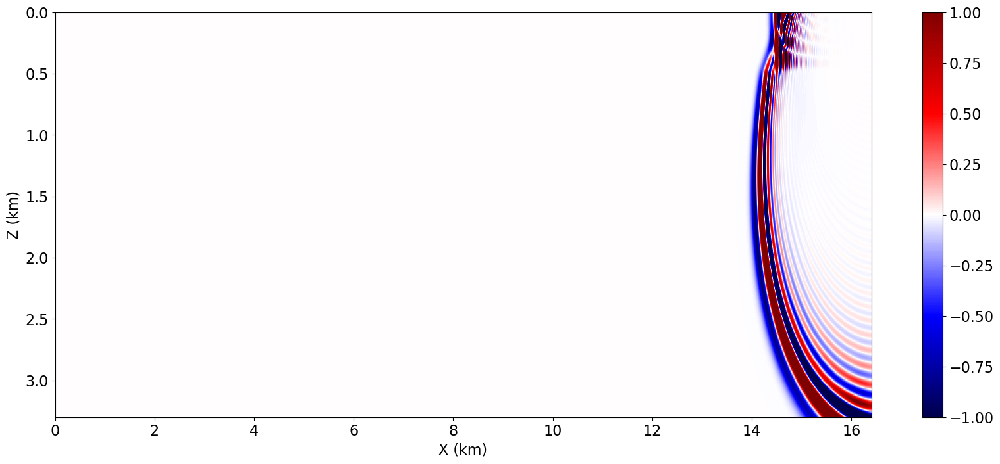

In [63]:
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(u0.data[1000][nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', vmin=-1, vmax=1, aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

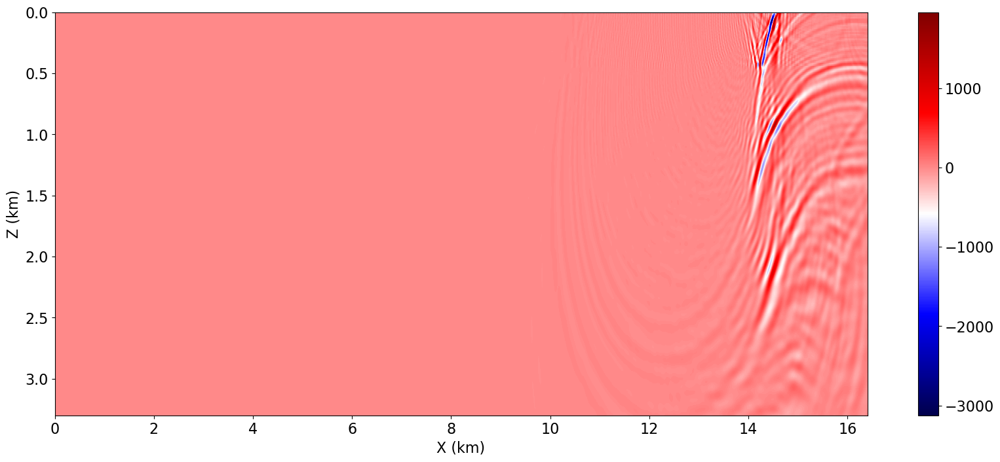

In [64]:
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(v0.data[1000][nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic',aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

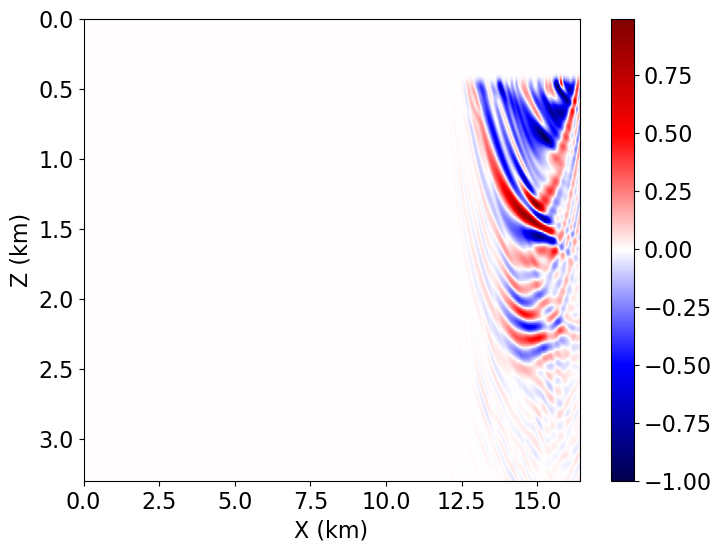

-1.0


In [64]:
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.imshow(gradNormalized.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

print(gradNormalized.data.min())

In [65]:
import numpy as np
import matplotlib.pyplot as plt

def plot_wavefield_overlay(velocity, wavefield, time_step, cmap_wave='seismic', alpha=0.3):
    """
    Overlay wavefield snapshot pada model velocity.
    
    Parameters:
    - velocity: 2D array (n_x, n_z)
    - wavefield: 3D array (n_time, n_x, n_z)
    - time_step: waktu (index) yang ingin dipilih
    - cmap_wave: colormap untuk wavefield
    - alpha: transparansi overlay wavefield
    """
    fig, ax = plt.subplots(figsize=(10, 6))

    xmin = (origin[0]*spacing[0])/1000
    zmin = (origin[1]*spacing[1])/1000
    xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
    zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000

    velocity = velocity.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]]

    
    # Plot background velocity
    im1 = ax.imshow(velocity.T, cmap='jet', origin='upper', aspect='auto', interpolation='none', vmin=1.5, vmax=4.5)
    
    # Overlay wavefield pada waktu tertentu
    wave = wavefield.data[time_step][nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]]
    im2 = ax.imshow(wave.T, cmap=cmap_wave, origin='upper', alpha=alpha, aspect='auto', interpolation='none')
    

    
    plt.colorbar(im1, ax=ax, label='Velocity (m/s)')
    plt.colorbar(im2, ax=ax, label='Wavefield Amplitude', orientation='vertical')
    
    ax.set_title(f'Wavefield overlay at time step {time_step}')
    ax.set_xlabel('X')
    ax.set_ylabel('Z')
    plt.tight_layout()
    plt.figure(figsize=(20, 8))
    plt.show()

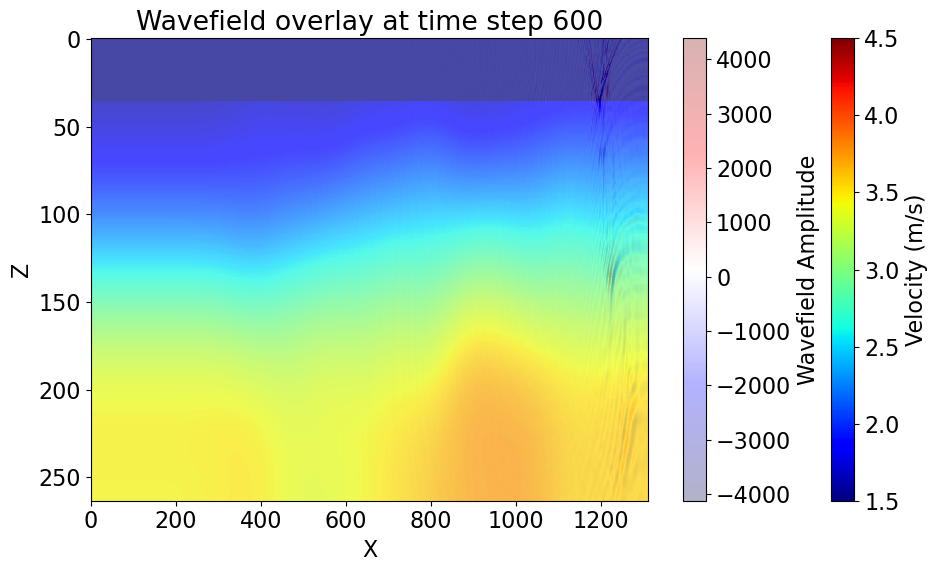

<Figure size 2000x800 with 0 Axes>

In [66]:
plot_wavefield_overlay(velocity=model0, wavefield=v0, time_step=600)

In [57]:
from examples.seismic.acoustic import AcousticWaveSolver
from copy import deepcopy

i = 124

solver = AcousticWaveSolver(model1, geometrys[i], space_order=2)
        
# Create placeholders for the data residual and data
residual = Receiver(name='residual', grid=model0.grid,
                            time_range=geometrys[i].time_axis, 
                            coordinates=geometrys[i].rec_positions)
d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[i].time_axis, 
                         coordinates=geometrys[i].rec_positions)
d_syn = Receiver(name='d_syn', grid=model0.grid,
                        time_range=geometrys[i].time_axis, 
                        coordinates=geometrys[i].rec_positions)
grad = Function(name="grad", grid=model0.grid)

        
        # Update source location
        #geometry.src_positions[0, :] = src_coordinates[i, :]

        # Generate synthetic data from true model
        #_, _, _ = solver.forward(vp=model.vp, src=srcs[0i, rec=d_obdata_1,s)
d_obs.data[:] = data_resampled[i]
#d_obs.data[:] /= norm(d_obs)

        # Compute smooth data and full forward wavefield u0
_, u0, _ = solver.forward(vp=model0.vp, save=True, src=srcs[i], rec=d_syn)

#d_syn.data[:] /= norm(d_syn)
        
        #plot_shotrecord(d_syn.data[:], model0, t0,tn)
        # Compute gradient from data residual and update objective function 
misfit_SI = compute_residual(residual, d_obs, d_syn, nearest_indices[i])
        
objective = .5*norm(misfit_SI)**2

alpha = np.sum(d_obs.data[:] * d_syn.data[:])/np.sum(d_syn.data[:] * d_obs.data[:])
        


'''#solver.gradient(rec=residual, u=u0, vp=model0.vp, grad=grad)

gradNormalized = Function(name="gradNormalized", grid=model.grid)
    #Normalisasi ke rentang [-1, 1]
gradNormalized.data[:] *= watermute.data[:]
gradNormalized.data[:] = grad.data[:]/np.max(np.abs(grad.data[:]))
    #gradNormalized.data[:] *= modelpadmute.data[:]'''

print(f'misfit = {objective}')

misfit = 18573817745.742676


In [98]:
alpha = np.linalg.norm(d_obs.data[:])/np.linalg.norm(d_syn.data[:])

print(alpha)

17.608896


In [99]:
residual = d_obs.data[:] - alpha*d_syn.data[:]

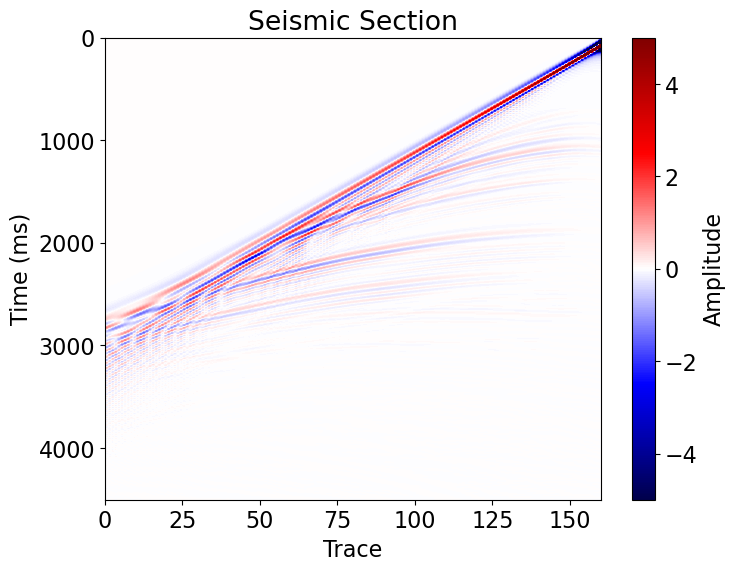

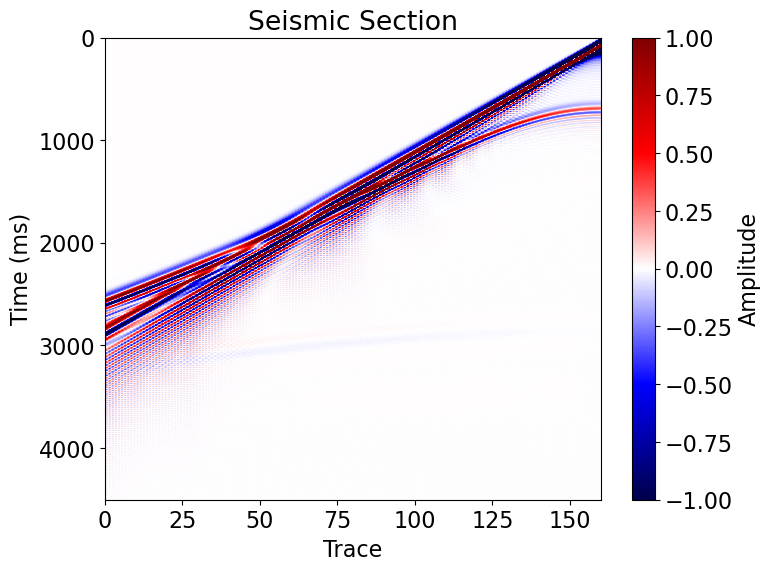

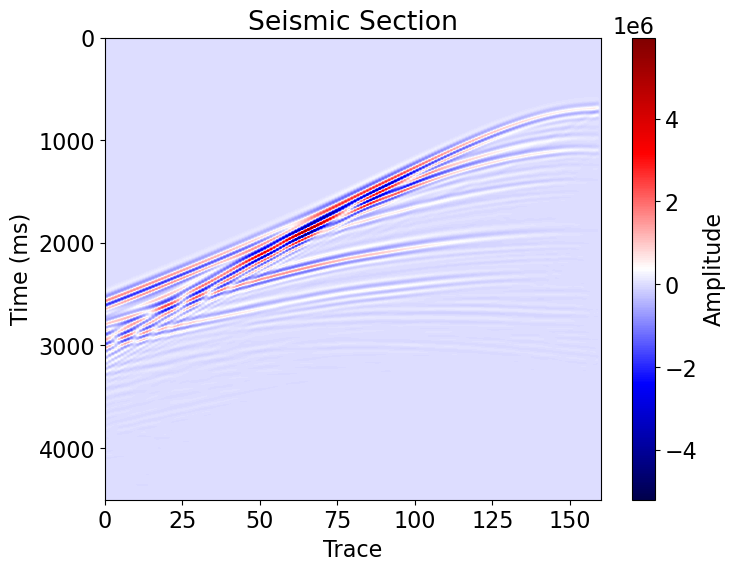

In [58]:
plt.imshow(d_obs.data[:], aspect='auto', cmap='seismic', extent=[0, 160, 4504, 0], vmin=-5, vmax=5)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()
plt.imshow(d_syn.data[:], aspect='auto', cmap='seismic', extent=[0, 160, 4504, 0], vmin = -1, vmax=1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()
plt.imshow(residual.data, aspect='auto', cmap='seismic', extent=[0, 160, 4504, 0])
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()

In [59]:
print(np.max(d_obs.data))
print(np.min(d_obs.data))

69.96382
-36.05922


In [60]:
print(np.max(d_syn.data))
print(np.min(d_syn.data))

69.96382
-36.05922


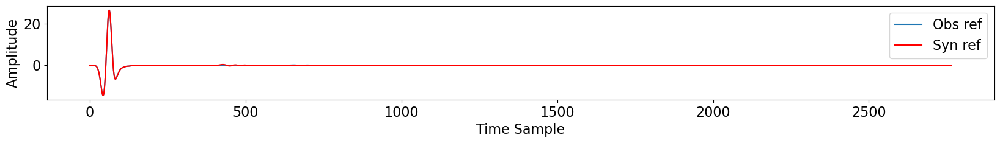

In [61]:
plt.figure(figsize=(20,2))
plt.plot(d_obs.data[:, 158], label="Obs ref")
plt.plot(d_syn.data[:, 158], 'r', label="Syn ref")
plt.ylabel("Amplitude")
plt.xlabel("Time Sample")
plt.legend()
plt.show()

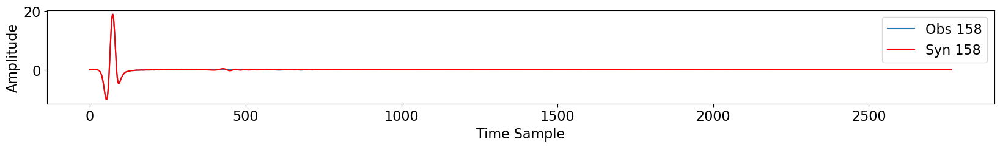

In [62]:
plt.figure(figsize=(20,2))
plt.plot(d_obs.data[:, 157], label="Obs 158")
plt.plot(d_syn.data[:, 157], 'r', label="Syn 158")
plt.ylabel("Amplitude")
plt.xlabel("Time Sample")
plt.legend(loc='upper right')
plt.show()

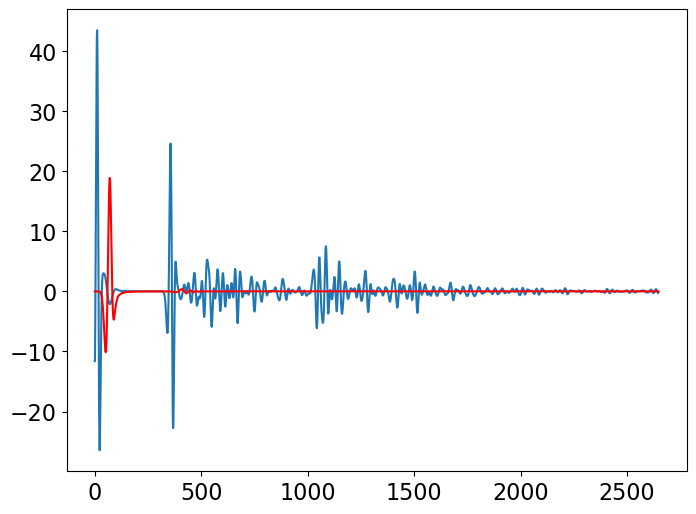

In [78]:
plt.plot(d_obs.data[:, 158])
plt.plot(d_syn.data[:, 157], 'r')
plt.show()

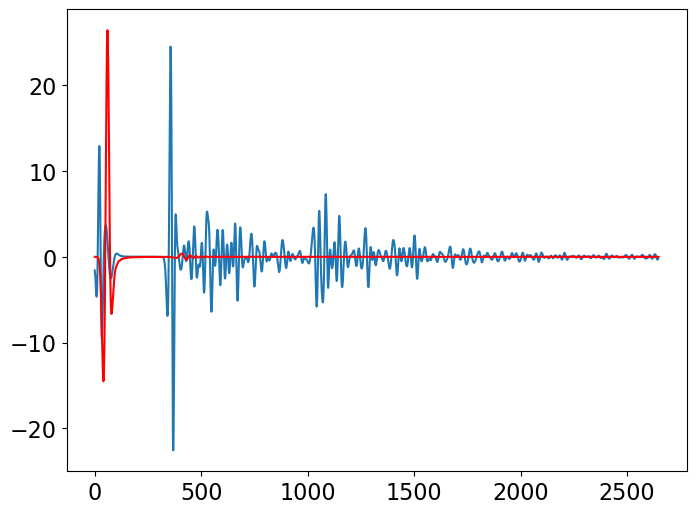

In [79]:
plt.plot(d_obs.data[:, 157])
plt.plot(d_syn.data[:, 158], 'r')
plt.show()

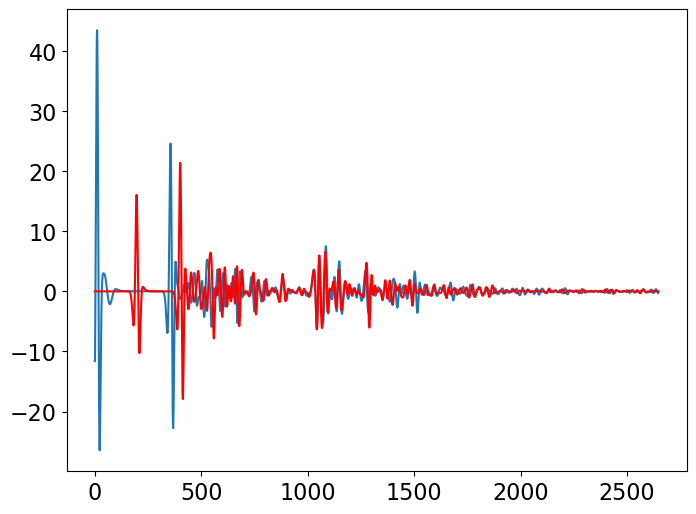

In [76]:
plt.plot(d_obs.data[:, 158])
plt.plot(d_obs.data[:, 140], 'r')
plt.show()

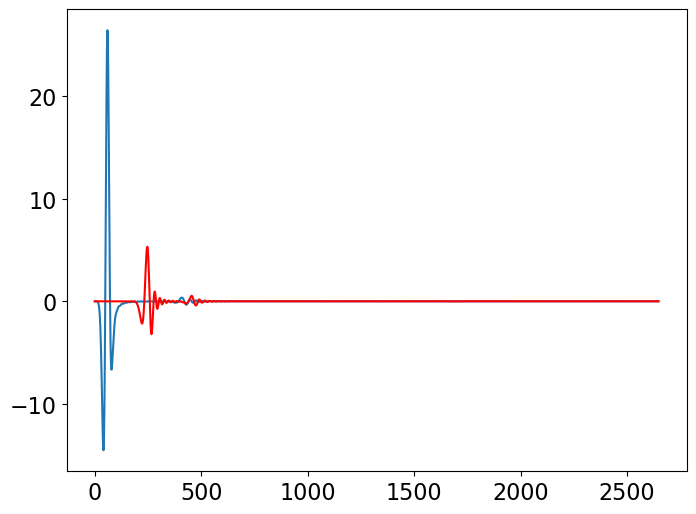

In [77]:
plt.plot(d_syn.data[:, 158])
plt.plot(d_syn.data[:, 140], 'r')
plt.show()

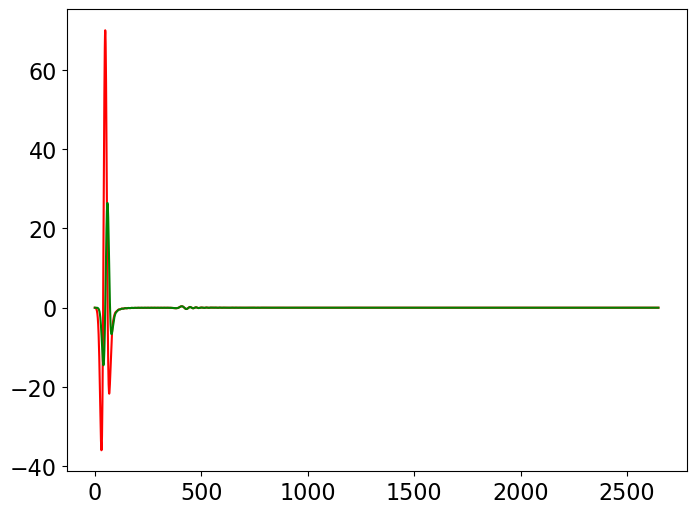

In [73]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_syn.data[:, 159], 'r')
plt.plot(d_syn.data[:, 158], 'g')
plt.show()

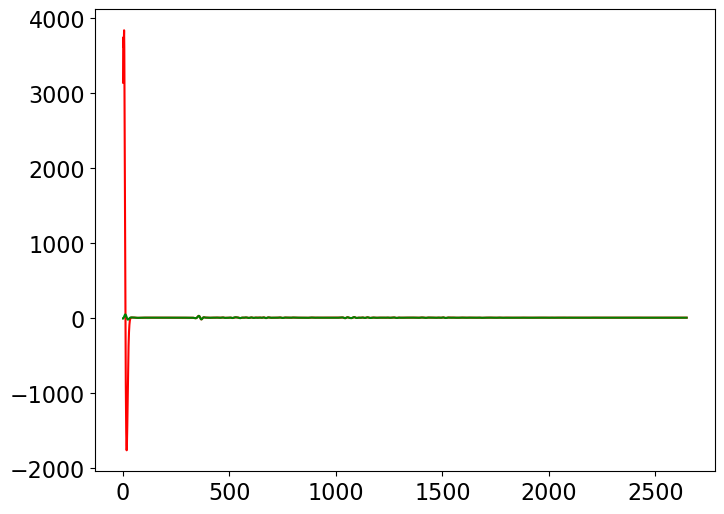

In [74]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_obs.data[:, 159], 'r')
plt.plot(d_obs.data[:, 158], 'g')
plt.show()

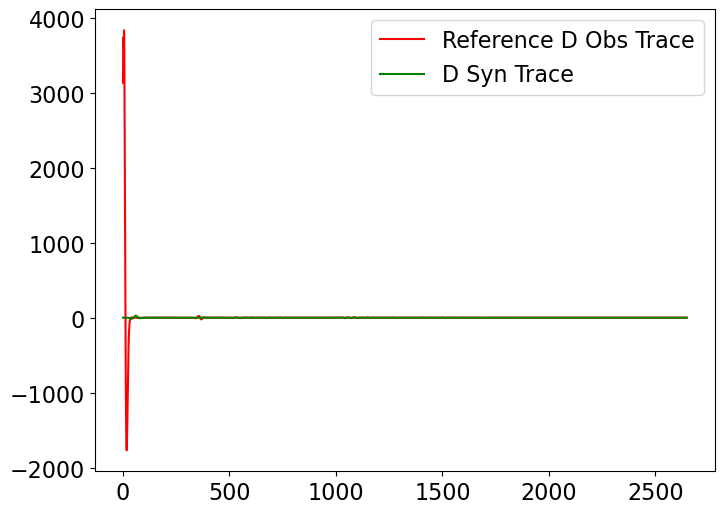

In [76]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_obs.data[:, 159], 'r', label='Reference D Obs Trace')
plt.plot(d_syn.data[:, 158], 'g', label='D Syn Trace')
plt.legend()
plt.show()

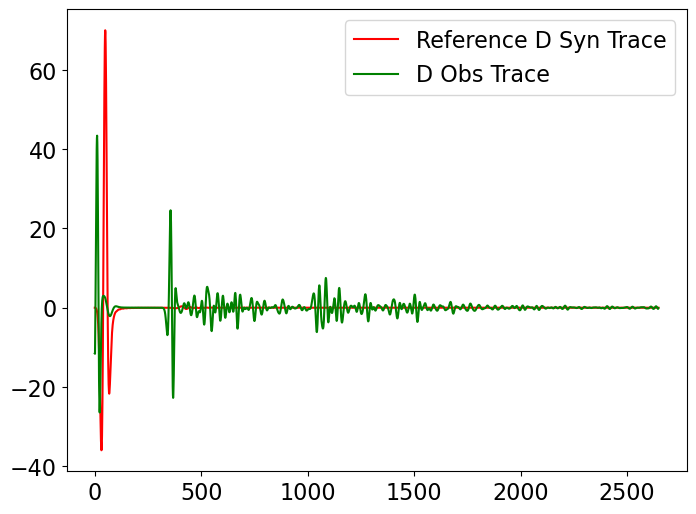

In [77]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_syn.data[:, 159], 'r', label='Reference D Syn Trace')
plt.plot(d_obs.data[:, 158], 'g', label='D Obs Trace')
plt.legend()
plt.show()

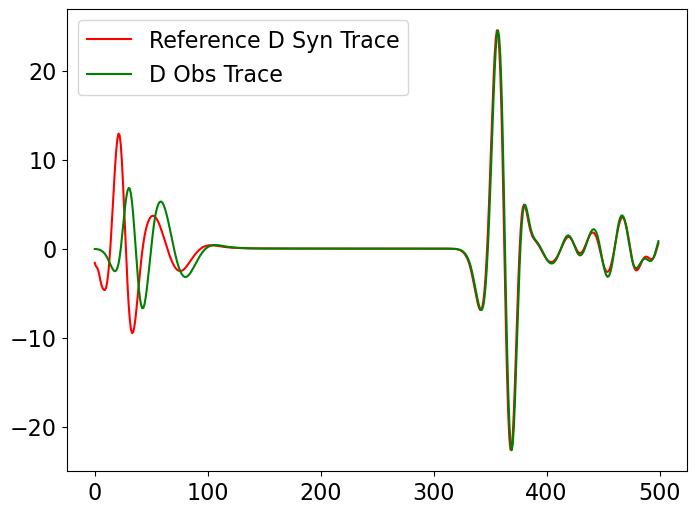

In [78]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_obs.data[:500, 157], 'r', label='Reference D Syn Trace')
plt.plot(d_obs.data[:500, 156], 'g', label='D Obs Trace')
plt.legend()
plt.show()

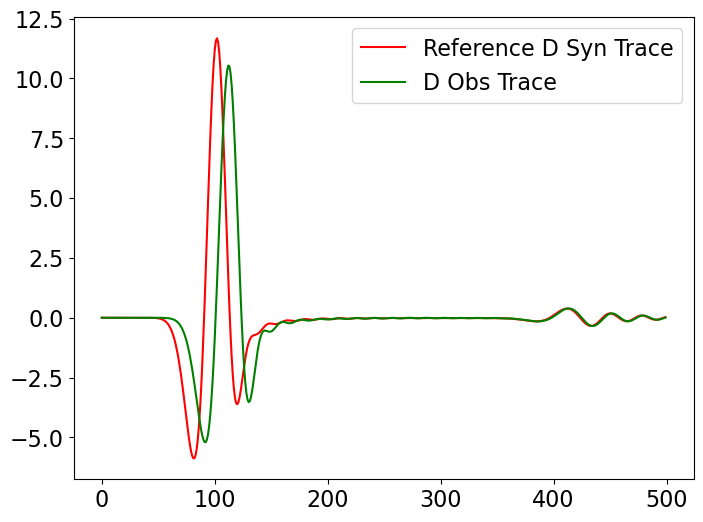

In [79]:
#plt.plot(d_obs.data[:, 159])
plt.plot(d_syn.data[:500, 154], 'r', label='Reference D Syn Trace')
plt.plot(d_syn.data[:500, 153], 'g', label='D Obs Trace')
plt.legend()
plt.show()

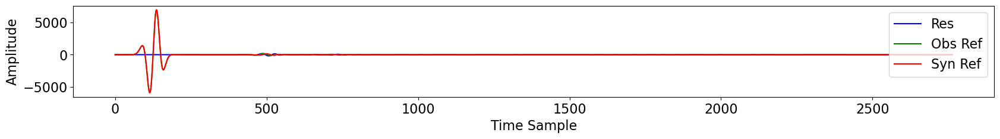

In [63]:
len_data = len(d_obs.data)
trace_cek = 157
trace_ref = 158
residual.data[:, trace_cek] = convolve(d_syn.data[:, trace_cek], d_obs.data[:, trace_ref], mode='full')[:len_data] - convolve(d_obs.data[:, trace_cek], d_syn.data[:, trace_ref], mode='full')[:len_data]

plt.figure(figsize=(20,2))
plt.plot(residual.data[:,trace_cek], 'b', label="Res")
plt.plot(convolve(d_syn.data[:, trace_cek], d_obs.data[:, trace_ref], mode='full')[:len_data], color='g', label="Obs Ref")
plt.plot(convolve(d_obs.data[:, trace_cek], d_syn.data[:, trace_ref], mode='full')[:len_data], color='r', label="Syn Ref")
plt.ylabel("Amplitude")
plt.xlabel("Time Sample")
plt.legend(loc="upper right")
plt.show()

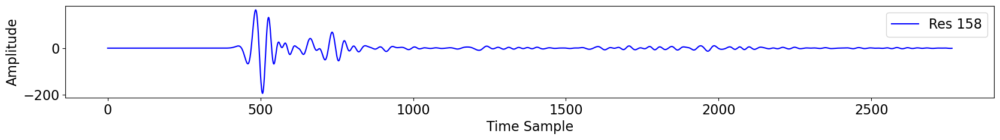

In [64]:
plt.figure(figsize=(20,2))
plt.plot(residual.data[:,trace_cek], 'b', label="Res 158")
plt.ylabel("Amplitude")
plt.xlabel("Time Sample")
plt.legend(loc="upper right")
plt.show()

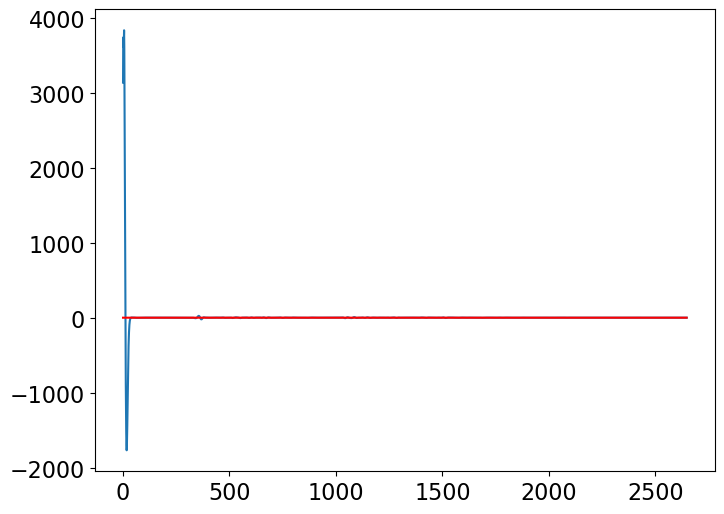

In [84]:
plt.plot(d_obs.data[:, 159])
plt.plot(d_syn.data[:, 0], 'r')
plt.show()

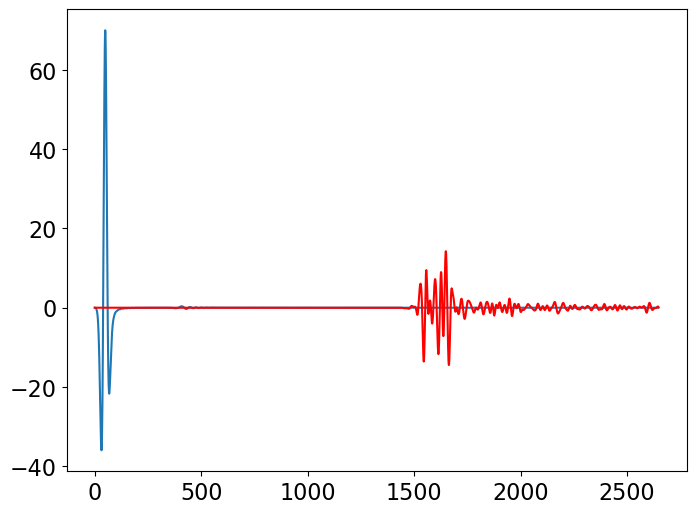

In [85]:
plt.plot(d_syn.data[:, 159])
plt.plot(d_obs.data[:, 0], 'r')
plt.show()

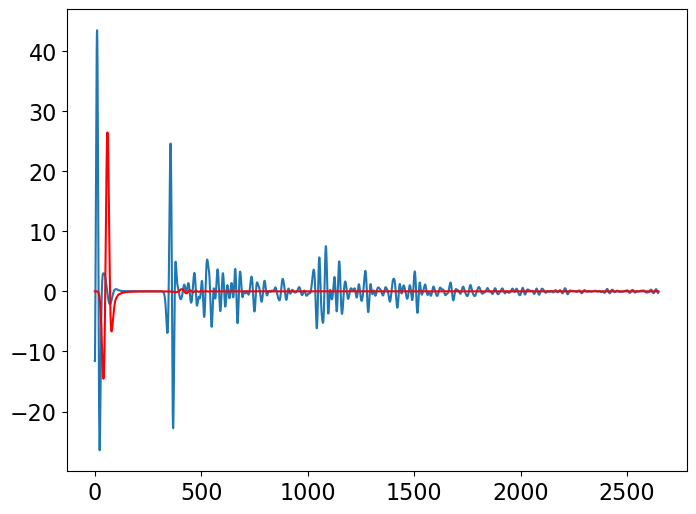

In [86]:
plt.plot(d_obs.data[:, 158])
plt.plot(d_syn.data[:, 158], 'r')
plt.show()

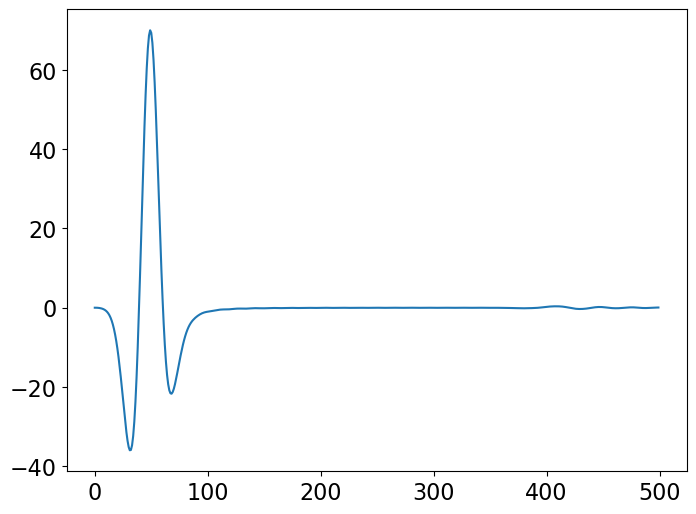

In [87]:
plt.plot(alpha*d_syn.data[:500,159])
plt.show()

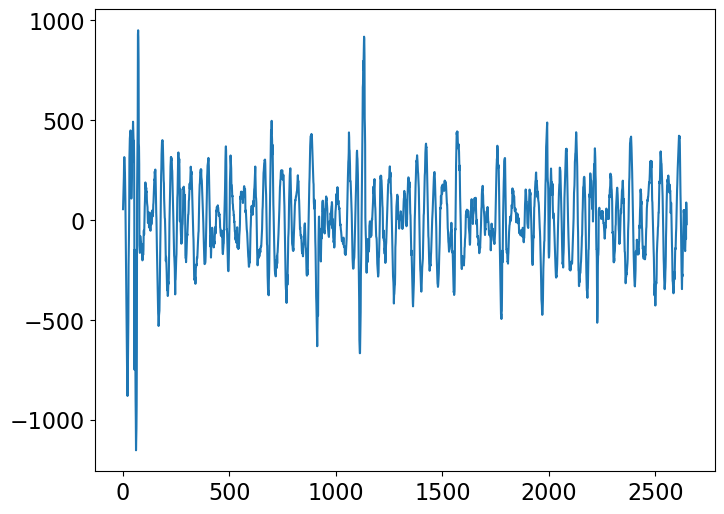

In [88]:
plt.plot(residual.data[:,159])
plt.show()

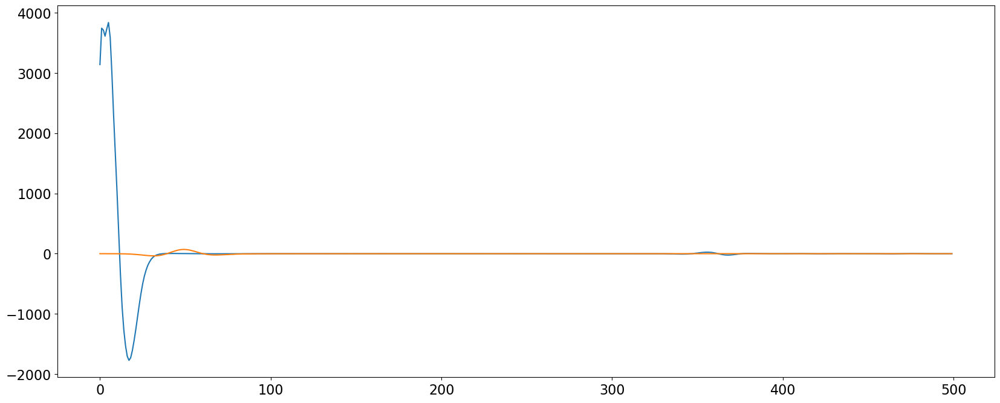

In [89]:
plt.figure(figsize=(20,8))
plt.plot(data_resampled[0][:500, 159])
plt.plot(d_syn.data[:500, 159])
plt.show()

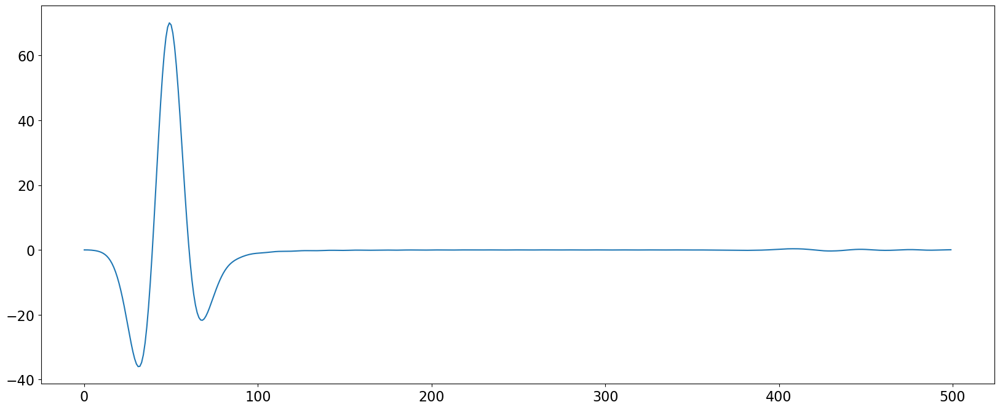

In [90]:
plt.figure(figsize=(20,8))
#plt.plot(data_resampled[0][:500, 159])
plt.plot(d_syn.data[:500, 159])
plt.show()

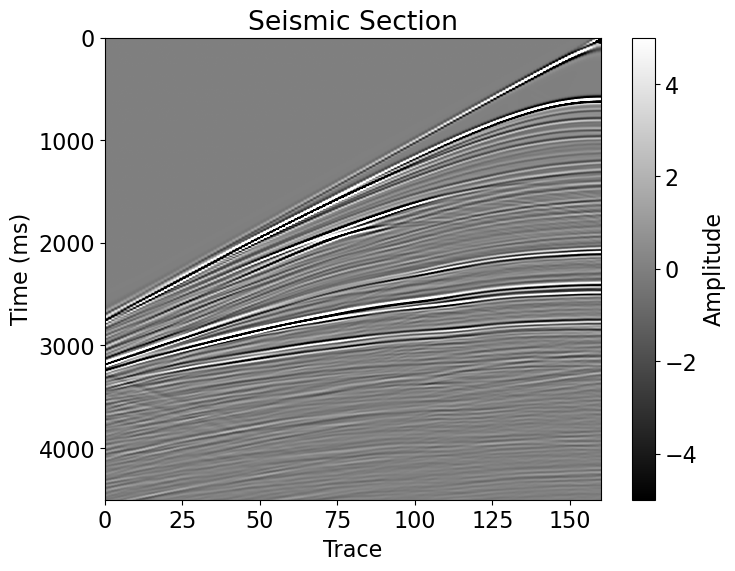

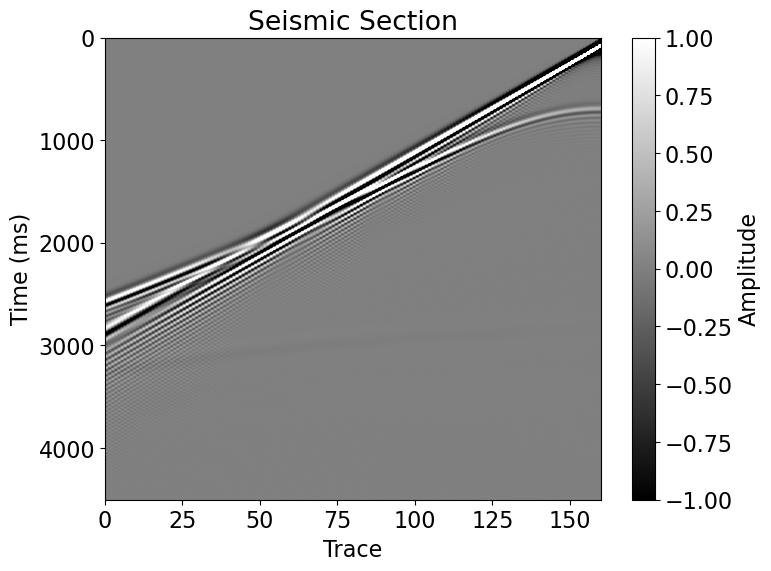

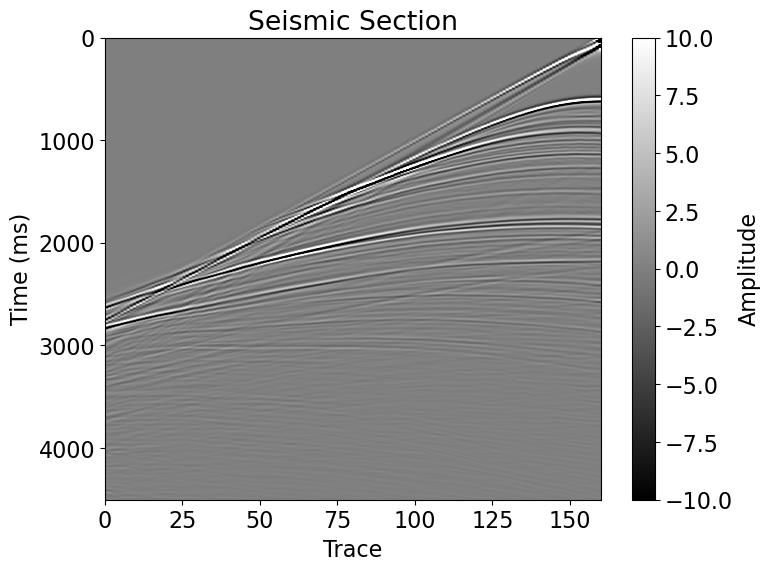

In [91]:
plt.imshow(data_resampled[0], aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmin=-5, vmax=5)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()
plt.imshow(d_syn.data[:], aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmin=-1, vmax=1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()
plt.imshow(d_obs.data-alpha*d_syn.data, aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmin=-10, vmax=10)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()

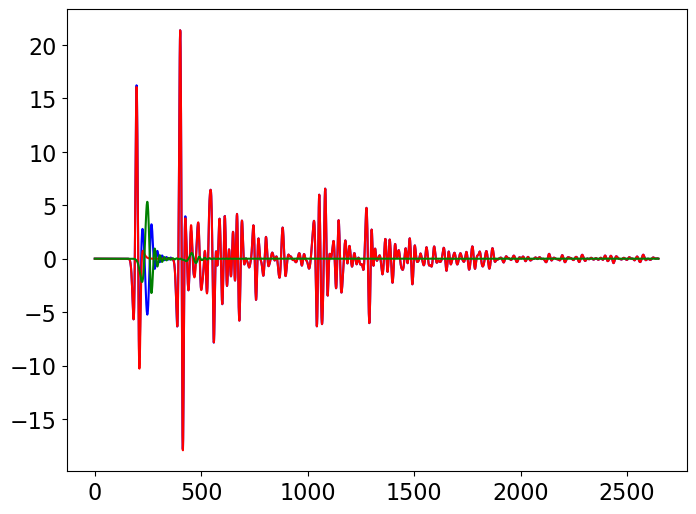

In [92]:
plt.plot(d_obs.data[:, 140]*alpha-d_syn.data[:, 140], 'b')
plt.plot(d_obs.data[:, 140], 'r')
plt.plot(d_syn.data[:, 140], 'g')
plt.show()

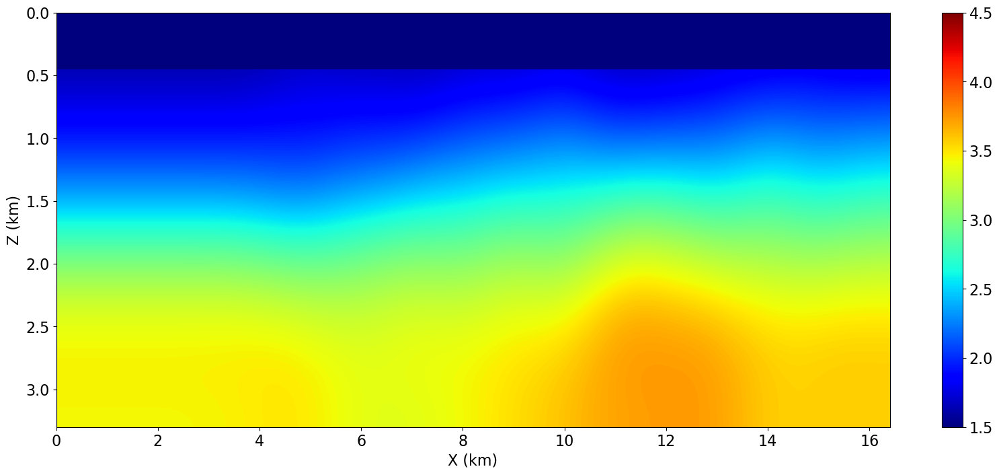

Proses FWI freq 0.002
Program dimulai pada: 14:16:43

Waktu eksekusi: 1324.19 detik

Maksimum p : 0.24114932119846344
Minimum p : -1.0
Norm P : 149.73281860351562
 
FWI freq 0.002 iterasi ke-0/9 : 5468907171725116.0
Program dimulai pada: 14:38:49
Waktu eksekusi: 1321.96 detik
ff2 = 5461556481218638.0, ff + a * l * gtp = 5468907171725114.0, a*l*gtp = -2.2147111328125
abs(g2tp) = 2996.84619140625, abs(b*gtp) = 2214.7111328125
g2tp = -2996.84619140625, (b*gtp) = -2214.7111328125
 
Armijo satisfied but curvature not satisfied, l update : 2
Program dimulai pada: 15:00:51
Waktu eksekusi: 1322.24 detik
ff2 = 5461507040360820.0, ff + a * l * gtp = 5468907171725112.0, a*l*gtp = -4.429422265625
abs(g2tp) = 3889.85546875, abs(b*gtp) = 2214.7111328125
g2tp = 3889.85546875, (b*gtp) = -2214.7111328125
 
Strong Wolfe satisfied, l best : 2


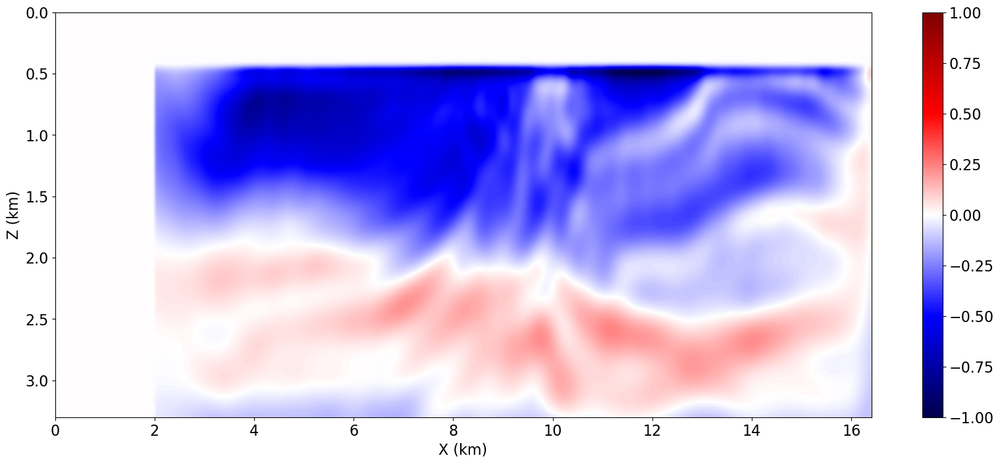

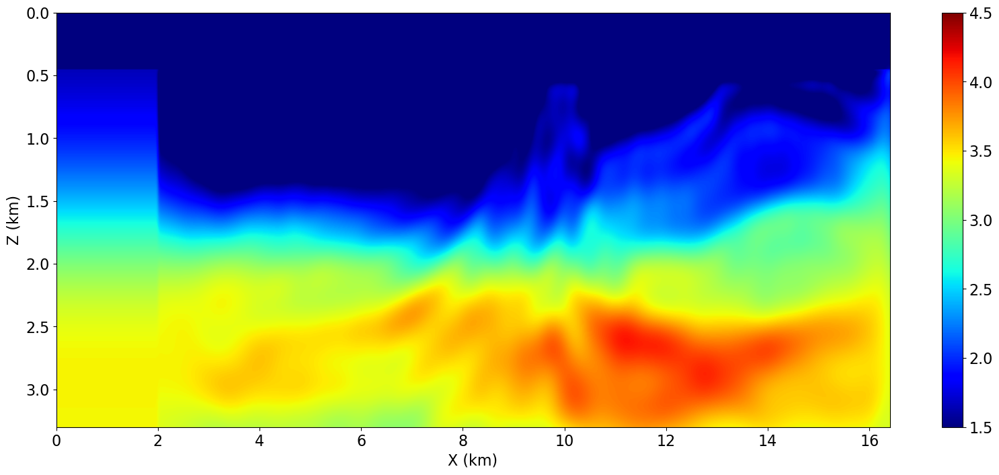

Nilai B : 0.8766859173774719
Maksimum p : 0.6028432250022888
Minimum p : -1.0
Norm P : 138.75814819335938
 
FWI freq 0.002 iterasi ke-1/9 : 5461507040360820.0
Program dimulai pada: 15:22:54
Waktu eksekusi: 1319.91 detik
ff2 = 5466546919573476.0, ff + a * l * gtp = 5461507040360818.0, a*l*gtp = -1.5444691406250002
abs(g2tp) = 8431.7666015625, abs(b*gtp) = 1544.4691406250001
g2tp = 8431.7666015625, (b*gtp) = -1544.4691406250001
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 15:44:54
Waktu eksekusi: 1319.05 detik
ff2 = 5462402052849500.0, ff + a * l * gtp = 5461507040360820.0, a*l*gtp = -0.15444691406250002
abs(g2tp) = 19298.412109375, abs(b*gtp) = 1544.4691406250001
g2tp = 19298.412109375, (b*gtp) = -1544.4691406250001
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 16:06:53
Waktu eksekusi: 1320.99 detik
ff2 = 5461594761707328.0, ff + a * l * gtp = 5461507040360820.0, a*l*gtp = -0.015444691406250002
abs(g2tp) = 19919.576

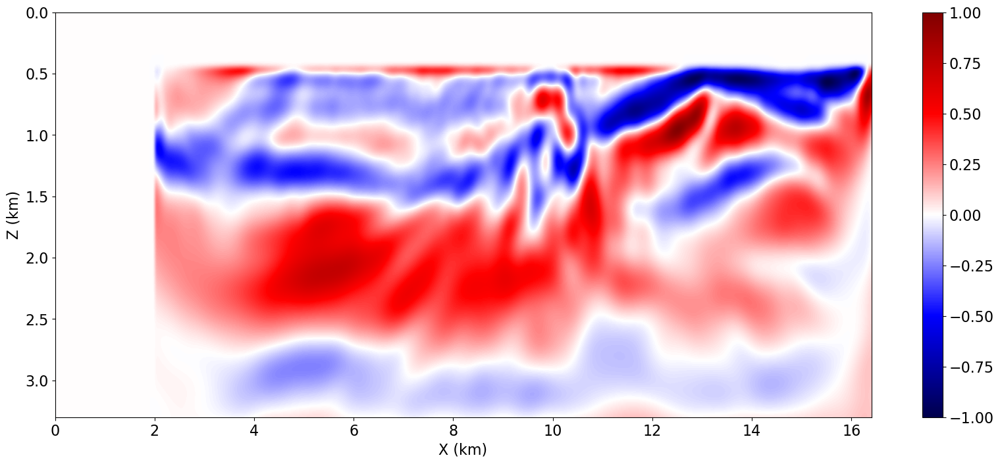

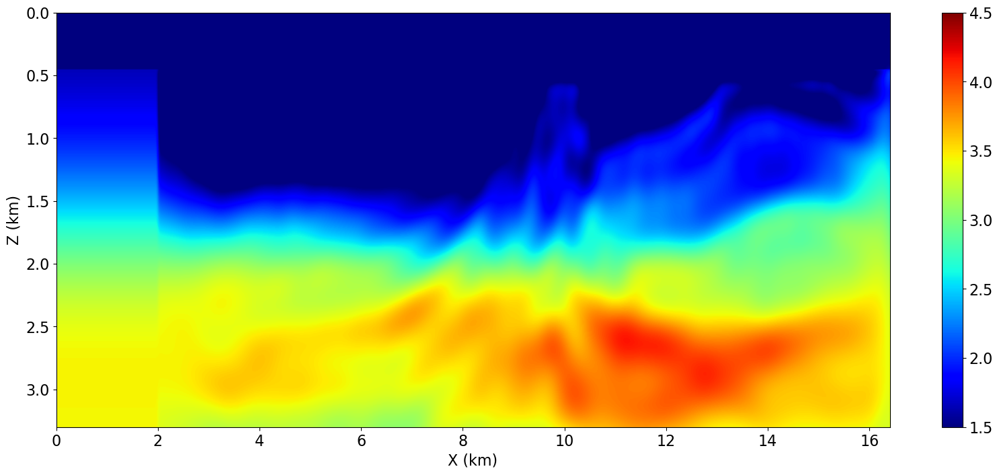

Nilai B : 1.0000560283660889
Maksimum p : 0.568684995174408
Minimum p : -1.0
Norm P : 57.050148010253906
 
FWI freq 0.002 iterasi ke-2/9 : 5461505852539824.0
Program dimulai pada: 17:35:19
Waktu eksekusi: 1401.71 detik
ff2 = 5466080010139568.0, ff + a * l * gtp = 5461505852539824.0, a*l*gtp = -0.0010746463775634766
abs(g2tp) = 2195.57568359375, abs(b*gtp) = 1.0746463775634767
g2tp = 2195.57568359375, (b*gtp) = -1.0746463775634767
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 17:58:40
Waktu eksekusi: 1411.55 detik
ff2 = 5461367280538582.0, ff + a * l * gtp = 5461505852539824.0, a*l*gtp = -0.00010746463775634766
abs(g2tp) = 18518.4296875, abs(b*gtp) = 1.0746463775634767
g2tp = -18518.4296875, (b*gtp) = -1.0746463775634767
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 18:22:12
Waktu eksekusi: 1396.50 detik
ff2 = 5461602096476102.0, ff + a * l * gtp = 5461505852539824.0, a*l*gtp = -0.00021492927551269533
abs(g2tp) = 14071.04

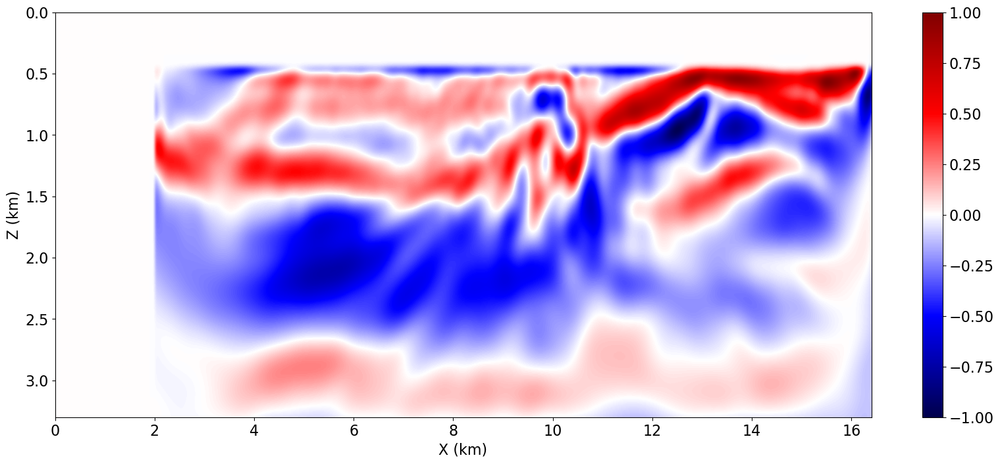

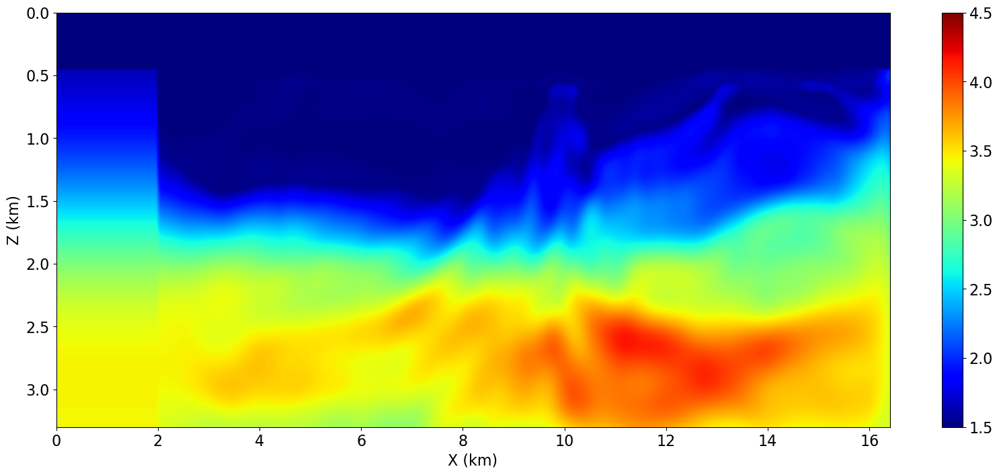

Nilai B : 1.0046993494033813
Maksimum p : 1.0
Minimum p : -0.4913627803325653
Norm P : 65.57963562011719
 
FWI freq 0.002 iterasi ke-3/9 : 5461367280538582.0
Program dimulai pada: 19:32:06
Waktu eksekusi: 1379.42 detik
ff2 = 5471622629837208.0, ff + a * l * gtp = 5461367280538582.0, a*l*gtp = -0.17731993408203126
abs(g2tp) = 5017.904296875, abs(b*gtp) = 177.31993408203127
g2tp = 5017.904296875, (b*gtp) = -177.31993408203127
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 19:55:05
Waktu eksekusi: 1332.28 detik
ff2 = 5462341111133062.0, ff + a * l * gtp = 5461367280538582.0, a*l*gtp = -0.017731993408203126
abs(g2tp) = 19249.86328125, abs(b*gtp) = 177.31993408203127
g2tp = 19249.86328125, (b*gtp) = -177.31993408203127
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 20:17:18
Waktu eksekusi: 1331.56 detik
ff2 = 5461457422072172.0, ff + a * l * gtp = 5461367280538582.0, a*l*gtp = -0.0017731993408203128
abs(g2tp) = 19868.65234

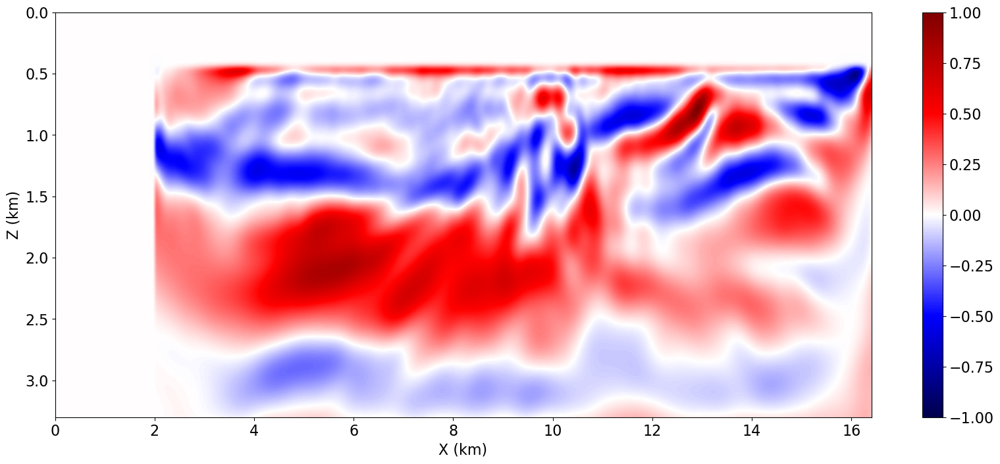

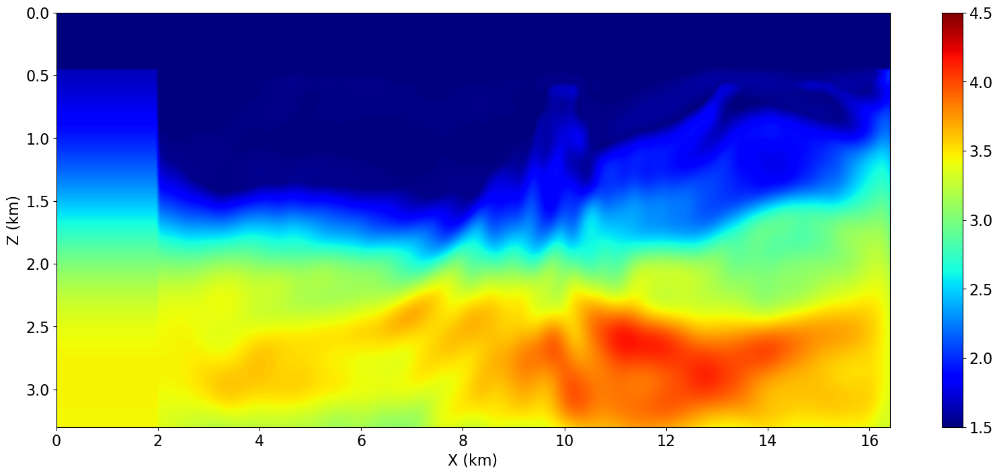

Nilai B : 1.0000160932540894
Maksimum p : 0.8458247184753418
Minimum p : -1.0
Norm P : 143.23602294921875
 
FWI freq 0.002 iterasi ke-4/9 : 5461366467521008.0
Program dimulai pada: 21:45:58
Waktu eksekusi: 1328.19 detik
ff2 = 5465526267038928.0, ff + a * l * gtp = 5461366467521006.0, a*l*gtp = -2.0079138671875003
abs(g2tp) = 5286.86083984375, abs(b*gtp) = 2007.9138671875
g2tp = 5286.86083984375, (b*gtp) = -2007.9138671875
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 22:08:06
Waktu eksekusi: 1342.78 detik
ff2 = 5461061474905654.0, ff + a * l * gtp = 5461366467521008.0, a*l*gtp = -0.20079138671875002
abs(g2tp) = 22384.44921875, abs(b*gtp) = 2007.9138671875
g2tp = -22384.44921875, (b*gtp) = -2007.9138671875
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 22:30:29
Waktu eksekusi: 1325.61 detik
ff2 = 5460987649972022.0, ff + a * l * gtp = 5461366467521008.0, a*l*gtp = -0.40158277343750004
abs(g2tp) = 19471.2734375, abs(b*gtp) 

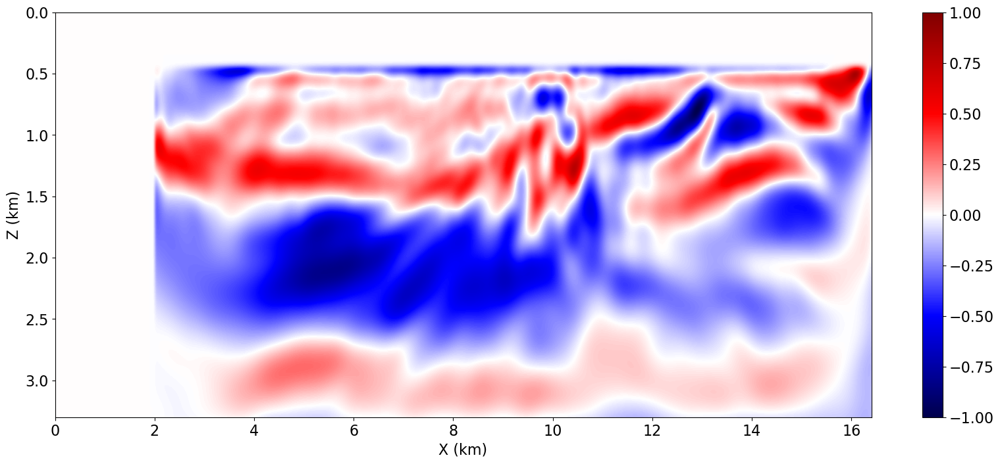

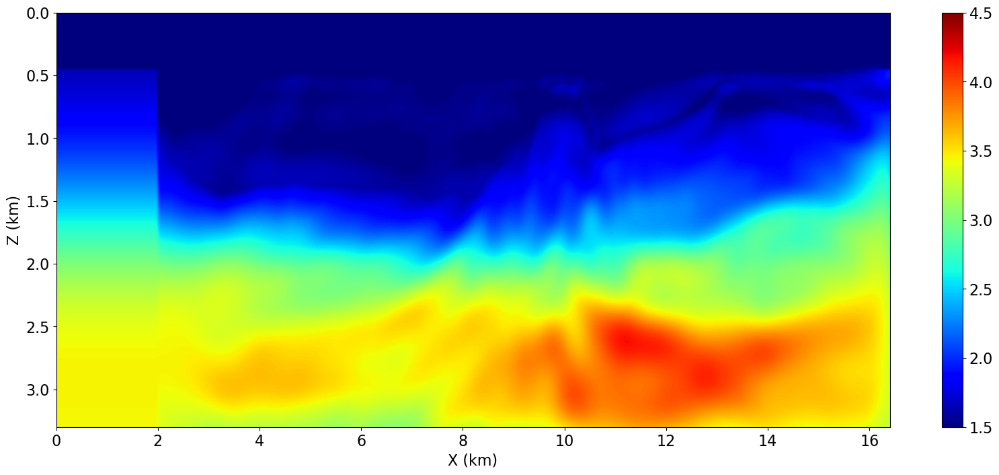

Nilai B : 1.1299091577529907
Maksimum p : 0.5992867350578308
Minimum p : -1.0
Norm P : 77.53460693359375
 
FWI freq 0.002 iterasi ke-5/9 : 5460987649972022.0
Program dimulai pada: 23:36:36
Waktu eksekusi: 1317.73 detik
ff2 = 5469559258256124.0, ff + a * l * gtp = 5460987649972022.0, a*l*gtp = -0.29949187011718753
abs(g2tp) = 6457.140625, abs(b*gtp) = 299.4918701171875
g2tp = 6457.140625, (b*gtp) = -299.4918701171875
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 23:58:33
Waktu eksekusi: 1321.88 detik
ff2 = 5462044639292468.0, ff + a * l * gtp = 5460987649972022.0, a*l*gtp = -0.029949187011718753
abs(g2tp) = 19804.486328125, abs(b*gtp) = 299.4918701171875
g2tp = 19804.486328125, (b*gtp) = -299.4918701171875
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 00:20:35
Waktu eksekusi: 1316.60 detik
ff2 = 5461089984344938.0, ff + a * l * gtp = 5460987649972022.0, a*l*gtp = -0.0029949187011718754
abs(g2tp) = 24387.22265625, abs

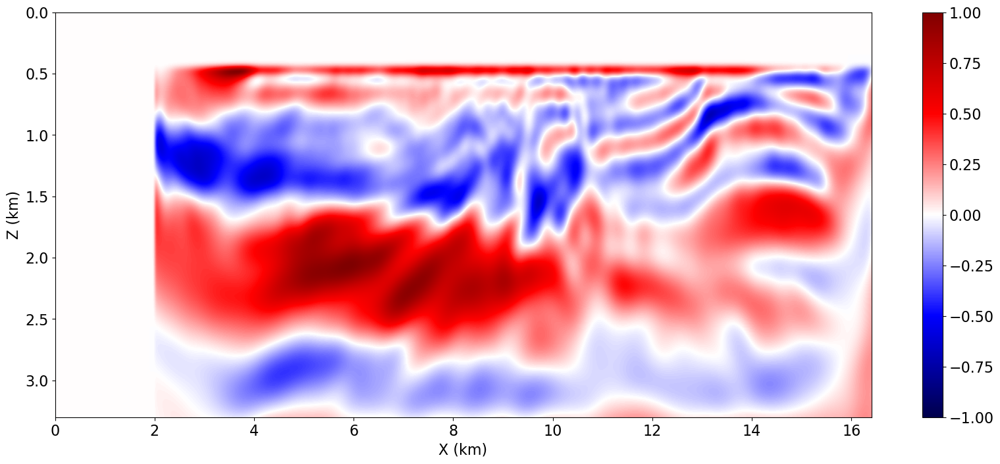

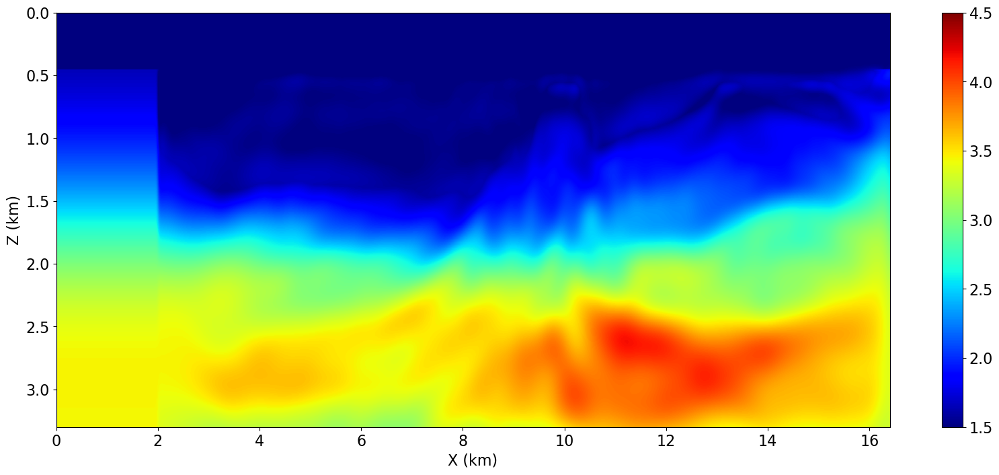

Nilai B : 1.0000003576278687
Maksimum p : 0.6994848251342773
Minimum p : -1.0
Norm P : 161.75010681152344
 
FWI freq 0.002 iterasi ke-6/9 : 5460987705771946.0
Program dimulai pada: 01:48:28
Waktu eksekusi: 1325.31 detik
ff2 = 5465281383270230.0, ff + a * l * gtp = 5460987705771943.0, a*l*gtp = -2.5217119140625
abs(g2tp) = 5063.9619140625, abs(b*gtp) = 2521.7119140625
g2tp = 5063.9619140625, (b*gtp) = -2521.7119140625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 02:10:34
Waktu eksekusi: 1328.41 detik
ff2 = 5460792808545914.0, ff + a * l * gtp = 5460987705771946.0, a*l*gtp = -0.25217119140625
abs(g2tp) = 20563.330078125, abs(b*gtp) = 2521.7119140625
g2tp = -20563.330078125, (b*gtp) = -2521.7119140625
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 02:32:43
Waktu eksekusi: 1327.73 detik
ff2 = 5460799854136628.0, ff + a * l * gtp = 5460987705771945.0, a*l*gtp = -0.5043423828125
abs(g2tp) = 14878.052734375, abs(b*gtp) = 2521.7

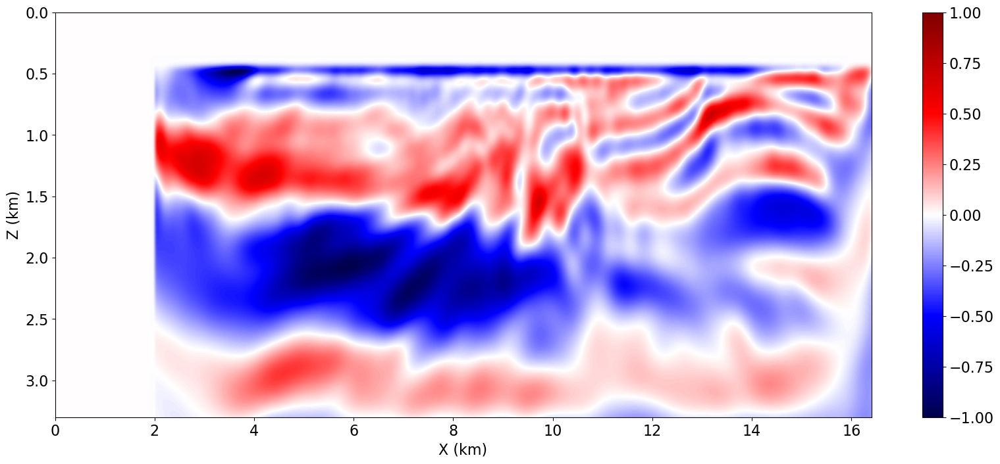

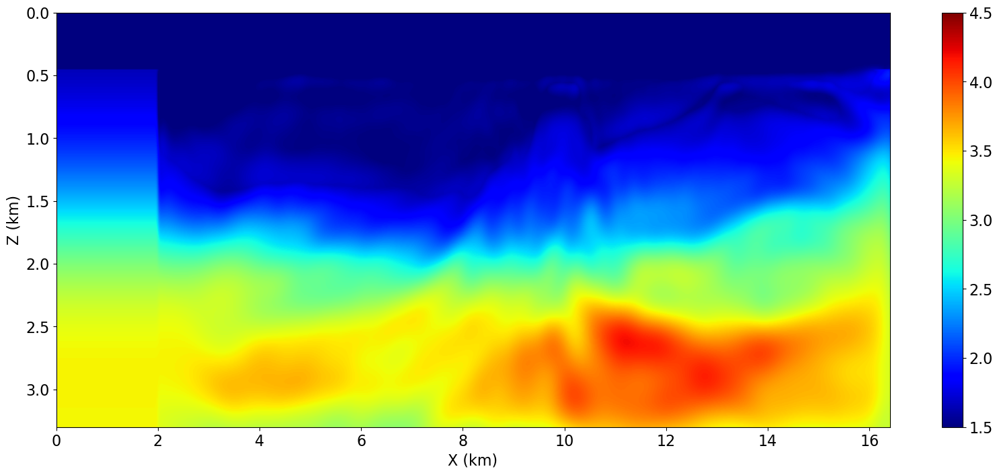

Nilai B : 0.841396689414978
Maksimum p : 1.0
Minimum p : -0.3908447027206421
Norm P : 56.042633056640625
 
FWI freq 0.002 iterasi ke-7/9 : 5460792808545914.0
Program dimulai pada: 03:39:08
Waktu eksekusi: 1320.08 detik
ff2 = 5465927352612692.0, ff + a * l * gtp = 5460792808545914.0, a*l*gtp = -0.10461099853515625
abs(g2tp) = 2894.366455078125, abs(b*gtp) = 104.61099853515626
g2tp = 2894.366455078125, (b*gtp) = -104.61099853515626
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 04:01:09
Waktu eksekusi: 1326.88 detik
ff2 = 5461670302130252.0, ff + a * l * gtp = 5460792808545914.0, a*l*gtp = -0.010461099853515626
abs(g2tp) = 14294.2421875, abs(b*gtp) = 104.61099853515626
g2tp = 14294.2421875, (b*gtp) = -104.61099853515626
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 04:23:15
Waktu eksekusi: 1323.90 detik
ff2 = 5460879178030344.0, ff + a * l * gtp = 5460792808545914.0, a*l*gtp = -0.0010461099853515626
abs(g2tp) = 17342.6

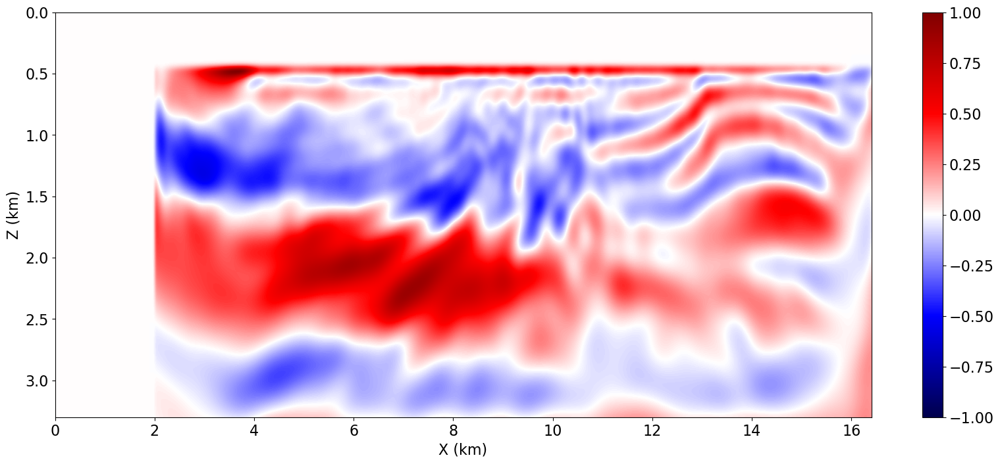

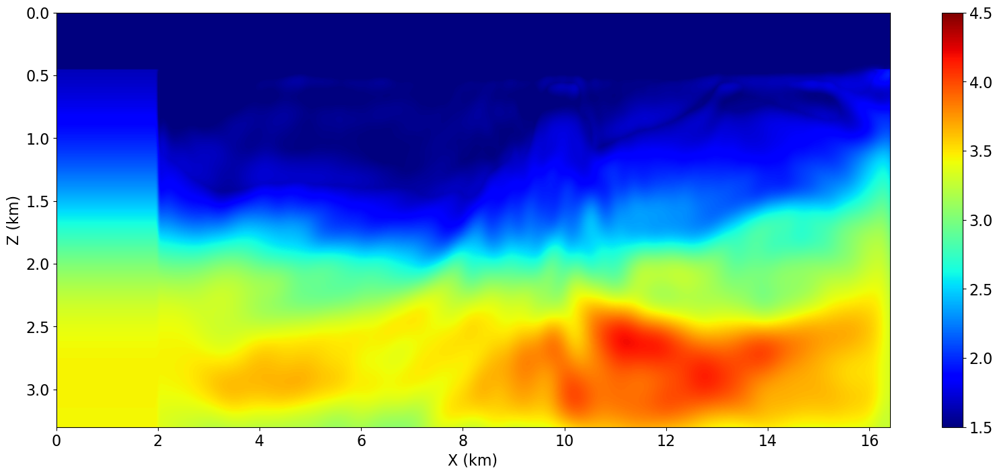

Nilai B : 0.9999727010726929
Maksimum p : 1.0
Minimum p : -0.6116902232170105
Norm P : 53.49595642089844
 
FWI freq 0.002 iterasi ke-8/9 : 5460792668992458.0
Program dimulai pada: 05:51:38
Waktu eksekusi: 1328.55 detik
ff2 = 5470100226725496.0, ff + a * l * gtp = 5460792668992458.0, a*l*gtp = -0.0014499910354614258
abs(g2tp) = 3091.67236328125, abs(b*gtp) = 1.4499910354614258
g2tp = 3091.67236328125, (b*gtp) = -1.4499910354614258
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 06:13:47
Waktu eksekusi: 1335.46 detik
ff2 = 5460735491512010.0, ff + a * l * gtp = 5460792668992458.0, a*l*gtp = -0.0001449991035461426
abs(g2tp) = 14419.267578125, abs(b*gtp) = 1.4499910354614258
g2tp = -14419.267578125, (b*gtp) = -1.4499910354614258
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 06:36:02
Waktu eksekusi: 1311.70 detik
ff2 = 5460752969907950.0, ff + a * l * gtp = 5460792668992458.0, a*l*gtp = -0.0002899982070922852
abs(g2tp) = 10516.

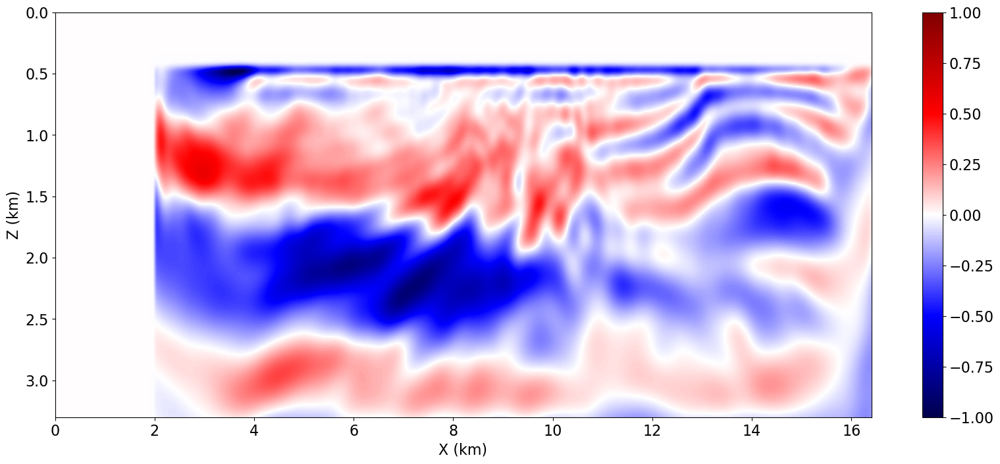

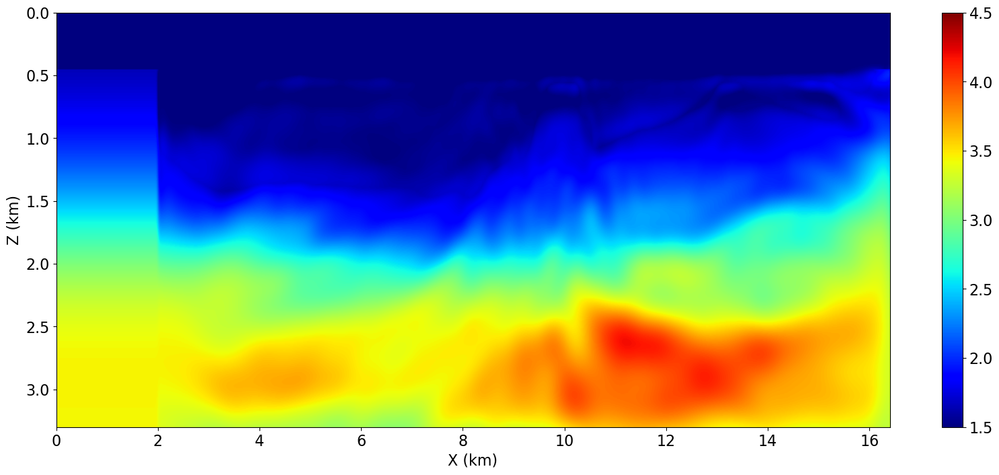

 
FWI freq 0.002 iterasi ke-9/9 : 5460735491512010.0


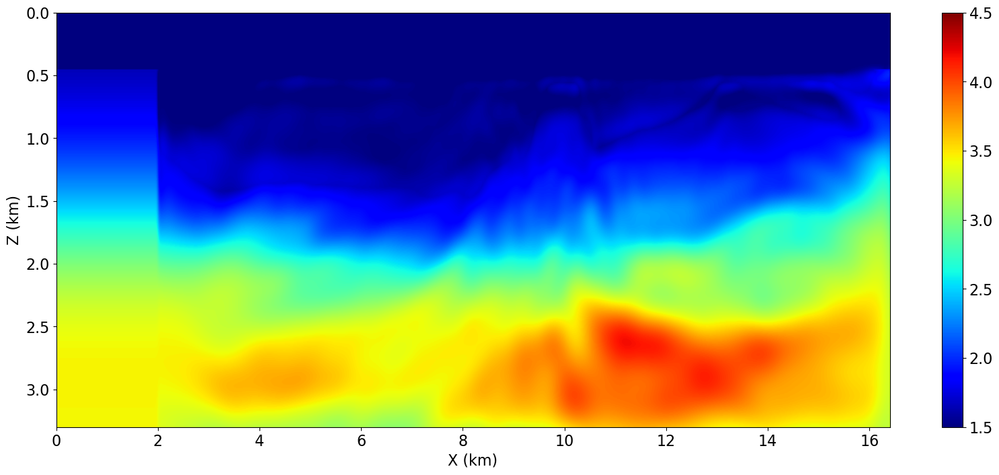

In [32]:
from copy import deepcopy
from devito import mmax, norm
import time as tm
from datetime import datetime

multiscale_freq = np.array([2.])
multiscale_freq /= 1000

modelbest_each_freq = []

misfiti = []

update_model = Model(vp=vp0, origin=origin, shape=shape, spacing=spacing,
            space_order=2, nbl=nboundary, bcs="damp", grid = model0.grid)

#update_model.vp.data[:] = np.loadtxt("Best Model 5 Hz.txt")

xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()


for k in multiscale_freq:
    print(f"Proses FWI freq {k}")

    geometrys, srcs = geometry_and_source(nshots, shot_first_coordinate, shot_last_coordinate, shot_depth, nreceivers, first_channel_firstlreceriverline_coordinate, last_channel_firstreceiverline_coordinate, receiver_depth, receiverline_interval, t0, tn, dt, k, shift_phase)
    
    
    modeli =[]
    gradi = []
    #plot_velocity(update_model)
    model_update = deepcopy(update_model.vp.data[:])
    modeli.append(model_update)

    fwi_iterations = 9  # Number of outer FWI iteration
    fwi_index = 0
    for i in range(fwi_iterations):
        if i==0 :
            start_time = tm.time()
            

            time_start = datetime.now()
            print("Program dimulai pada:", time_start.strftime("%H:%M:%S"))

            
            ff, update = fwi_gradient(update_model.vp)
            
            end_time = tm.time()

            print("")
            print(f"Waktu eksekusi: {end_time - start_time:.2f} detik")
            print("")
            

            gradient = deepcopy(update)
            gradient.data[:] *= -1

        else :
            ff, update1 = FF, G

            gradient1 = deepcopy(update1)
            gradient1.data[:] *= -1

            update = cg_hs(gradient, gradient1, update)

            if np.sum(gradient1.data[:]*update.data[:]) >= 0:
                update.data[:] = deepcopy(gradient1.data[:])
                update.data[:] *= -1
      
            gradient = deepcopy(gradient1)

        print(f"Maksimum p : {np.max(update.data)}")
        print(f"Minimum p : {np.min(update.data)}")
        print(f"Norm P : {norm(update)}")


        misfit_model = deepcopy(ff)
        misfiti.append(misfit_model)

        updatei = deepcopy(update.data[:])
        gradi.append(updatei)


        print(f" ")
        print(f"===========================================================")
        print(f"FWI freq {k} iterasi ke-{fwi_index}/{fwi_iterations} : {ff}")
    

        L, FF, G = linesearch(update_model, ff, gradient, update, a=0.0001, b=0.1, l=1, max_iter=5, max_l = 100, scale_l=2) 

    
        update_model.vp.data[:] += ((L))*update.data[:]
        update_model.vp.data[:] = np.clip(update_model.vp.data[:], 1.5, 4.7)

        model_update = deepcopy(update_model.vp.data[:])
        modeli.append(model_update)
    
        fwi_index+=1

        plt.figure(figsize=(20, 8))
        plt.imshow(update.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', vmin=-1, vmax=1, aspect='auto')
        plt.colorbar()
        plt.xlabel("X (km)")
        plt.ylabel("Z (km)")
        plt.show()


        plt.figure(figsize=(20, 8))
        plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
        plt.colorbar()
        plt.xlabel("X (km)")
        plt.ylabel("Z (km)")
        plt.show()
    
    ff = FF
    misfit_model = deepcopy(ff)
    misfiti.append(misfit_model)

    print(f" ")
    print(f"===========================================================")
    print(f"FWI freq {k} iterasi ke-{fwi_index}/{fwi_iterations} : {ff}")

    best_model = deepcopy(update_model.vp.data[:])

    modelbest_each_freq.append(best_model)

    np.savetxt(f'Model_Progres/Best Model {k*1000} Hz Vp0 Rev1.txt', best_model)
    np.save(f'Model_Progres/Update Model {k*1000} Hz Vp0 Rev1.npy', modeli)
    np.save(f'Model_Progres/Gradient Model {k*1000} Hz Vp0 Rev1.npy', gradi)

    
    plt.figure(figsize=(20, 8))
    plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
    plt.colorbar()
    plt.xlabel("X (km)")
    plt.ylabel("Z (km)")
    plt.show()

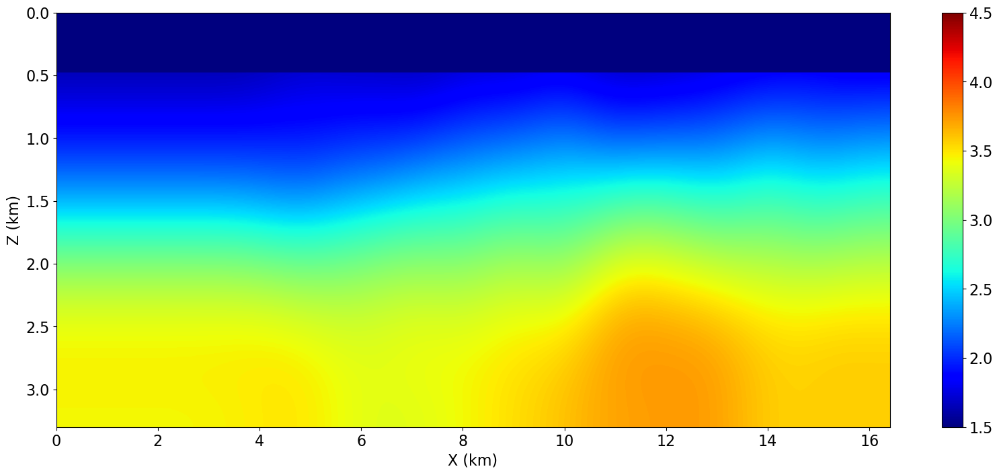

Proses FWI freq 0.002
Program dimulai pada: 22:35:47

Waktu eksekusi: 1271.71 detik

Maksimum p : 0.1582489013671875
Minimum p : -1.0
Norm P : 84.5774917602539
 
FWI freq 0.002 iterasi ke-0/19 : 495516276176.4053
Program dimulai pada: 22:56:59
Waktu eksekusi: 1265.45 detik
ff2 = 1021616275385.673, ff + a * l * gtp = 495516276175.69916, a*l*gtp = -0.706134521484375
abs(g2tp) = 3618.72216796875, abs(b*gtp) = 706.134521484375
g2tp = 3618.72216796875, (b*gtp) = -706.134521484375
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 23:18:05
Waktu eksekusi: 1269.13 detik
ff2 = 381954513642.09644, ff + a * l * gtp = 495516276176.33466, a*l*gtp = -0.0706134521484375
abs(g2tp) = 7122.4130859375, abs(b*gtp) = 706.134521484375
g2tp = -7122.4130859375, (b*gtp) = -706.134521484375
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 23:39:14
Waktu eksekusi: 1300.67 detik
ff2 = 279341025202.02625, ff + a * l * gtp = 495516276176.26404, a*l*gtp = -0

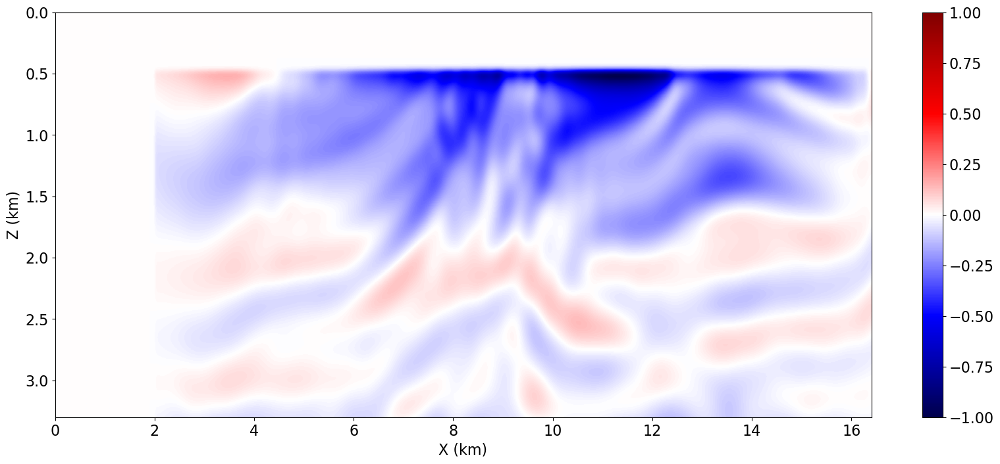

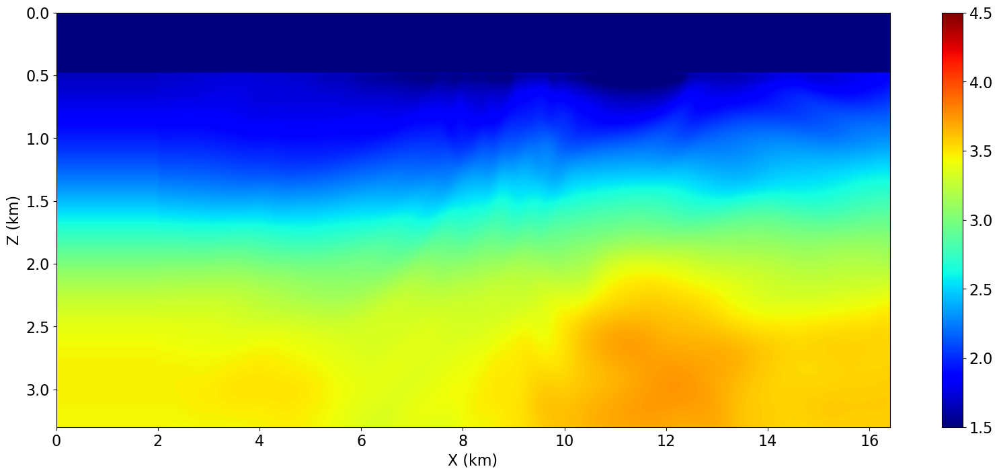

Nilai B : 0.29390543699264526
Maksimum p : 0.10238002985715866
Minimum p : -1.0
Norm P : 64.2372817993164
 
FWI freq 0.002 iterasi ke-1/19 : 272658109002.26297
Program dimulai pada: 00:23:15
Waktu eksekusi: 1299.35 detik
ff2 = 1055044231601.481, ff + a * l * gtp = 272658109001.87936, a*l*gtp = -0.3836065185546875
abs(g2tp) = 3036.45166015625, abs(b*gtp) = 383.6065185546875
g2tp = 3036.45166015625, (b*gtp) = -383.6065185546875
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 00:44:55
Waktu eksekusi: 1228.85 detik
ff2 = 393943956874.47363, ff + a * l * gtp = 272658109002.2246, a*l*gtp = -0.038360651855468754
abs(g2tp) = 3777.465576171875, abs(b*gtp) = 383.6065185546875
g2tp = 3777.465576171875, (b*gtp) = -383.6065185546875
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 01:05:23
Waktu eksekusi: 1202.20 detik
ff2 = 283022898982.9829, ff + a * l * gtp = 272658109002.25912, a*l*gtp = -0.0038360651855468757
abs(g2tp) = 3891.70

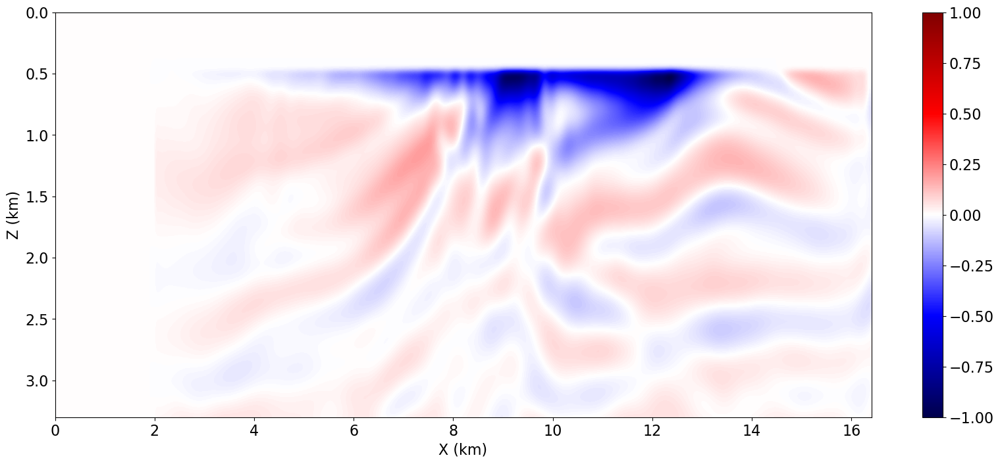

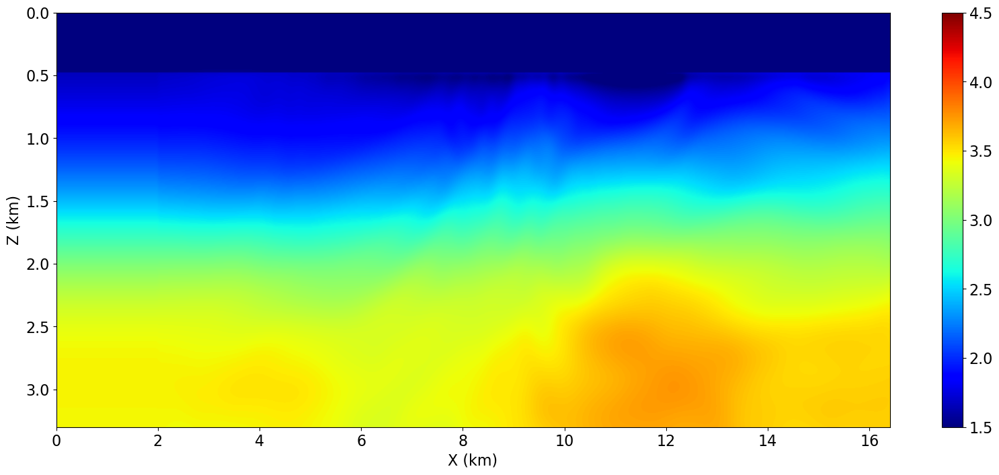

Nilai B : 1.0000160932540894
Maksimum p : 1.0
Minimum p : -0.19531621038913727
Norm P : 62.499290466308594
 
FWI freq 0.002 iterasi ke-2/19 : 272668290029.0002
Program dimulai pada: 02:25:05
Waktu eksekusi: 1264.08 detik
ff2 = 656989221743.9027, ff + a * l * gtp = 272668290028.61273, a*l*gtp = -0.38748952636718753
abs(g2tp) = 2453.474609375, abs(b*gtp) = 387.4895263671875
g2tp = 2453.474609375, (b*gtp) = -387.4895263671875
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 02:46:09
Waktu eksekusi: 1263.00 detik
ff2 = 191032972958.30304, ff + a * l * gtp = 272668290028.96146, a*l*gtp = -0.03874895263671875
abs(g2tp) = 3526.79638671875, abs(b*gtp) = 387.4895263671875
g2tp = -3526.79638671875, (b*gtp) = -387.4895263671875
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 03:07:12
Waktu eksekusi: 1265.21 detik
ff2 = 197287186963.31522, ff + a * l * gtp = 272668290028.92273, a*l*gtp = -0.0774979052734375
abs(g2tp) = 1337.46923828125, 

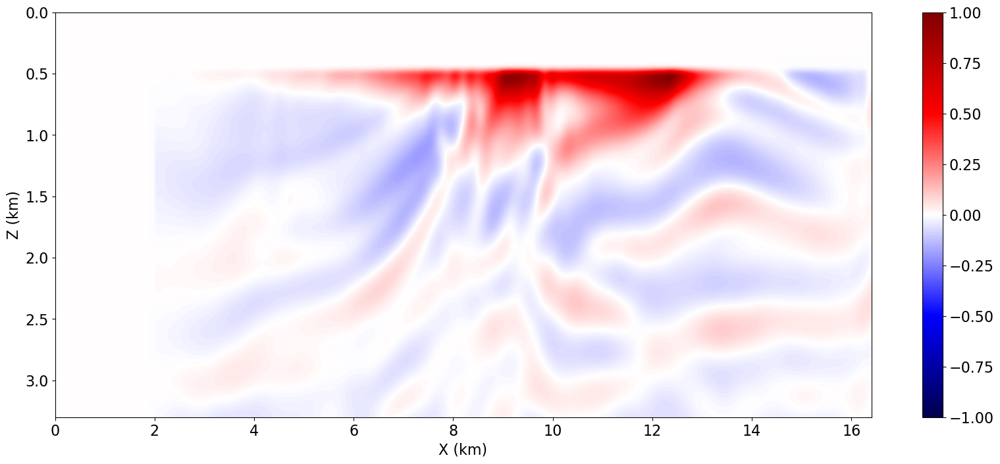

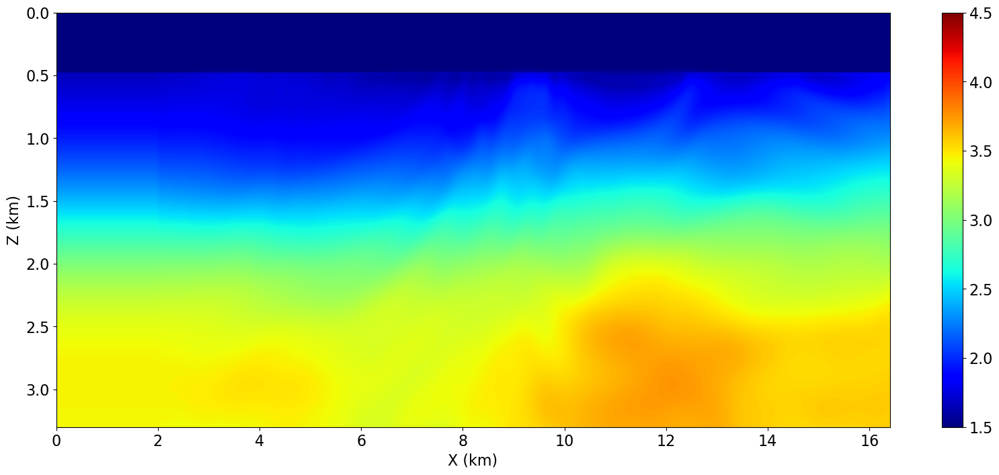

Nilai B : 2.147477626800537
Maksimum p : 1.0
Minimum p : -0.0460977703332901
Norm P : 63.957820892333984
 
FWI freq 0.002 iterasi ke-3/19 : 197287186963.31522
Program dimulai pada: 03:28:19
Waktu eksekusi: 1260.82 detik
ff2 = 824681028633.051, ff + a * l * gtp = 197287186962.96094, a*l*gtp = -0.35427888183593753
abs(g2tp) = 3022.2392578125, abs(b*gtp) = 354.2788818359375
g2tp = 3022.2392578125, (b*gtp) = -354.2788818359375
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 03:49:20
Waktu eksekusi: 1267.95 detik
ff2 = 298018627540.431, ff + a * l * gtp = 197287186963.2798, a*l*gtp = -0.035427888183593756
abs(g2tp) = 5991.03564453125, abs(b*gtp) = 354.2788818359375
g2tp = 5991.03564453125, (b*gtp) = -354.2788818359375
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 04:10:28
Waktu eksekusi: 1266.05 detik
ff2 = 205999192250.32242, ff + a * l * gtp = 197287186963.31168, a*l*gtp = -0.0035427888183593758
abs(g2tp) = 6579.17138671

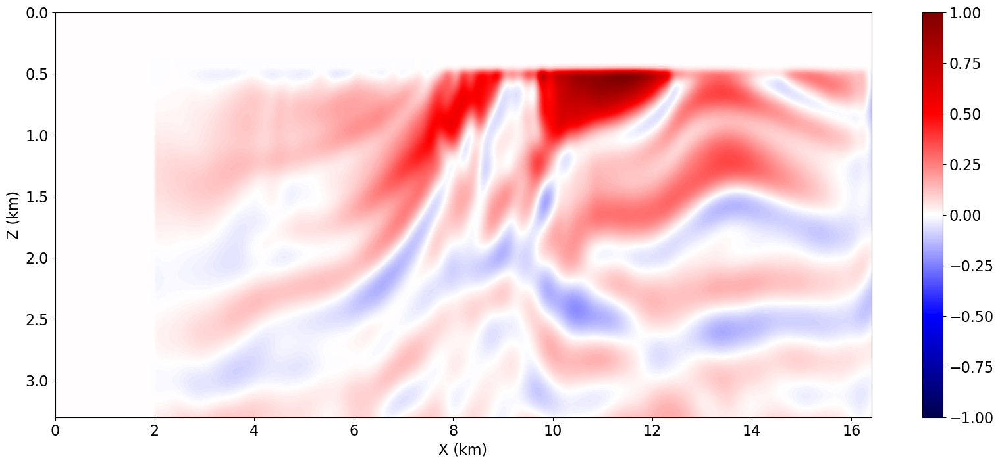

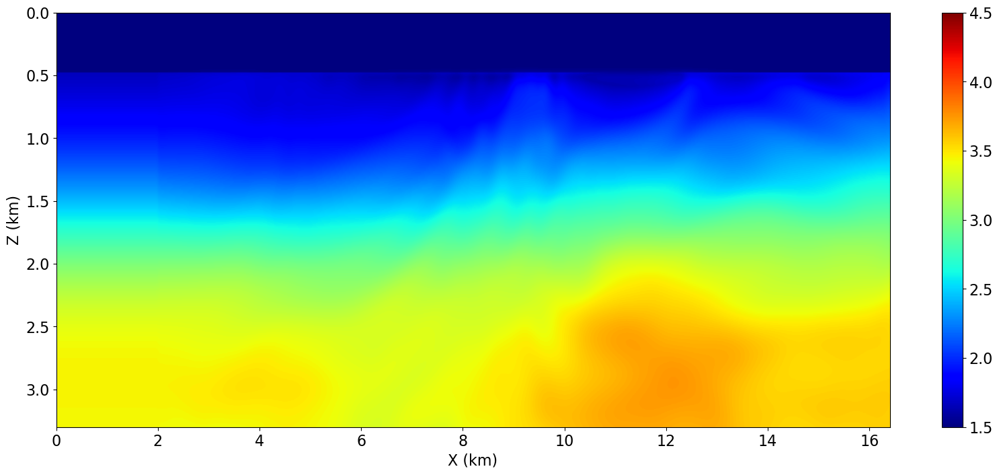

Nilai B : 0.9999579191207886
Maksimum p : 0.22537139058113098
Minimum p : -1.0
Norm P : 83.19374084472656
 
FWI freq 0.002 iterasi ke-4/19 : 197294707565.38223
Program dimulai pada: 05:35:02
Waktu eksekusi: 1261.32 detik
ff2 = 867384179325.8705, ff + a * l * gtp = 197294707564.70364, a*l*gtp = -0.6785962890625
abs(g2tp) = 2802.364013671875, abs(b*gtp) = 678.5962890625001
g2tp = 2802.364013671875, (b*gtp) = -678.5962890625001
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 05:56:04
Waktu eksekusi: 1258.69 detik
ff2 = 150689431483.71274, ff + a * l * gtp = 197294707565.31436, a*l*gtp = -0.06785962890625001
abs(g2tp) = 2514.985595703125, abs(b*gtp) = 678.5962890625001
g2tp = -2514.985595703125, (b*gtp) = -678.5962890625001
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 06:17:02
Waktu eksekusi: 1259.23 detik
ff2 = 199540602141.88712, ff + a * l * gtp = 197294707565.24652, a*l*gtp = -0.13571925781250002
abs(g2tp) = 2638.21606445

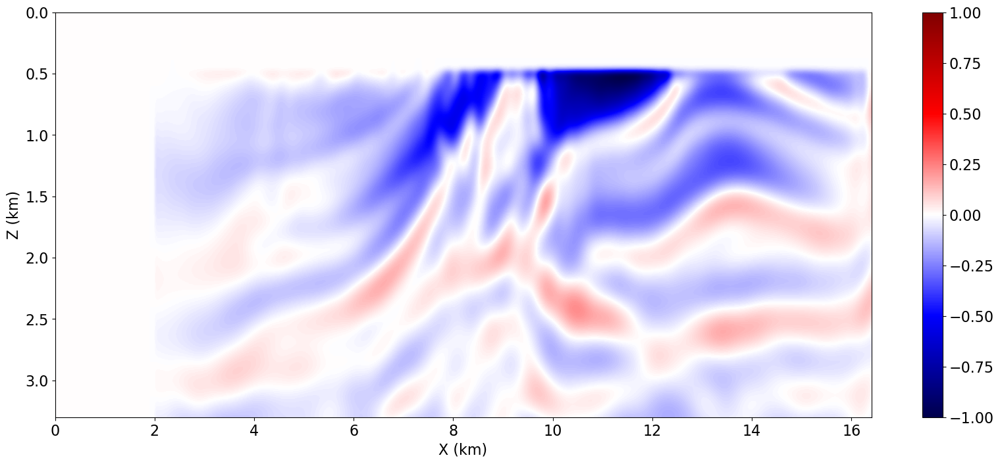

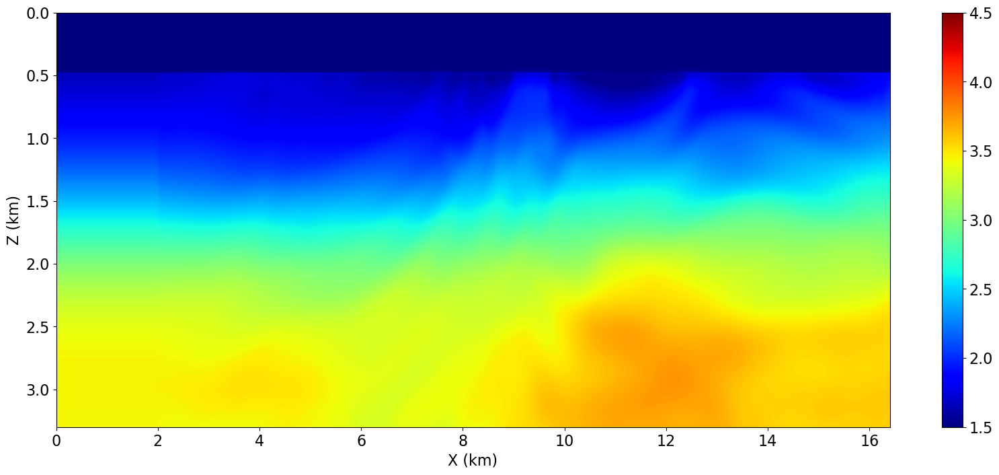

Nilai B : 1.4702017307281494
Maksimum p : 0.07794182002544403
Minimum p : -1.0
Norm P : 62.864234924316406
 
FWI freq 0.002 iterasi ke-5/19 : 150689431483.71274
Program dimulai pada: 07:20:02
Waktu eksekusi: 1271.91 detik
ff2 = 1004488144905.9246, ff + a * l * gtp = 150689431483.3674, a*l*gtp = -0.3453346923828125
abs(g2tp) = 2369.337890625, abs(b*gtp) = 345.33469238281253
g2tp = 2369.337890625, (b*gtp) = -345.33469238281253
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 07:41:14
Waktu eksekusi: 1270.90 detik
ff2 = 239674678826.89728, ff + a * l * gtp = 150689431483.6782, a*l*gtp = -0.03453346923828125
abs(g2tp) = 5652.68115234375, abs(b*gtp) = 345.33469238281253
g2tp = 5652.68115234375, (b*gtp) = -345.33469238281253
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 08:02:25
Waktu eksekusi: 1273.29 detik
ff2 = 156769935821.40317, ff + a * l * gtp = 150689431483.7093, a*l*gtp = -0.0034533469238281255
abs(g2tp) = 10014.142

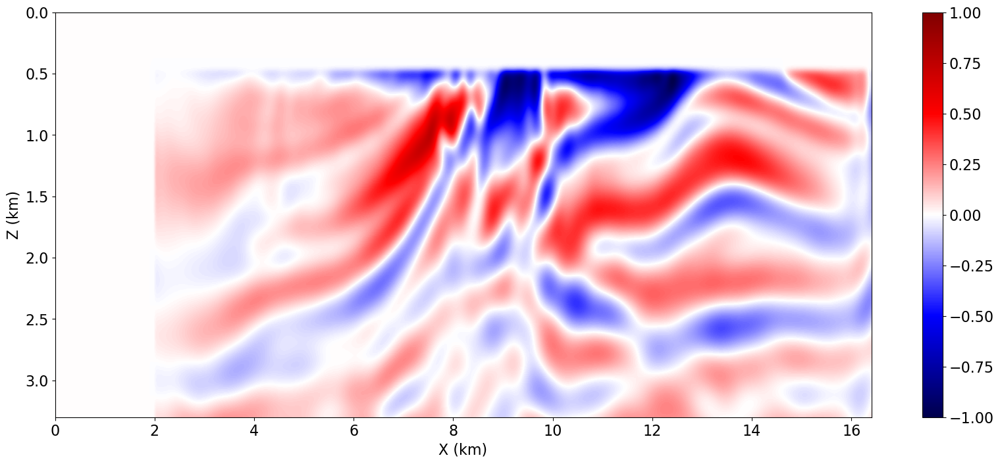

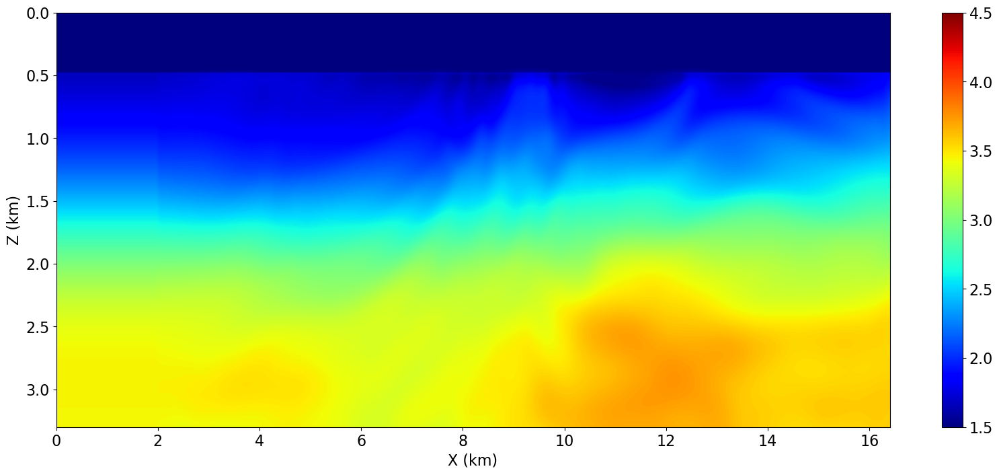

Nilai B : 0.9999566674232483
Maksimum p : 1.0
Minimum p : -0.760613739490509
Norm P : 107.52960968017578
 
FWI freq 0.002 iterasi ke-6/19 : 150695059457.81006
Program dimulai pada: 09:26:22
Waktu eksekusi: 1204.16 detik
ff2 = 688270806876.3442, ff + a * l * gtp = 150695059456.6942, a*l*gtp = -1.115831640625
abs(g2tp) = 4226.71142578125, abs(b*gtp) = 1115.831640625
g2tp = 4226.71142578125, (b*gtp) = -1115.831640625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 09:46:26
Waktu eksekusi: 1274.46 detik
ff2 = 127781747993.56262, ff + a * l * gtp = 150695059457.6985, a*l*gtp = -0.1115831640625
abs(g2tp) = 2321.97998046875, abs(b*gtp) = 1115.831640625
g2tp = -2321.97998046875, (b*gtp) = -1115.831640625
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 10:07:41
Waktu eksekusi: 1232.73 detik
ff2 = 154847673320.7575, ff + a * l * gtp = 150695059457.58688, a*l*gtp = -0.223166328125
abs(g2tp) = 1068.73828125, abs(b*gtp) = 1115.831640625


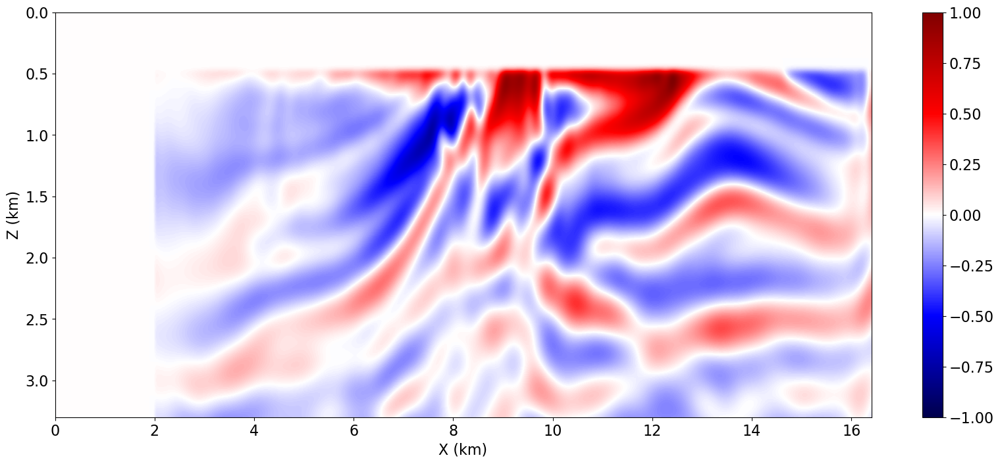

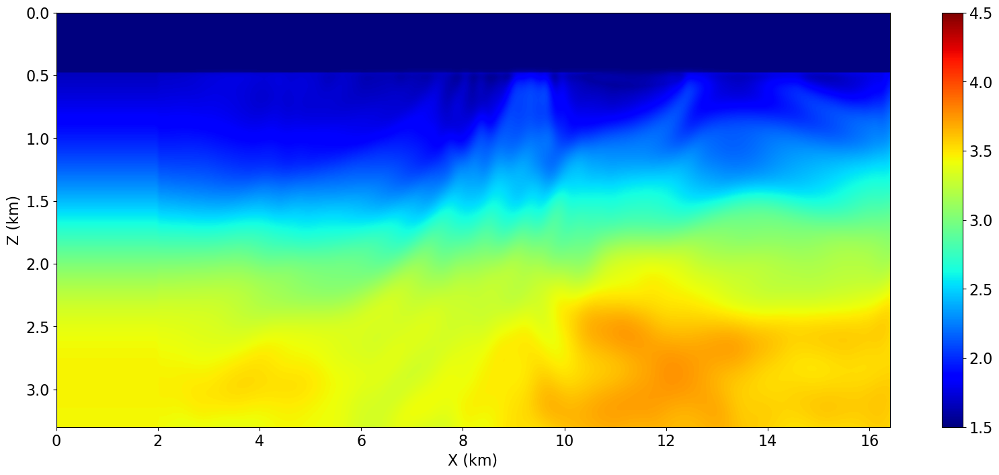

Nilai B : 0.6310688257217407
Maksimum p : 1.0
Minimum p : -0.12658774852752686
Norm P : 58.66438293457031
 
FWI freq 0.002 iterasi ke-7/19 : 127781747993.56262
Program dimulai pada: 11:10:56
Waktu eksekusi: 1278.47 detik
ff2 = 653053745686.3987, ff + a * l * gtp = 127781747993.2471, a*l*gtp = -0.31551936035156253
abs(g2tp) = 1887.0921630859375, abs(b*gtp) = 315.5193603515625
g2tp = 1887.0921630859375, (b*gtp) = -315.5193603515625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 11:32:14
Waktu eksekusi: 1274.98 detik
ff2 = 209263446895.77914, ff + a * l * gtp = 127781747993.53107, a*l*gtp = -0.031551936035156256
abs(g2tp) = 4910.2685546875, abs(b*gtp) = 315.5193603515625
g2tp = 4910.2685546875, (b*gtp) = -315.5193603515625
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 11:53:29
Waktu eksekusi: 1269.75 detik
ff2 = 133852036161.46542, ff + a * l * gtp = 127781747993.55946, a*l*gtp = -0.0031551936035156256
abs(g2tp) = 5820.

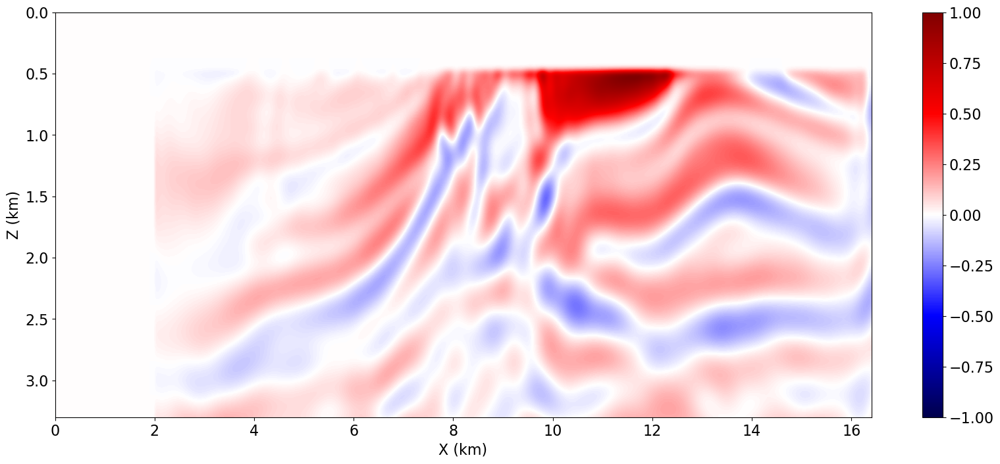

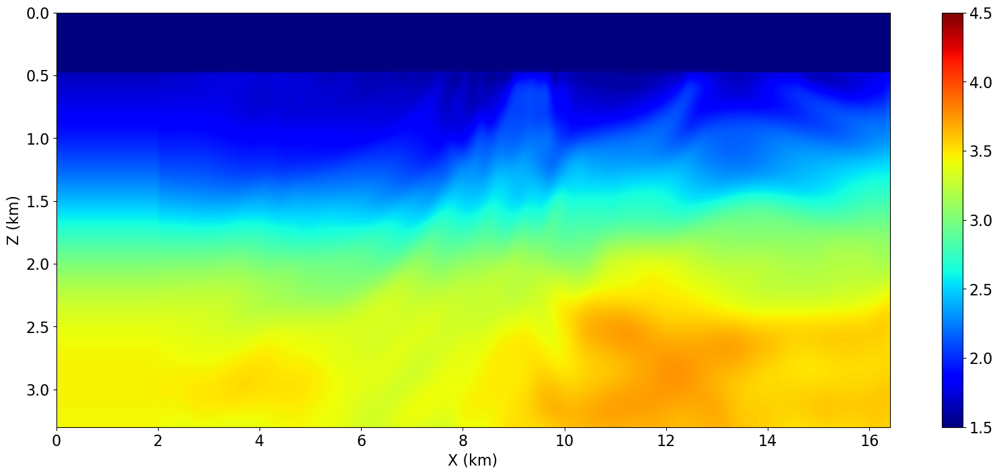

Nilai B : 0.999947190284729
Maksimum p : 0.2929469347000122
Minimum p : -1.0
Norm P : 79.8388671875
 
FWI freq 0.002 iterasi ke-8/19 : 127787374489.47247
Program dimulai pada: 13:18:08
Waktu eksekusi: 1187.40 detik
ff2 = 766235582195.7722, ff + a * l * gtp = 127787374488.85403, a*l*gtp = -0.6184361816406251
abs(g2tp) = 2984.741455078125, abs(b*gtp) = 618.436181640625
g2tp = 2984.741455078125, (b*gtp) = -618.436181640625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 13:37:56
Waktu eksekusi: 1213.00 detik
ff2 = 117709530349.61539, ff + a * l * gtp = 127787374489.41063, a*l*gtp = -0.0618436181640625
abs(g2tp) = 1296.4539794921875, abs(b*gtp) = 618.436181640625
g2tp = 1296.4539794921875, (b*gtp) = -618.436181640625
 
Strong Wolfe satisfied, l best : 0.1


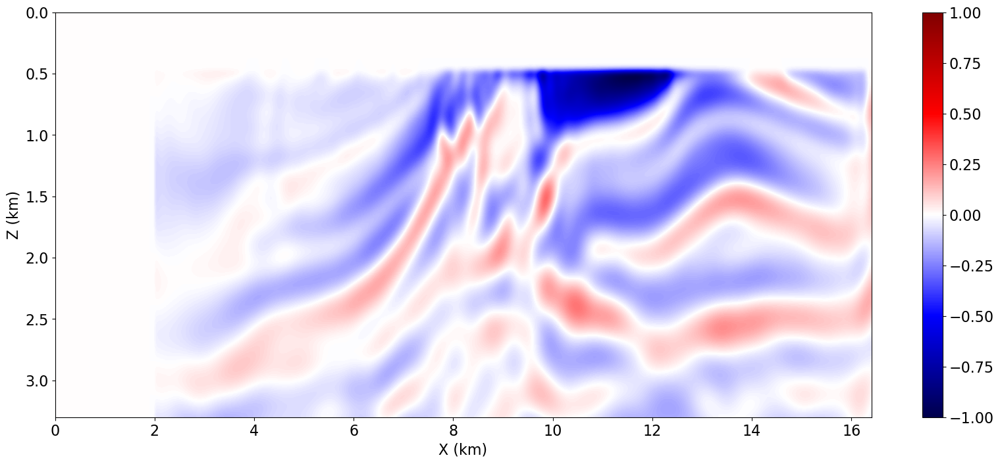

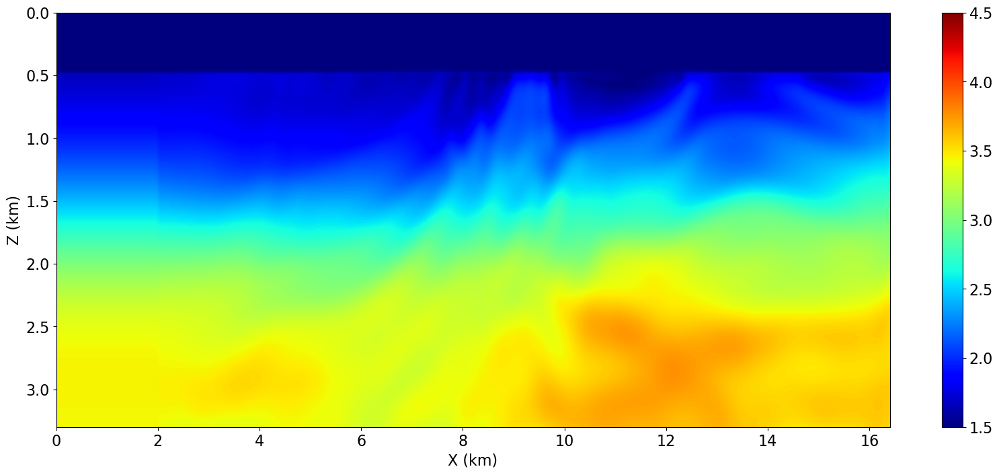

Nilai B : 0.6648709177970886
Maksimum p : 0.053730856627225876
Minimum p : -1.0
Norm P : 57.1697883605957
 
FWI freq 0.002 iterasi ke-9/19 : 117709530349.61539
Program dimulai pada: 13:58:09
Waktu eksekusi: 1198.00 detik
ff2 = 862394571798.4436, ff + a * l * gtp = 117709530349.28961, a*l*gtp = -0.325773193359375
abs(g2tp) = 2391.837890625, abs(b*gtp) = 325.773193359375
g2tp = 2391.837890625, (b*gtp) = -325.773193359375
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 14:18:07
Waktu eksekusi: 1193.58 detik
ff2 = 197388552020.5941, ff + a * l * gtp = 117709530349.58281, a*l*gtp = -0.0325773193359375
abs(g2tp) = 4095.124755859375, abs(b*gtp) = 325.773193359375
g2tp = 4095.124755859375, (b*gtp) = -325.773193359375
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 14:38:01
Waktu eksekusi: 1195.37 detik
ff2 = 124403337324.1445, ff + a * l * gtp = 117709530349.61214, a*l*gtp = -0.0032577319335937507
abs(g2tp) = 4337.9931640625, a

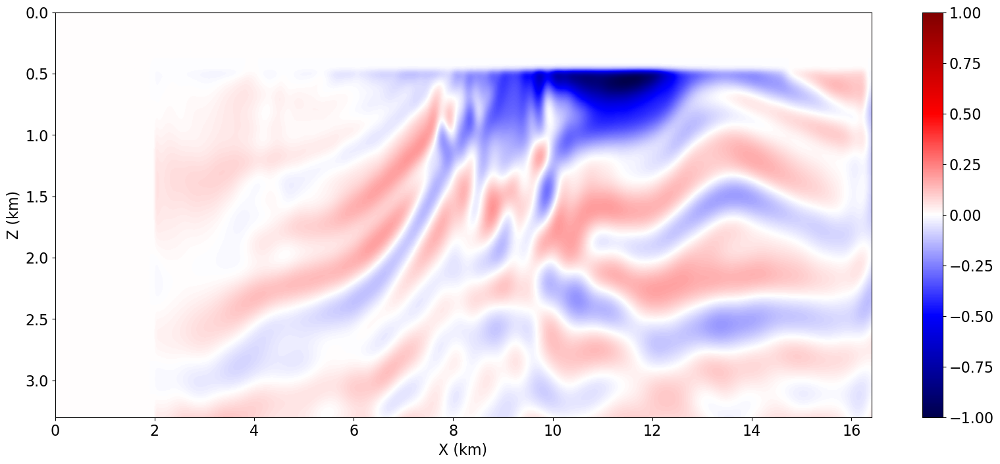

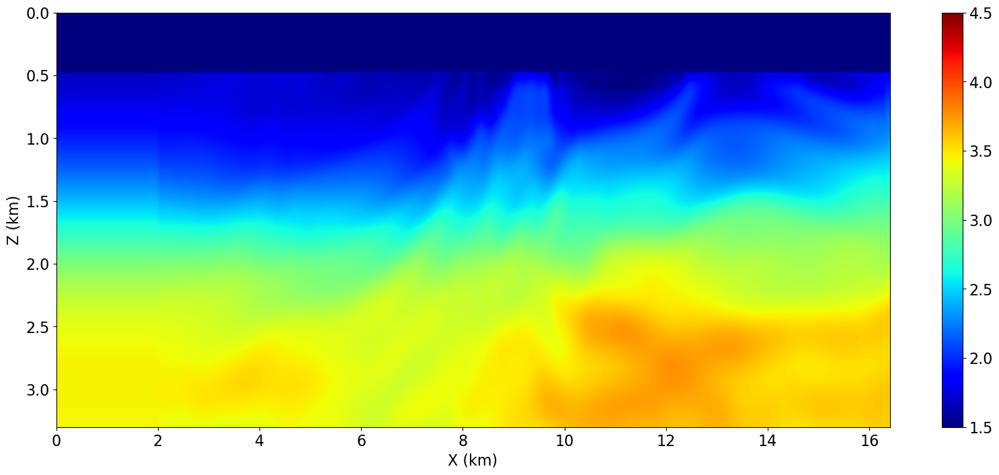

Nilai B : 0.9999635815620422
Maksimum p : 1.0
Minimum p : -0.20621608197689056
Norm P : 68.15137481689453
 
FWI freq 0.002 iterasi ke-10/19 : 117715635984.73318
Program dimulai pada: 15:56:11
Waktu eksekusi: 1205.32 detik
ff2 = 566269867694.7811, ff + a * l * gtp = 117715635984.2786, a*l*gtp = -0.45459482421875
abs(g2tp) = 1821.1416015625, abs(b*gtp) = 454.59482421875003
g2tp = 1821.1416015625, (b*gtp) = -454.59482421875003
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 16:16:16
Waktu eksekusi: 1288.78 detik
ff2 = 105922344378.12213, ff + a * l * gtp = 117715635984.68773, a*l*gtp = -0.045459482421875
abs(g2tp) = 1401.4415283203125, abs(b*gtp) = 454.59482421875003
g2tp = 1401.4415283203125, (b*gtp) = -454.59482421875003
 
Strong Wolfe satisfied, l best : 0.1


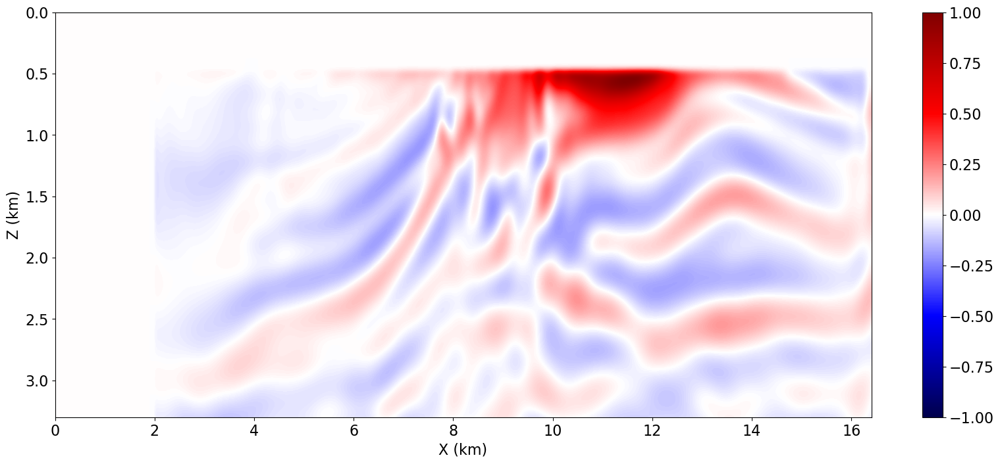

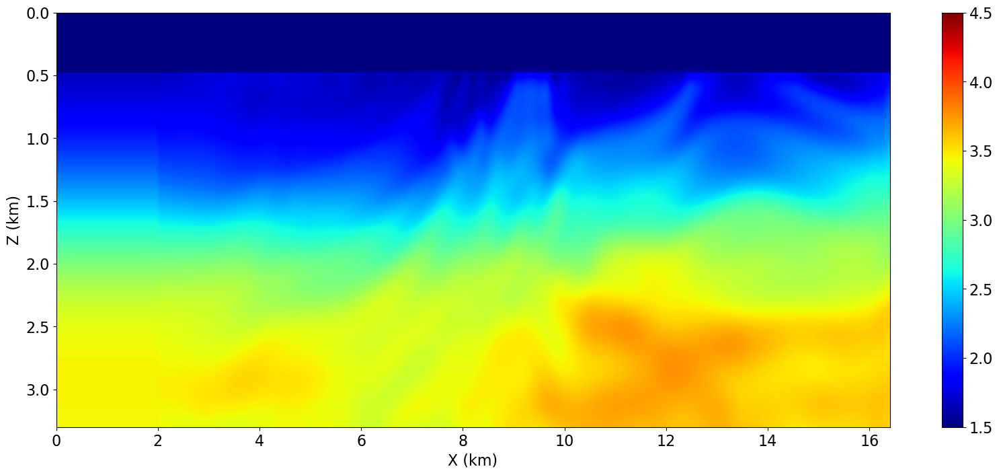

Nilai B : 1.4066804647445679
Maksimum p : 1.0
Minimum p : -0.03986727446317673
Norm P : 57.11180877685547
 
FWI freq 0.002 iterasi ke-11/19 : 105922344378.12213
Program dimulai pada: 16:37:47
Waktu eksekusi: 1226.62 detik
ff2 = 627617564286.6406, ff + a * l * gtp = 105922344377.7971, a*l*gtp = -0.3250305419921875
abs(g2tp) = 1774.6202392578125, abs(b*gtp) = 325.0305419921875
g2tp = 1774.6202392578125, (b*gtp) = -325.0305419921875
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 16:58:14
Waktu eksekusi: 1163.51 detik
ff2 = 181609858533.73376, ff + a * l * gtp = 105922344378.08963, a*l*gtp = -0.032503054199218756
abs(g2tp) = 4559.13720703125, abs(b*gtp) = 325.0305419921875
g2tp = 4559.13720703125, (b*gtp) = -325.0305419921875
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 17:17:37
Waktu eksekusi: 1165.37 detik
ff2 = 111225763281.84586, ff + a * l * gtp = 105922344378.11888, a*l*gtp = -0.0032503054199218757
abs(g2tp) = 545

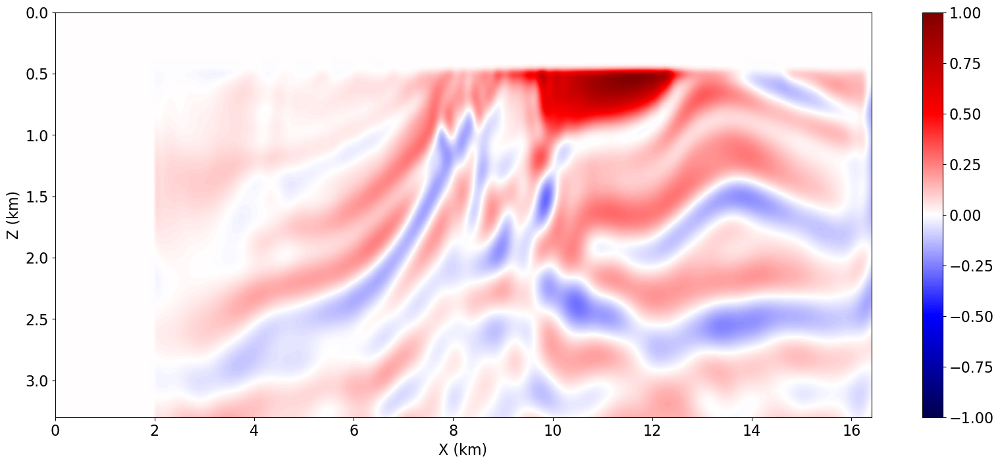

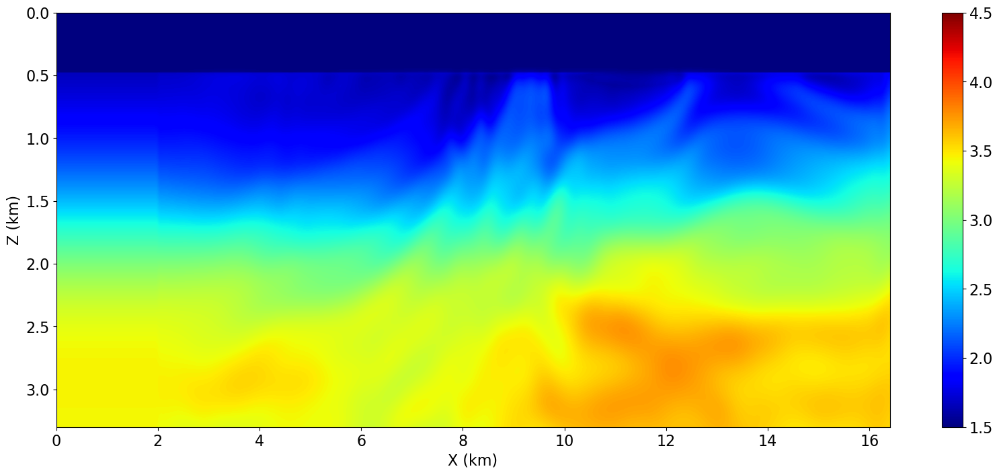

Nilai B : 0.9998799562454224
Maksimum p : 0.29625532031059265
Minimum p : -1.0
Norm P : 77.61349487304688
 
FWI freq 0.002 iterasi ke-12/19 : 105926276479.71375
Program dimulai pada: 18:36:04
Waktu eksekusi: 1190.79 detik
ff2 = 729069876881.0702, ff + a * l * gtp = 105926276479.13141, a*l*gtp = -0.5823356933593751
abs(g2tp) = 2922.572021484375, abs(b*gtp) = 582.335693359375
g2tp = 2922.572021484375, (b*gtp) = -582.335693359375
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 18:55:55
Waktu eksekusi: 1193.14 detik
ff2 = 106428977538.57294, ff + a * l * gtp = 105926276479.65552, a*l*gtp = -0.058233569335937506
abs(g2tp) = 1895.4669189453125, abs(b*gtp) = 582.335693359375
g2tp = 1895.4669189453125, (b*gtp) = -582.335693359375
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 19:15:48
Waktu eksekusi: 1192.54 detik
ff2 = 101378769087.43054, ff + a * l * gtp = 105926276479.70792, a*l*gtp = -0.005823356933593751
abs(g2tp) = 6425.

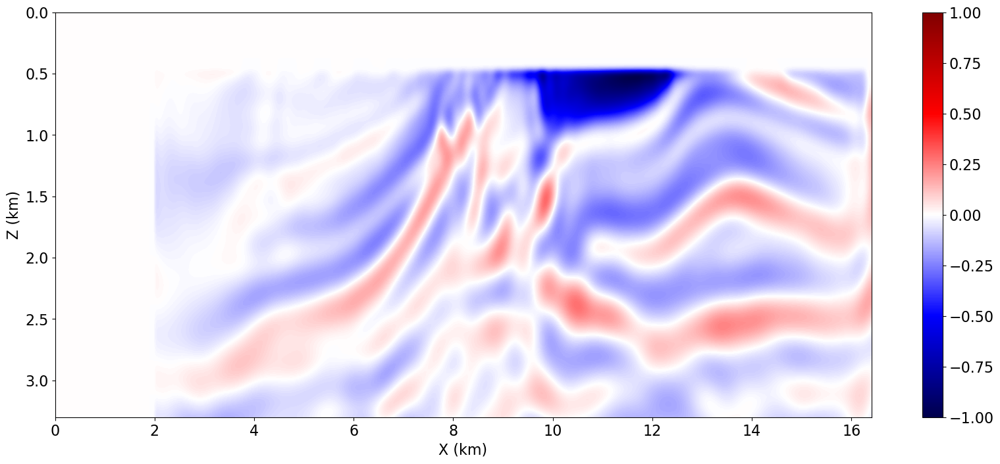

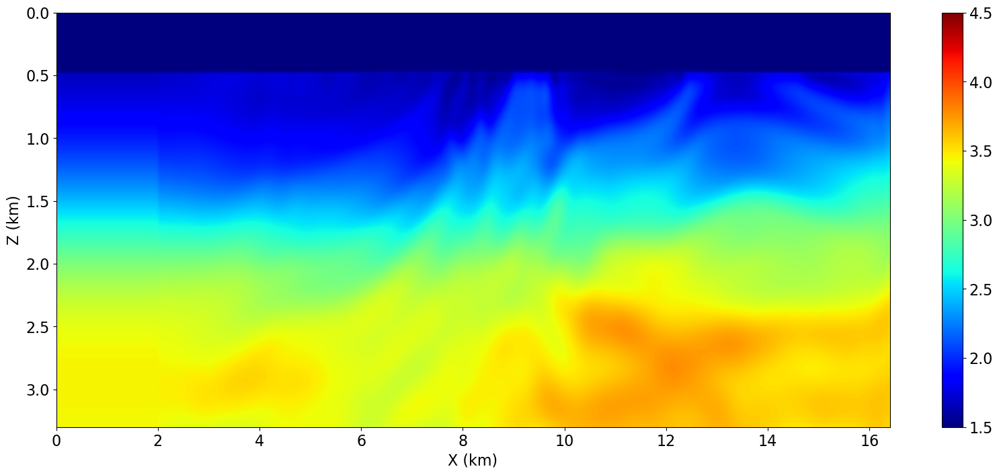

Nilai B : 2.2043955326080322
Maksimum p : 0.13301369547843933
Minimum p : -1.0
Norm P : 61.4469108581543
 
FWI freq 0.002 iterasi ke-13/19 : 93042560169.01376
Program dimulai pada: 20:15:13
Waktu eksekusi: 1191.26 detik
ff2 = 833911365925.6941, ff + a * l * gtp = 93042560168.78581, a*l*gtp = -0.227951806640625
abs(g2tp) = 2343.535400390625, abs(b*gtp) = 227.95180664062502
g2tp = 2343.535400390625, (b*gtp) = -227.95180664062502
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 20:35:05
Waktu eksekusi: 1193.63 detik
ff2 = 128912008163.45355, ff + a * l * gtp = 93042560168.99097, a*l*gtp = -0.0227951806640625
abs(g2tp) = 10968.4228515625, abs(b*gtp) = 227.95180664062502
g2tp = 10968.4228515625, (b*gtp) = -227.95180664062502
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 20:54:58
Waktu eksekusi: 1190.81 detik
ff2 = 95818683343.00644, ff + a * l * gtp = 93042560169.01149, a*l*gtp = -0.00227951806640625
abs(g2tp) = 22360.78710

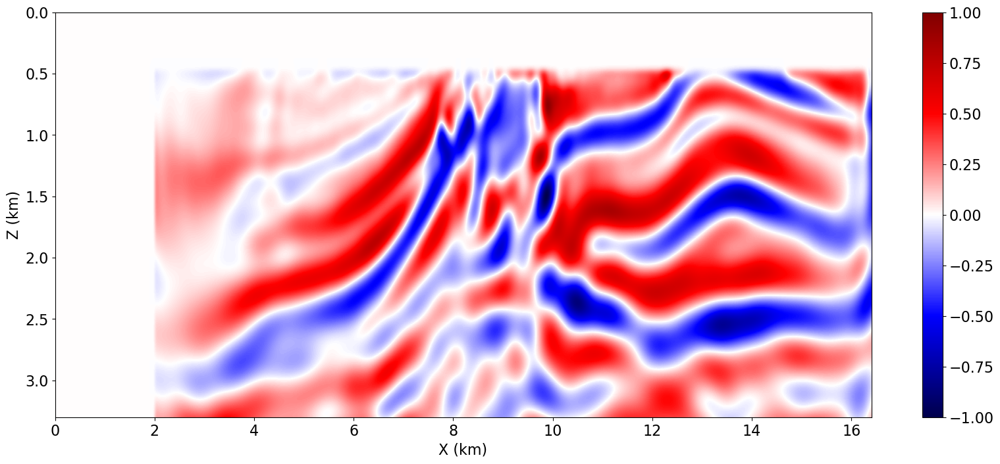

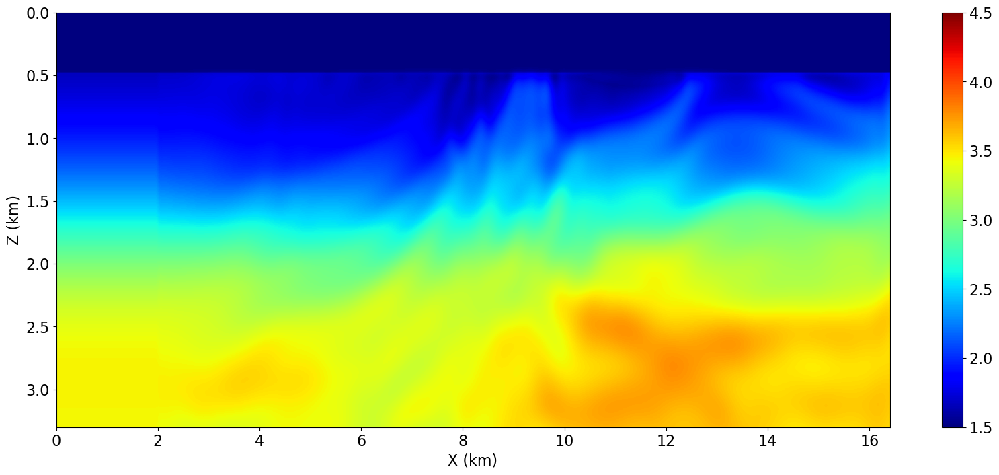

Nilai B : 1.0000230073928833
Maksimum p : 1.0
Minimum p : -0.9457270503044128
Norm P : 157.39088439941406
 
FWI freq 0.002 iterasi ke-14/19 : 93045012444.80844
Program dimulai pada: 22:14:22
Waktu eksekusi: 1193.28 detik
ff2 = 508418932419.9701, ff + a * l * gtp = 93045012442.515, a*l*gtp = -2.2934398437500003
abs(g2tp) = 3200.133544921875, abs(b*gtp) = 2293.43984375
g2tp = 3200.133544921875, (b*gtp) = -2293.43984375
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 22:34:15
Waktu eksekusi: 1188.98 detik
ff2 = 78504133912.7349, ff + a * l * gtp = 93045012444.5791, a*l*gtp = -0.22934398437500003
abs(g2tp) = 4552.03271484375, abs(b*gtp) = 2293.43984375
g2tp = -4552.03271484375, (b*gtp) = -2293.43984375
 
Armijo satisfied but curvature not satisfied, l update : 0.2
Program dimulai pada: 22:54:04
Waktu eksekusi: 1191.27 detik
ff2 = 94082453699.64124, ff + a * l * gtp = 93045012444.34975, a*l*gtp = -0.45868796875000006
abs(g2tp) = 237.42739868164062, abs(b*gtp) = 2293

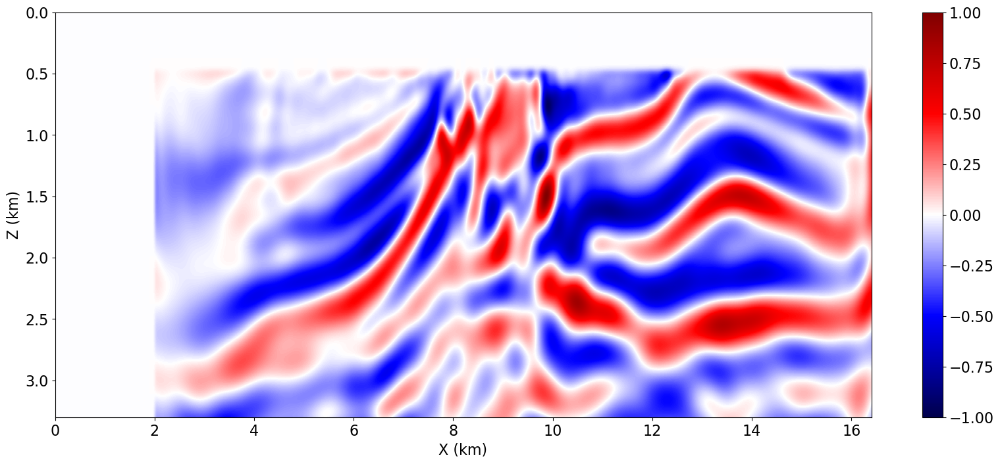

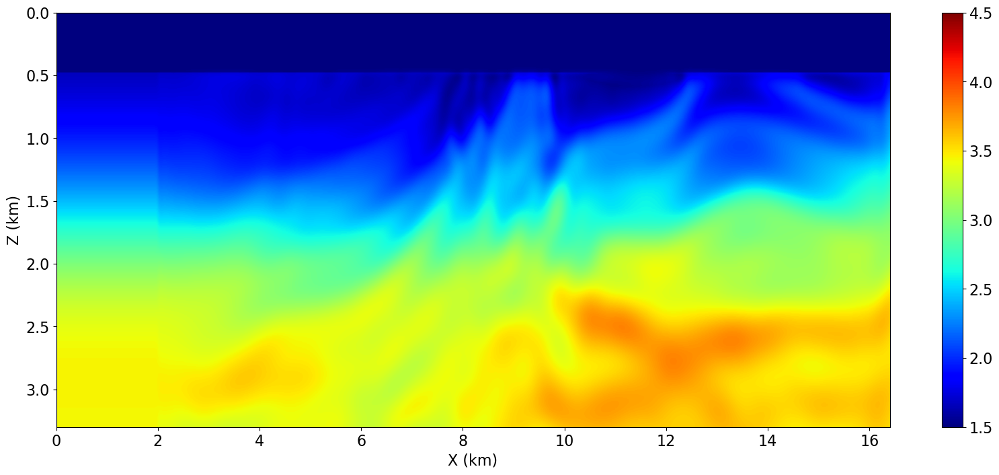

Nilai B : 0.3342961072921753
Maksimum p : 0.07264304161071777
Minimum p : -1.0
Norm P : 59.90728759765625
 
FWI freq 0.002 iterasi ke-15/19 : 78504133912.7349
Program dimulai pada: 23:53:20
Waktu eksekusi: 1192.80 detik
ff2 = 694075371863.26, ff + a * l * gtp = 78504133912.44577, a*l*gtp = -0.28913068847656254
abs(g2tp) = 2764.073974609375, abs(b*gtp) = 289.1306884765625
g2tp = 2764.073974609375, (b*gtp) = -289.1306884765625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 00:13:13
Waktu eksekusi: 1195.29 detik
ff2 = 154883579363.89062, ff + a * l * gtp = 78504133912.70598, a*l*gtp = -0.02891306884765625
abs(g2tp) = 3696.240234375, abs(b*gtp) = 289.1306884765625
g2tp = 3696.240234375, (b*gtp) = -289.1306884765625
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 00:33:08
Waktu eksekusi: 1201.04 detik
ff2 = 82884835070.63464, ff + a * l * gtp = 78504133912.73201, a*l*gtp = -0.0028913068847656255
abs(g2tp) = 4284.7666015625,

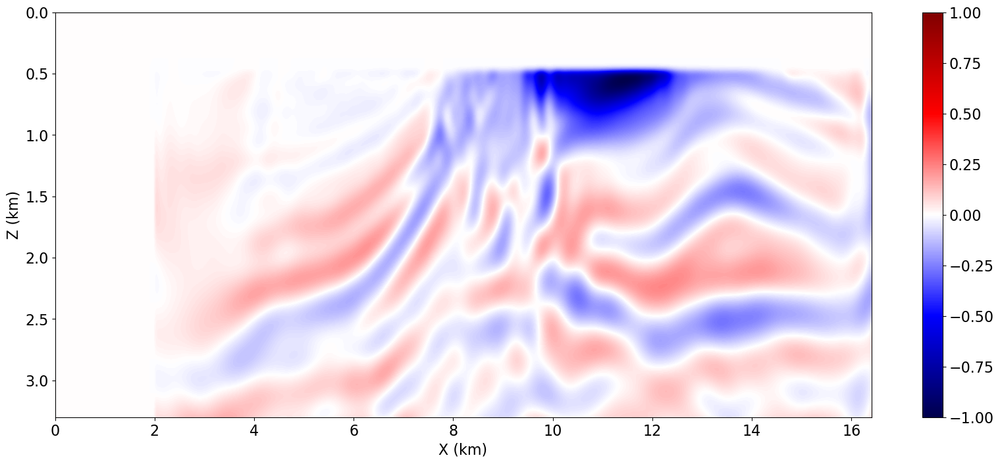

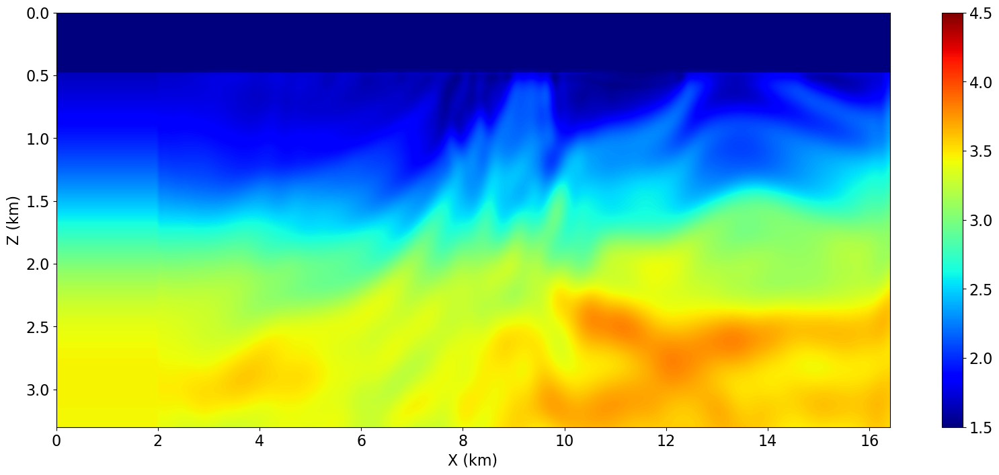

Nilai B : 0.999882161617279
Maksimum p : 1.0
Minimum p : -0.23561254143714905
Norm P : 69.29768371582031
 
FWI freq 0.002 iterasi ke-16/19 : 78507752031.5253
Program dimulai pada: 01:53:01
Waktu eksekusi: 1183.24 detik
ff2 = 538853362866.34375, ff + a * l * gtp = 78507752031.06175, a*l*gtp = -0.46354775390625
abs(g2tp) = 1999.281494140625, abs(b*gtp) = 463.54775390625
g2tp = 1999.281494140625, (b*gtp) = -463.54775390625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 02:12:44
Waktu eksekusi: 1186.20 detik
ff2 = 86044777879.18735, ff + a * l * gtp = 78507752031.47894, a*l*gtp = -0.046354775390625005
abs(g2tp) = 2171.94384765625, abs(b*gtp) = 463.54775390625
g2tp = 2171.94384765625, (b*gtp) = -463.54775390625
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 02:32:30
Waktu eksekusi: 1192.91 detik
ff2 = 75196975864.35406, ff + a * l * gtp = 78507752031.52066, a*l*gtp = -0.004635477539062501
abs(g2tp) = 5247.76123046875, abs(

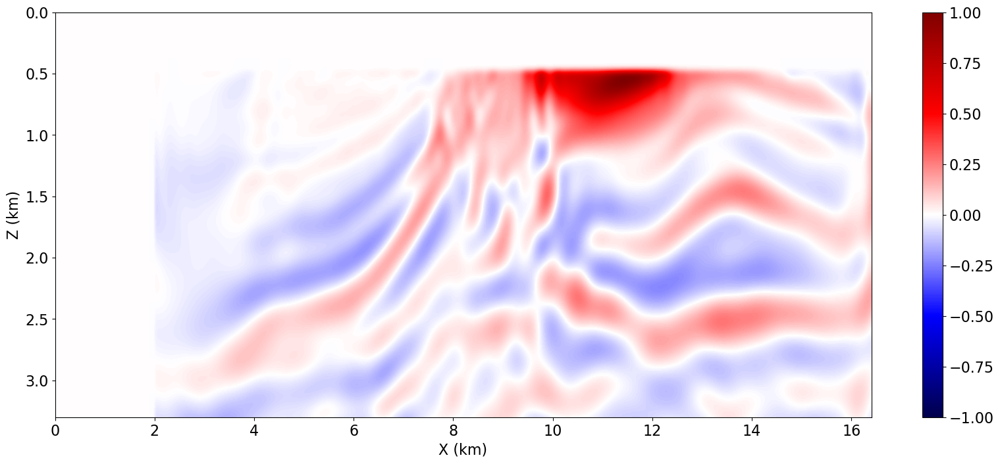

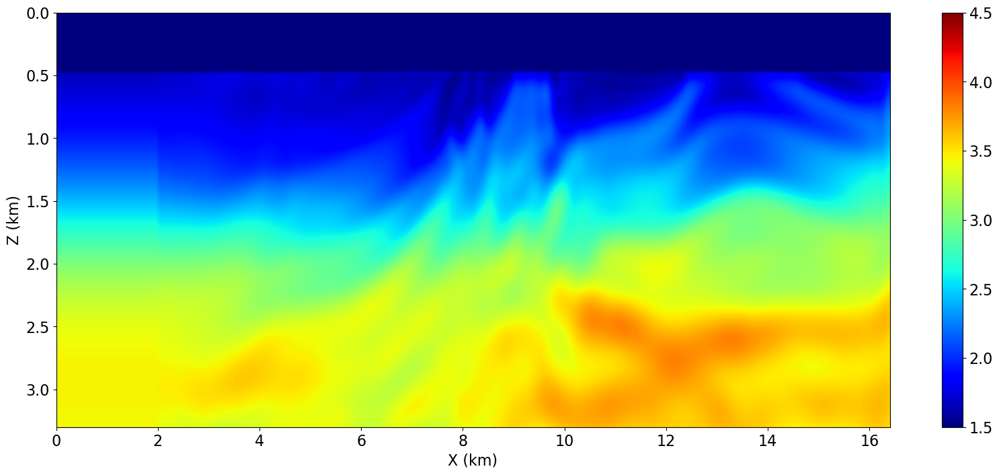

Nilai B : 3.1809911727905273
Maksimum p : 1.0
Minimum p : -0.05688833072781563
Norm P : 57.11597442626953
 
FWI freq 0.002 iterasi ke-17/19 : 71310743378.45105
Program dimulai pada: 03:32:02
Waktu eksekusi: 1200.49 detik
ff2 = 577405945359.7661, ff + a * l * gtp = 71310743378.16954, a*l*gtp = -0.2815164794921875
abs(g2tp) = 1746.0732421875, abs(b*gtp) = 281.5164794921875
g2tp = 1746.0732421875, (b*gtp) = -281.5164794921875
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 03:52:03
Waktu eksekusi: 1191.73 detik
ff2 = 105578623060.1745, ff + a * l * gtp = 71310743378.4229, a*l*gtp = -0.02815164794921875
abs(g2tp) = 6774.27197265625, abs(b*gtp) = 281.5164794921875
g2tp = 6774.27197265625, (b*gtp) = -281.5164794921875
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 04:11:55
Waktu eksekusi: 1204.12 detik
ff2 = 73327969203.12701, ff + a * l * gtp = 71310743378.44824, a*l*gtp = -0.0028151647949218755
abs(g2tp) = 21954.087890625,

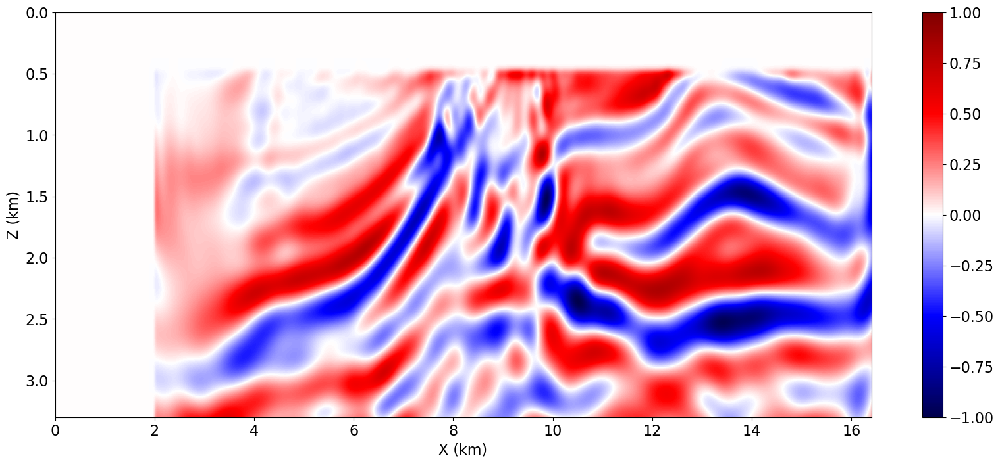

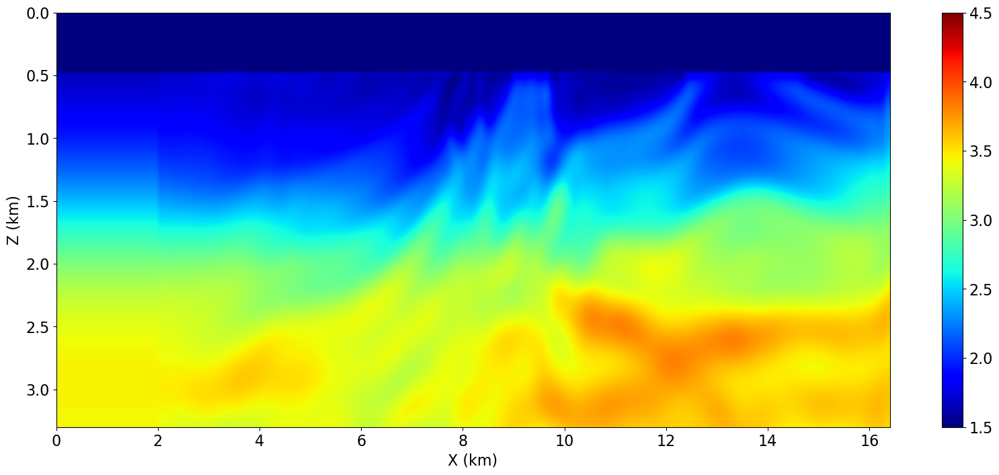

Nilai B : 1.0000700950622559
Maksimum p : 1.0
Minimum p : -0.8172560334205627
Norm P : 165.02154541015625
 
FWI freq 0.002 iterasi ke-18/19 : 71312864837.32439
Program dimulai pada: 05:31:38
Waktu eksekusi: 1196.48 detik
ff2 = 583419112086.2574, ff + a * l * gtp = 71312864834.85358, a*l*gtp = -2.4708134765625003
abs(g2tp) = 3256.008056640625, abs(b*gtp) = 2470.8134765625
g2tp = 3256.008056640625, (b*gtp) = -2470.8134765625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 05:51:35
Waktu eksekusi: 1200.13 detik
ff2 = 74065912306.72021, ff + a * l * gtp = 71312864837.0773, a*l*gtp = -0.24708134765625003
abs(g2tp) = 1081.7991943359375, abs(b*gtp) = 2470.8134765625
g2tp = -1081.7991943359375, (b*gtp) = -2470.8134765625
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 06:11:36
Waktu eksekusi: 1190.47 detik
ff2 = 69666945742.02002, ff + a * l * gtp = 71312864837.29968, a*l*gtp = -0.024708134765625004
abs(g2tp) = 23376.9296875, a

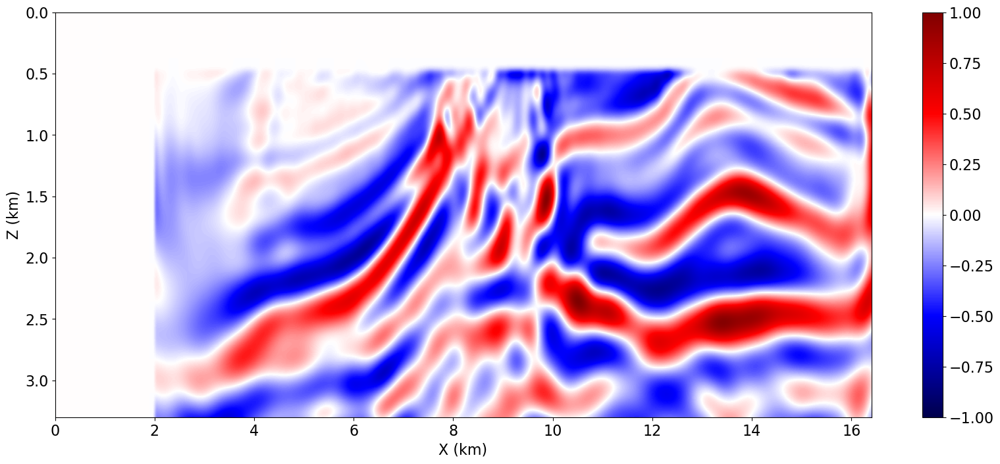

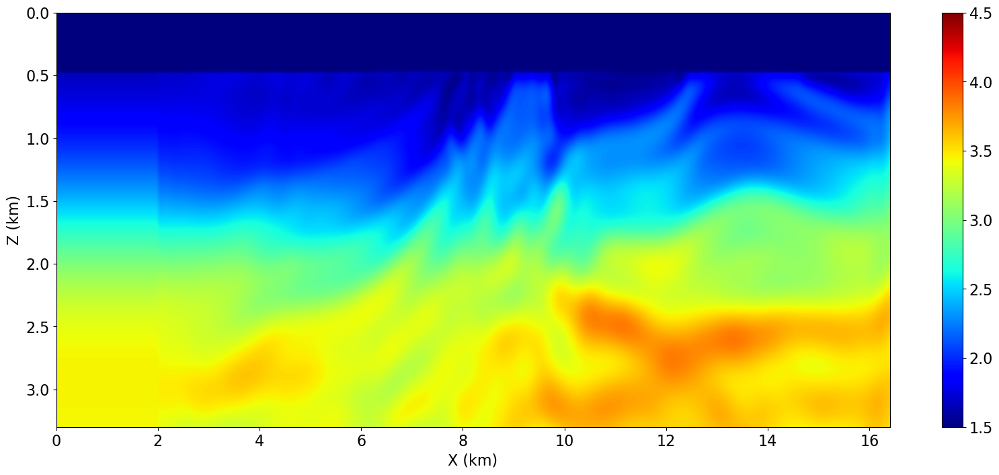

 
FWI freq 0.002 iterasi ke-19/19 : 67123379641.83643


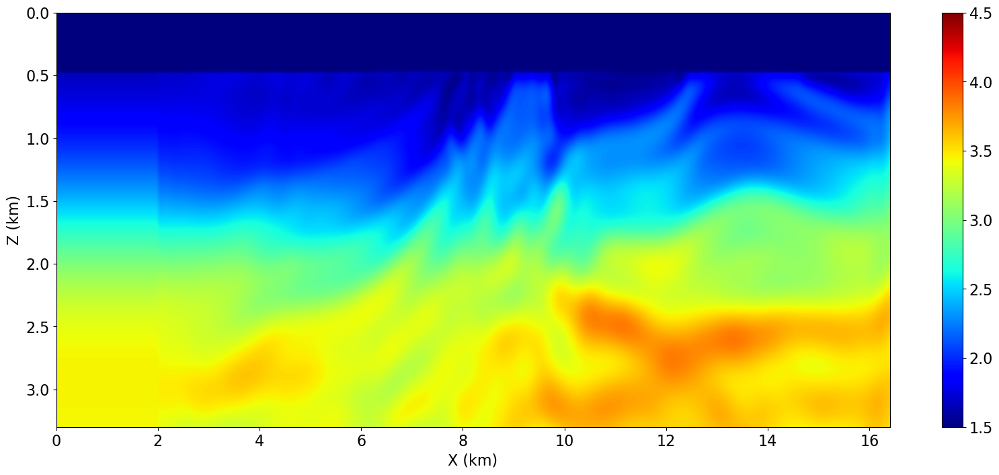

Proses FWI freq 0.006
Program dimulai pada: 07:11:08

Waktu eksekusi: 1195.80 detik

Maksimum p : 1.0
Minimum p : -0.6288051605224609
Norm P : 71.77324676513672
 
FWI freq 0.006 iterasi ke-0/19 : 796731294193.3044
Program dimulai pada: 07:31:04
Waktu eksekusi: 1191.52 detik
ff2 = 2901405302256.823, ff + a * l * gtp = 796731294192.79, a*l*gtp = -0.5144650390625001
abs(g2tp) = 696.4202880859375, abs(b*gtp) = 514.4650390625001
g2tp = 696.4202880859375, (b*gtp) = -514.4650390625001
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 07:50:55
Waktu eksekusi: 1193.72 detik
ff2 = 814717534076.1344, ff + a * l * gtp = 796731294193.253, a*l*gtp = -0.05144650390625
abs(g2tp) = 1112.960205078125, abs(b*gtp) = 514.4650390625001
g2tp = 1112.960205078125, (b*gtp) = -514.4650390625001
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 08:10:49
Waktu eksekusi: 1190.99 detik
ff2 = 758440215118.4475, ff + a * l * gtp = 796731294193.2993, a*l*gt

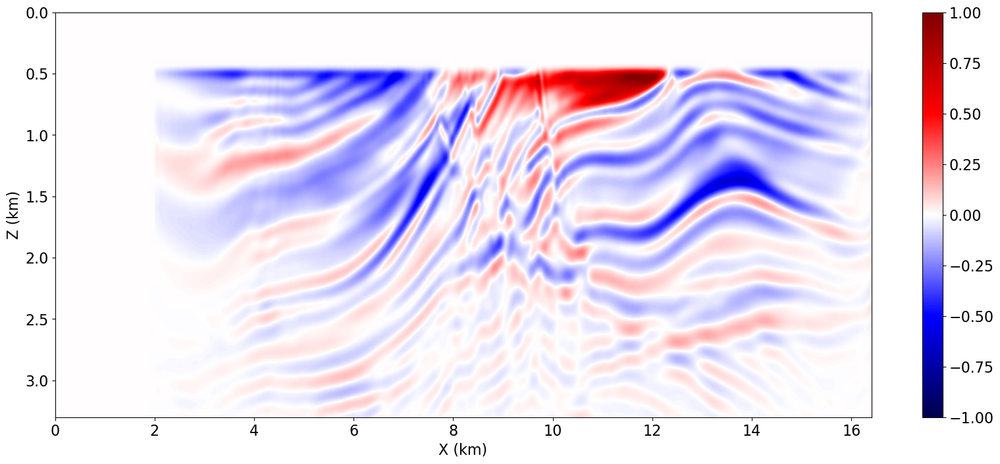

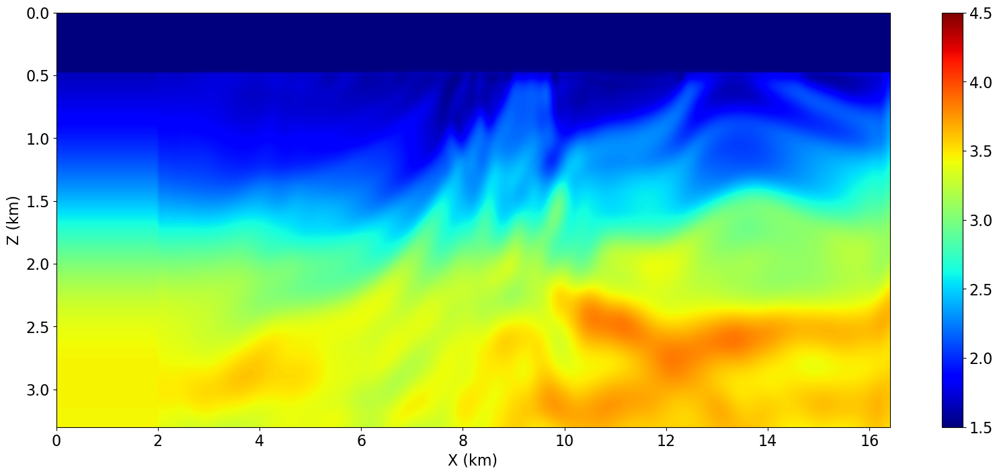

Nilai B : 0.9862887859344482
Maksimum p : 1.0
Minimum p : -0.1931457668542862
Norm P : 48.4330940246582
 
FWI freq 0.006 iterasi ke-1/19 : 705280088203.587
Program dimulai pada: 09:09:37
Waktu eksekusi: 1183.20 detik
ff2 = 2257527224470.8745, ff + a * l * gtp = 705280088203.3904, a*l*gtp = -0.19669697265625
abs(g2tp) = 453.07177734375, abs(b*gtp) = 196.69697265625
g2tp = 453.07177734375, (b*gtp) = -196.69697265625
 
nether wolve satisfied and l>100, l update : 0.1
Program dimulai pada: 09:29:20
Waktu eksekusi: 1185.59 detik
ff2 = 1287040910832.2944, ff + a * l * gtp = 705280088203.5674, a*l*gtp = -0.019669697265625
abs(g2tp) = 4222.63330078125, abs(b*gtp) = 196.69697265625
g2tp = 4222.63330078125, (b*gtp) = -196.69697265625
 
nether wolve satisfied and l>100, l update : 0.010000000000000002
Program dimulai pada: 09:49:06
Waktu eksekusi: 1185.77 detik
ff2 = 744729966343.8988, ff + a * l * gtp = 705280088203.5851, a*l*gtp = -0.0019669697265625005
abs(g2tp) = 4777.12646484375, abs(b*gtp) 

In [ ]:
from copy import deepcopy
from devito import mmax, norm
import time as tm
from datetime import datetime

multiscale_freq = np.array([2., 6., 13.])
multiscale_freq /= 1000

modelbest_each_freq = []


update_model = Model(vp=vp0, origin=origin, shape=shape, spacing=spacing,
            space_order=2, nbl=nboundary, bcs="damp", grid = model0.grid)

#update_model.vp.data[:] = np.loadtxt("Model_Progres/Best Model 2.0 Hz Vp0 Rev1.txt")

xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()


for k in multiscale_freq:
    print(f"Proses FWI freq {k}")

    geometrys, srcs = geometry_and_source(nshots, shot_first_coordinate, shot_last_coordinate, shot_depth, nreceivers, first_channel_firstlreceriverline_coordinate, last_channel_firstreceiverline_coordinate, receiver_depth, receiverline_interval, t0, tn, dt, k, shift_phase)
    
    misfiti = []
    modeli =[]
    gradi = []
    #plot_velocity(update_model)
    model_update = deepcopy(update_model.vp.data[:])
    modeli.append(model_update)

    fwi_iterations = 19  # Number of outer FWI iteration
    fwi_index = 0
    for i in range(fwi_iterations):
        if i==0 :
            start_time = tm.time()
            

            time_start = datetime.now()
            print("Program dimulai pada:", time_start.strftime("%H:%M:%S"))

            
            ff, update = fwi_gradient(update_model.vp)
            
            end_time = tm.time()

            print("")
            print(f"Waktu eksekusi: {end_time - start_time:.2f} detik")
            print("")
            

            gradient = deepcopy(update)
            gradient.data[:] *= -1

        else :
            ff, update1 = FF, G

            gradient1 = deepcopy(update1)
            gradient1.data[:] *= -1

            update = cg_hs(gradient, gradient1, update)

            if np.sum(gradient1.data[:]*update.data[:]) >= 0:
                update.data[:] = deepcopy(gradient1.data[:])
                update.data[:] *= -1
      
            gradient = deepcopy(gradient1)

        print(f"Maksimum p : {np.max(update.data)}")
        print(f"Minimum p : {np.min(update.data)}")
        print(f"Norm P : {norm(update)}")


        misfit_model = deepcopy(ff)
        misfiti.append(misfit_model)

        updatei = deepcopy(update.data[:])
        gradi.append(updatei)


        print(f" ")
        print(f"===========================================================")
        print(f"FWI freq {k} iterasi ke-{fwi_index}/{fwi_iterations} : {ff}")
    

        L, FF, G = linesearch(update_model, ff, gradient, update, a=0.0001, b=0.1, l=1, max_iter=5, max_l = 100, scale_l=2) 

    
        update_model.vp.data[:] += ((L))*update.data[:]
        update_model.vp.data[:] = np.clip(update_model.vp.data[:], 1.5, 4.7)

        model_update = deepcopy(update_model.vp.data[:])
        modeli.append(model_update)
    
        fwi_index+=1

        plt.figure(figsize=(20, 8))
        plt.imshow(update.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', vmin=-1, vmax=1, aspect='auto')
        plt.colorbar()
        plt.xlabel("X (km)")
        plt.ylabel("Z (km)")
        plt.show()


        plt.figure(figsize=(20, 8))
        plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
        plt.colorbar()
        plt.xlabel("X (km)")
        plt.ylabel("Z (km)")
        plt.show()
    
    ff = FF
    misfit_model = deepcopy(ff)
    misfiti.append(misfit_model)

    print(f" ")
    print(f"===========================================================")
    print(f"FWI freq {k} iterasi ke-{fwi_index}/{fwi_iterations} : {ff}")

    best_model = deepcopy(update_model.vp.data[:])

    modelbest_each_freq.append(best_model)

    np.savetxt(f'Model_Progres/Best Model {k*1000} Hz Devito.txt', best_model)
    np.savetxt(f'Model_Progres/Misfit {k*1000} Hz Devito.txt', misfiti)
    np.save(f'Model_Progres/Update Model {k*1000} Hz Devito.npy', modeli)
    np.save(f'Model_Progres/Gradient Model {k*1000} Hz Devito.npy', gradi)

    
    plt.figure(figsize=(20, 8))
    plt.imshow(update_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', vmin=1.5, vmax=4.5, aspect='auto')
    plt.colorbar()
    plt.xlabel("X (km)")
    plt.ylabel("Z (km)")
    plt.show()

In [9]:
best_model = deepcopy(update_model.vp.data[:])

modelbest_each_freq.append(best_model)

np.savetxt(f'Model_Progres/Best Model 2.0 Hz Devito.txt', best_model)
np.savetxt(f'Model_Progres/Misfit 2.0 Hz Devito.txt', misfiti)
np.save(f'Model_Progres/Update Model 2.0 Hz Devito.npy', modeli)
np.save(f'Model_Progres/Gradient Model 2.0 Hz Devito.npy', gradi)

NameError: name 'update_model' is not defined

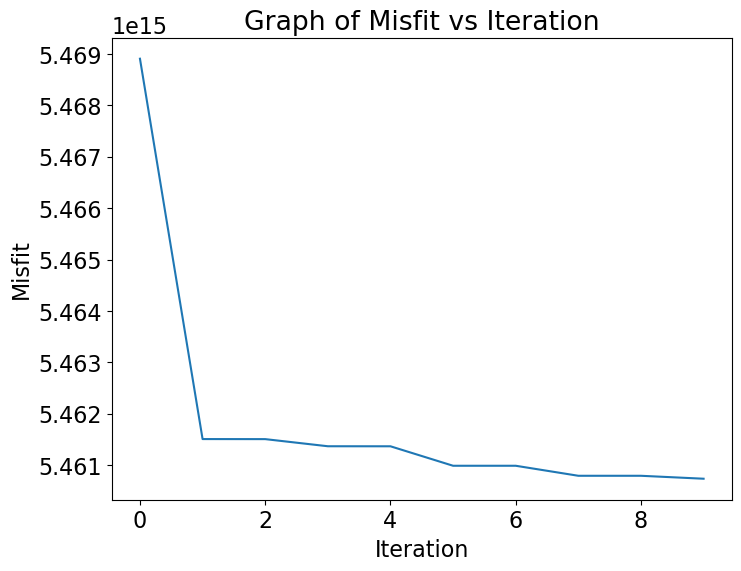

In [46]:
import matplotlib.pyplot as plt

misfit_freq = np.loadtxt(f'Model_Progres/Misfit Model 2.0 Hz Vp0 Rev1.txt')


plt.plot(misfit_freq)
plt.title("Graph of Misfit vs Iteration")
plt.xlabel("Iteration")
plt.ylabel("Misfit")
plt.show()

(9, 1472, 424)


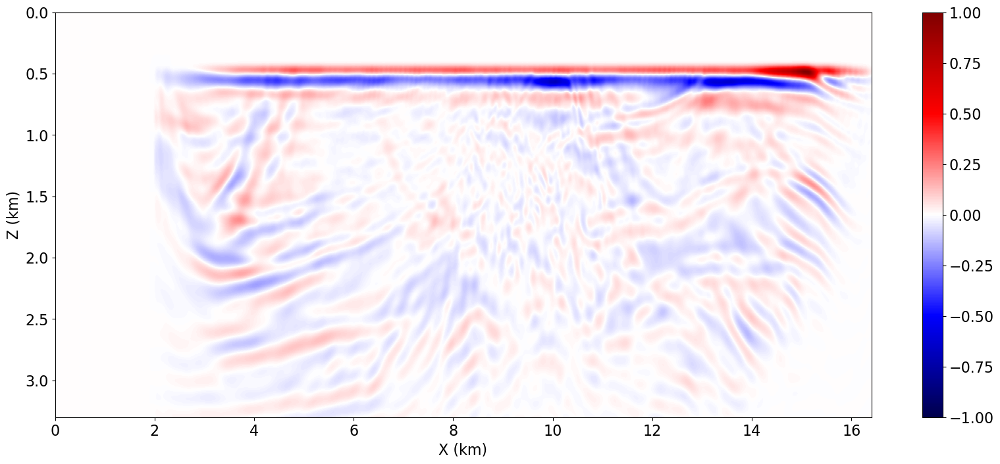

In [80]:
import numpy as np
from copy import deepcopy

grad_cek = Function(name="grad_cek", grid=model0.grid)

# Load file .npy
Gradient_check = np.load('Model_Progres/Gradient Model 6.0 Hz Vp0 Rev1.npy')

# Cek hasilnya
print(Gradient_check.shape)


Gradient_Dummy = deepcopy(grad_cek)
Gradient_Dummy.data[:] = Gradient_check[0]
#Gradient_Dummy.data[:] /= np.linalg.norm((Gradient_Dummy.data[:]))


xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(Gradient_Dummy.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='seismic', aspect='auto', vmin=-1, vmax=1)
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()


(1472, 424)


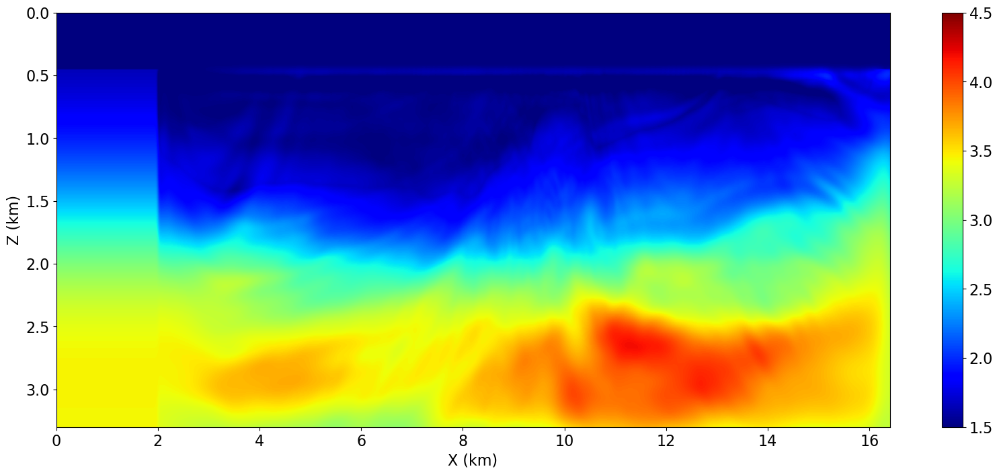

In [104]:
import numpy as np
from copy import deepcopy

model_cek = deepcopy(model0)

# Load file .npy
model_cek.vp.data[:] = np.loadtxt('Model_Progres/Best Model 6.0 Hz Vp0 Rev1.txt')

# Cek hasilnya
print(model_cek.vp.shape)




xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(model_cek.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', aspect='auto', vmin = 1.5, vmax=4.5)
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

(10, 1472, 424)


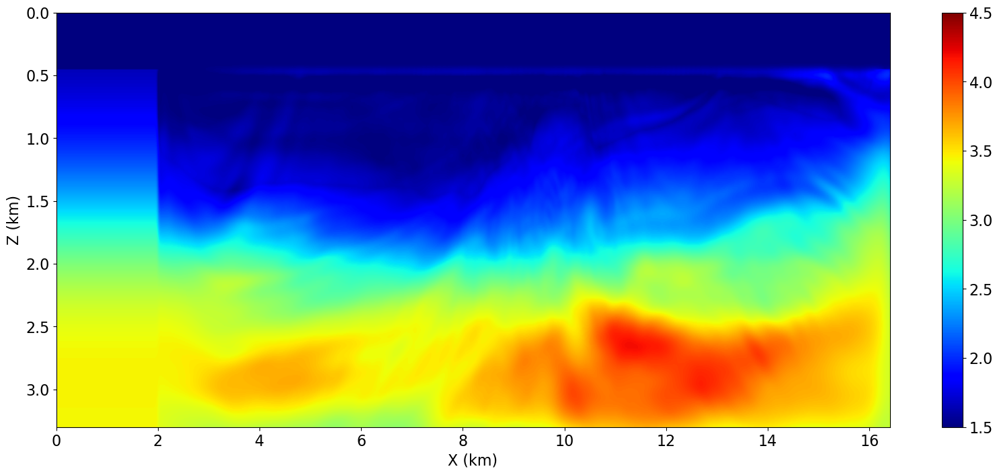

In [103]:
import numpy as np
from copy import deepcopy


model_cek = deepcopy(model0)

# Load file .npy
model_cek_i = np.load('Model_Progres/Update Model 6.0 Hz Vp0 Rev1.npy')
print(model_cek_i.shape)


model_cek.vp.data[:] = model_cek_i[1]

# Cek hasilnya



xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.figure(figsize=(20, 8))
plt.imshow(model_cek.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', aspect='auto', vmin = 1.5, vmax=4.5)
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

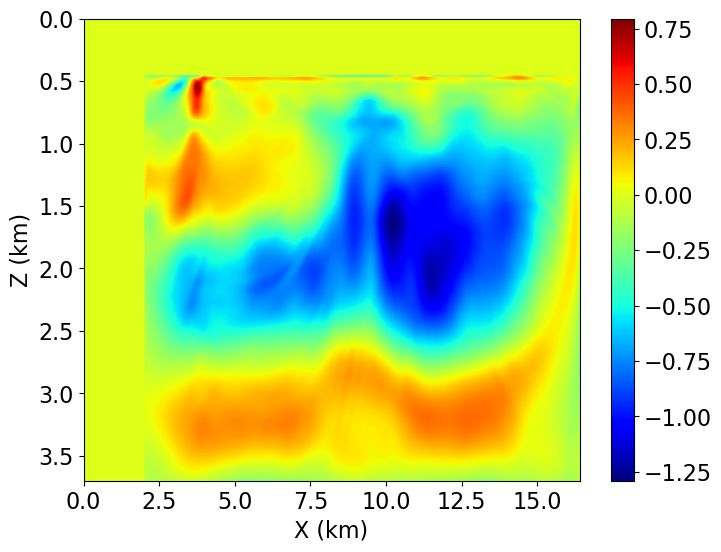

In [36]:
selisih_model = Model(vp=vp0, origin=origin, shape=shape, spacing=spacing,
              space_order=2, nbl=nboundary, bcs="damp", grid = model0.grid)
selisih_model.vp.data[:] = update_model.vp.data[:] - model0.vp.data[:]
xmin = (origin[0]*spacing[0])/1000
zmin = (origin[1]*spacing[1])/1000
xmax = (origin[0]*spacing[0] + shape[0]*spacing[0])/1000
zmax = (origin[1]*spacing[1] + shape[1]*spacing[1])/1000
plt.imshow(selisih_model.vp.data[nboundary:nboundary+shape[0], nboundary:nboundary+shape[1]].T, extent=[xmin, xmax, zmax, zmin], cmap='jet', aspect='auto')
plt.colorbar()
plt.xlabel("X (km)")
plt.ylabel("Z (km)")
plt.show()

In [41]:
geometrys[124].src_positions
geometrys[0].rec_positions[0]

array([0., 0.])

In [43]:
recs_coordinate = []

for i in range(nshots):
    recs_coordinate.append(geometrys[i].rec_positions)

In [44]:
recs_coordinate[0]

array([[   0.        ,    0.        ],
       [  25.47169811,    0.        ],
       [  50.94339623,    0.        ],
       [  76.41509434,    0.        ],
       [ 101.88679245,    0.        ],
       [ 127.35849057,    0.        ],
       [ 152.83018868,    0.        ],
       [ 178.30188679,    0.        ],
       [ 203.77358491,    0.        ],
       [ 229.24528302,    0.        ],
       [ 254.71698113,    0.        ],
       [ 280.18867925,    0.        ],
       [ 305.66037736,    0.        ],
       [ 331.13207547,    0.        ],
       [ 356.60377358,    0.        ],
       [ 382.0754717 ,    0.        ],
       [ 407.54716981,    0.        ],
       [ 433.01886792,    0.        ],
       [ 458.49056604,    0.        ],
       [ 483.96226415,    0.        ],
       [ 509.43396226,    0.        ],
       [ 534.90566038,    0.        ],
       [ 560.37735849,    0.        ],
       [ 585.8490566 ,    0.        ],
       [ 611.32075472,    0.        ],
       [ 636.79245283,   

In [50]:
recs_coordinate = np.array(recs_coordinate)
srcs_coordinate = np.array(geometrys[0].src_positions)

In [47]:
recs_coordinate.shape

(125, 160, 2)

In [51]:
import matplotlib.pyplot as plt

# Misalnya bentuk array kamu:
# receiver_coords shape: (nshot, nreceiver, 2)
# source_coords shape: (nshot, 2)

def plot_shot_gather(receiver_coords, source_coords, shot_idx):
    # Ambil koordinat untuk satu shot
    recs = receiver_coords[shot_idx]  # shape: (nreceiver, 2)
    src = source_coords[shot_idx]     # shape: (2,)

    plt.figure(figsize=(10, 5))
    plt.scatter(recs[:, 0], recs[:, 1], c='blue', label='Receiver', marker='v')
    plt.scatter(src[0], src[1], c='red', label='Source', marker='*', s=100)
    plt.title(f'Shot {shot_idx}')
    plt.xlabel('X')
    plt.ylabel('Z')
    plt.gca().invert_yaxis()  # karena Z biasanya ke bawah dalam data seismik
    plt.legend()
    plt.grid(True)
    plt.show()


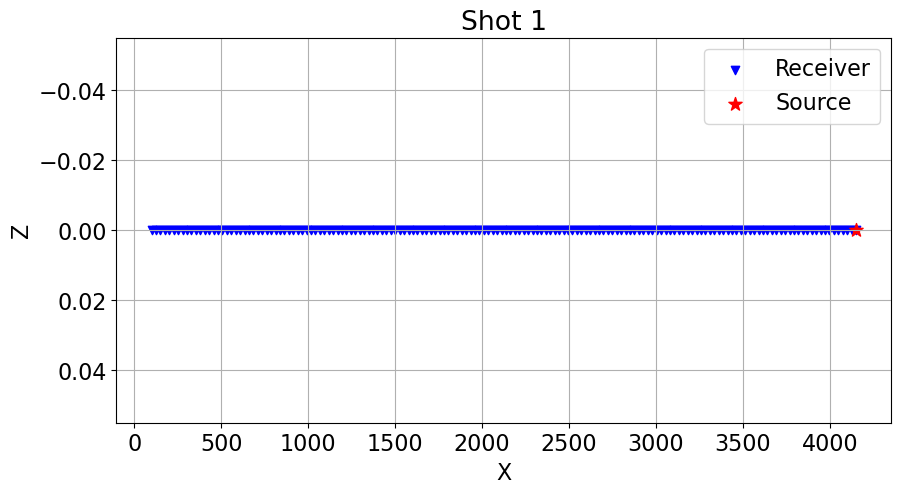

In [52]:
plot_shot_gather(recs_coordinate, srcs_coordinate, 1)

In [53]:
import matplotlib.pyplot as plt

def plot_all_shots(receiver_coords, source_coords):
    nshot = source_coords.shape[0]

    plt.figure(figsize=(12, 6))

    for shot in range(nshot):
        recs_x = receiver_coords[shot, :, 0]  # ambil hanya x receiver
        shot_num = [shot] * len(recs_x)       # y-nya: nomor shot yang sama

        # plot receiver
        plt.scatter(recs_x, shot_num, color='blue', s=5, label='Receiver' if shot == 0 else "")

        # plot source
        plt.scatter(source_coords[shot, 0], shot, color='red', marker='*', s=30, label='Source' if shot == 0 else "")

    plt.xlabel('X Coordinate')
    plt.ylabel('Shot Number')
    plt.title('Source & Receiver Coordinates per Shot')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


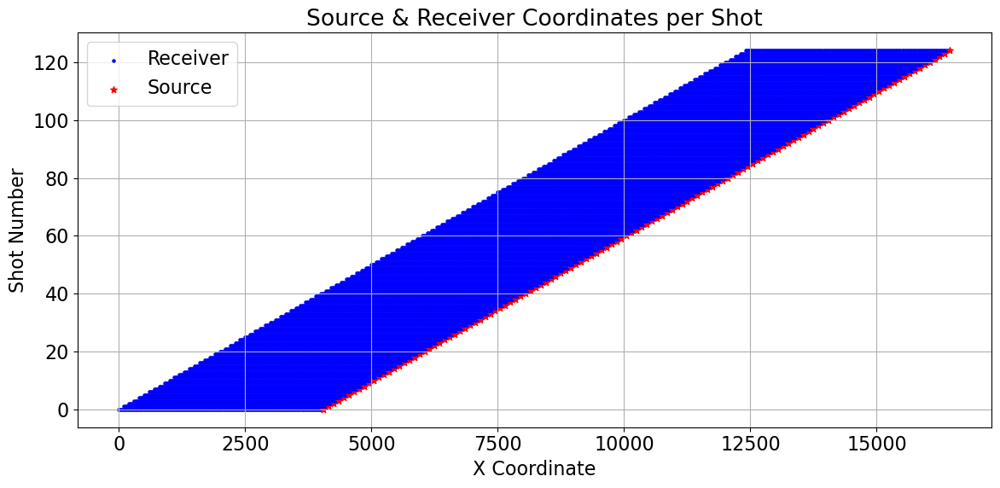

In [54]:
plot_all_shots(recs_coordinate, srcs_coordinate)

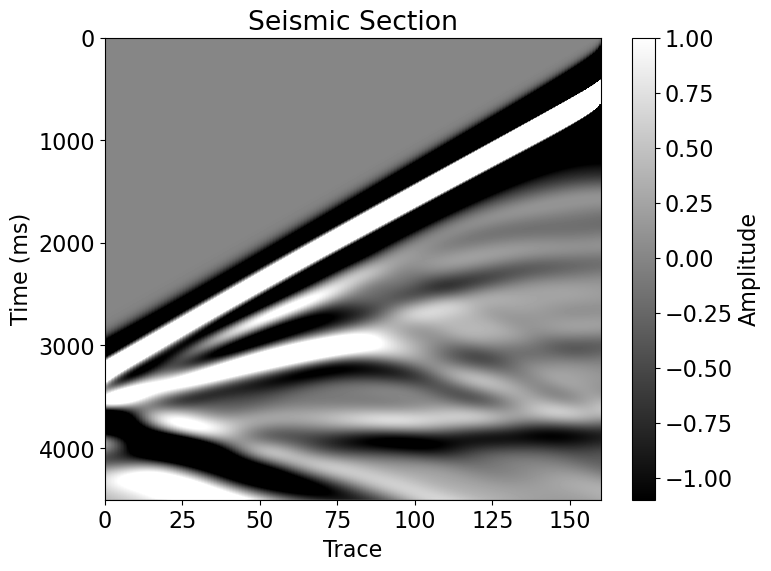

In [48]:
from examples.seismic.acoustic import AcousticWaveSolver

solver = AcousticWaveSolver(model1, geometrys[0], space_order=2)

d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[0].time_axis, 
                         coordinates=geometrys[0].rec_positions)

_, _, _ = solver.forward(vp=update_model.vp, src=srcs[0], rec=d_obs)

plt.imshow(d_obs.data, aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmax=-1, vmin=1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()

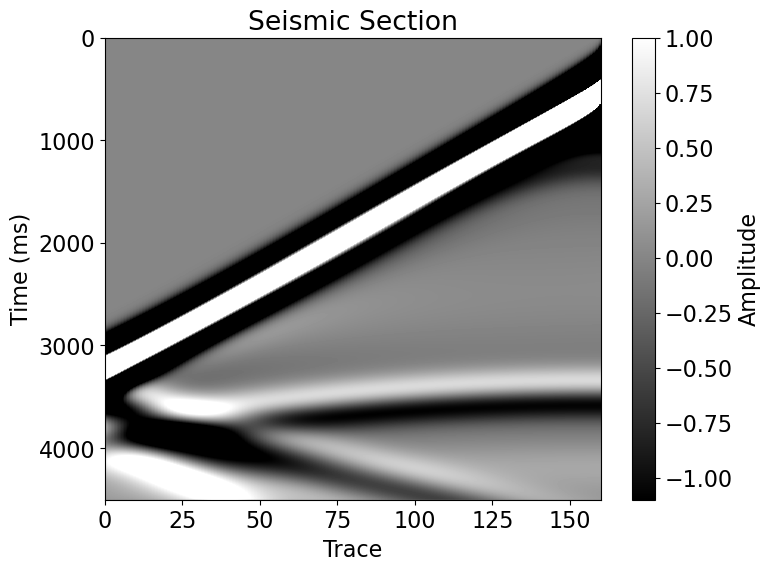

In [47]:
from examples.seismic.acoustic import AcousticWaveSolver

solver = AcousticWaveSolver(model1, geometrys[0], space_order=4)

d_obs = Receiver(name='d_obs', grid=model0.grid,
                         time_range=geometrys[0].time_axis, 
                         coordinates=geometrys[0].rec_positions)

_, _, _ = solver.forward(vp=model0.vp, src=srcs[0], rec=d_obs)

plt.imshow(d_obs.data, aspect='auto', cmap='gray', extent=[0, 160, 4504, 0], vmax=-1, vmin=1)
plt.xlabel('Trace')
plt.ylabel('Time (ms)')
plt.title('Seismic Section')
plt.colorbar(label='Amplitude')
plt.show()